# Entorno

In [26]:
isLocalhost = True

# Conectarse a Google Drive

In [27]:
if isLocalhost == False:
    from google.colab import drive
    drive.mount('/content/drive')

# Importar librerias

In [28]:
import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.applications import InceptionV3,EfficientNetB0
from keras.models import Model, load_model
from keras.layers import GlobalAveragePooling2D, Dense, Dropout
from keras.optimizers import SGD,Adam
from keras.callbacks import ModelCheckpoint, CSVLogger
from tensorflow.keras.preprocessing import image
from keras import regularizers
from keras import backend as K
from keras.metrics import Precision, Recall
import sys

import pandas as pd
import matplotlib.pyplot as plt

import tensorflow as tf
import numpy as np
import json

import collections
from collections import defaultdict
import pandas as pd
import os

from shutil import copy
from shutil import copytree, rmtree

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Cargar datos

In [29]:
train = pd.read_csv("/content/drive/MyDrive/DesafioKaggle/train.csv") if isLocalhost == False else pd.read_csv("train.csv")
train.head()

,path,food_category,dish,classes
0,images/bibimbap/2857696.jpg,2,69,2 69
1,images/prime_rib/2280209.jpg,2,79,2 79
2,images/chicken_quesadilla/823085.jpg,2,60,2 60
3,images/bread_pudding/3141232.jpg,1,83,1 83
4,images/beignets/2139636.jpg,1,68,1 68


In [30]:
test = pd.read_csv("/content/drive/MyDrive/DesafioKaggle/test.csv") if isLocalhost == False else pd.read_csv("test.csv")
test.head()

,path
0,images/caprese_salad/820512.jpg
1,images/hamburger/2062556.jpg
2,images/lasagna/2381454.jpg
3,images/ceviche/1995.jpg
4,images/poutine/892377.jpg


In [31]:
dish_json_file = open("/content/drive/MyDrive/DesafioKaggle/dish_dict.json","r") if isLocalhost == False else open("dish_dict.json","r")
dish_json_dict = json.load(dish_json_file)

food_categories_file = open("/content/drive/MyDrive/DesafioKaggle/food_categories_dict.json")  if isLocalhost == False else open("food_categories_dict.json","r")
food_categories_dict = json.load(food_categories_file)

hierarchy_file = open("/content/drive/MyDrive/DesafioKaggle/hierarchy_dict.json")  if isLocalhost == False else open("hierarchy_dict.json","r")
hierarchy_dict = json.load(hierarchy_file)

print(dish_json_dict.keys())
print(food_categories_dict.keys())
print(hierarchy_dict.keys())

dict_keys(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71', '72', '73', '74', '75', '76', '77', '78', '79', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89', '90', '91', '92', '93', '94', '95', '96', '97', '98', '99', '100'])
dict_keys(['0', '1', '2'])
dict_keys(['salad', 'dessert', 'main_dish'])


# Check Data

In [32]:
if isLocalhost == False:
    print("Total ejemplos de entrenamiento:")
    !find /content/drive/MyDrive/DesafioKaggle/train -type d -or -type f -printf '.' | wc -c

In [33]:
if isLocalhost == False:
    print("Total ejemplos de testing:")
    !find /content/drive/MyDrive/DesafioKaggle/test -type d -or -type f -printf '.' | wc -c

# Preprocesamiento

Separa los datos de testing en dos carpetas:

    /val  => La primera mitad se usará como conjunto de validación.
    /test => La segunda mitad se usará como conjunto de testing.
    
Creamos una carpeta para los datos de entrenamiento:
    
    /train

In [34]:
def separe_data(df,isTrain,src,dest_train,dest_val, dest_test):
    classes_images = defaultdict(list)
    for i in range(df.shape[0]):
        folder,food,name = df["path"][i].split('/')
        #print(folder,food,name)
        classes_images[food].append(name)
    pos = 0
    for food in classes_images.keys():
        pos += 1
        print("\nN°: "+str(pos)+"/101","\nCategoría:",food,"\nCantidad: ",len(classes_images[food]))
        if not os.path.exists(os.path.join(dest_val,food)):
            os.makedirs(os.path.join(dest_val,food))
        if not os.path.exists(os.path.join(dest_test,food)):
            os.makedirs(os.path.join(dest_test,food))
        if not os.path.exists(os.path.join(dest_train,food)):
            os.makedirs(os.path.join(dest_train,food))
        count = 0
        for i in classes_images[food]:
            count += 1
            if isTrain == True:
                copy(os.path.join(src,food,i), os.path.join(dest_train,food,i))
            else: 
                if count >= 125:
                    copy(os.path.join(src,food,i), os.path.join(dest_val,food,i))
                else:
                    copy(os.path.join(src,food,i), os.path.join(dest_test,food,i))

In [ ]:
#separe_data(test,False,"images","","val","test")

In [35]:
#separe_data(train,True,"images","train","","")

# Modelo

In [36]:
n_classes = 101
img_width, img_height = 299, 299

train_data_dir = 'train' if isLocalhost == True else '/content/drive/MyDrive/DesafioKaggle/train' 
validation_data_dir = 'val' if isLocalhost == True else '/content/drive/MyDrive/DesafioKaggle/val' 
testing_data_dir = 'test' if isLocalhost == True else '/content/drive/MyDrive/DesafioKaggle/test' 

nb_train_samples = 75750
nb_validation_samples = 25250

batch_size = 128

**Train**

In [37]:
train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)
train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical'
)

Found 75750 images belonging to 101 classes.


**Test**

In [38]:
test_datagen = ImageDataGenerator(rescale=1. / 255)

**Validation**

In [39]:
validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical'
)

Found 12726 images belonging to 101 classes.


#### Optimizadores

In [47]:
learning_rate = 0.001
optimizer_Adam = Adam(learning_rate=learning_rate, beta_1=0.9, beta_2=0.999, epsilon=1e-07, amsgrad=False, decay=0.01)
optimizer_AdamW = tf.keras.optimizers.AdamW(learning_rate=learning_rate,weight_decay=0.01)
optimizer_SDG = SGD(learning_rate=learning_rate, momentum=0.9)

**Callbacks**

In [49]:
filename = 'modelo_7'
checkpointer = ModelCheckpoint(filepath=filename+'.hdf5', verbose=1)
csv_logger = CSVLogger(filename+'.log')

**Métricas**

In [50]:
metrics=['accuracy',Precision(),Recall()]

#### Modelo

In [54]:
inception = InceptionV3(weights='imagenet', include_top=False)
for layer in inception.layers:
    layer.trainable = False
x = inception.output
#x = GlobalAveragePooling2D()(x)
#x = Dense(128, activation='relu')(x)
#x = Dense(128, activation='relu')(x)
#x = Dropout(0.2)(x)
predictions = Dense(n_classes, kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)

model = Model(inputs=inception.input, outputs=predictions)
model.summary()

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_10 (InputLayer)          [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d_846 (Conv2D)            (None, None, None,   864         ['input_10[0][0]']               
                                32)                                                               
                                                                                                  
 batch_normalization_846 (Batch  (None, None, None,   96         ['conv2d_846[0][0]']             
 Normalization)                 32)                                                         

                                                                                                  
 average_pooling2d_81 (AverageP  (None, None, None,   0          ['max_pooling2d_37[0][0]']       
 ooling2D)                      192)                                                              
                                                                                                  
 conv2d_851 (Conv2D)            (None, None, None,   12288       ['max_pooling2d_37[0][0]']       
                                64)                                                               
                                                                                                  
 conv2d_853 (Conv2D)            (None, None, None,   76800       ['activation_852[0][0]']         
                                64)                                                               
                                                                                                  
 conv2d_85

                                                                                                  
 conv2d_864 (Conv2D)            (None, None, None,   16384       ['average_pooling2d_82[0][0]']   
                                64)                                                               
                                                                                                  
 batch_normalization_858 (Batch  (None, None, None,   192        ['conv2d_858[0][0]']             
 Normalization)                 64)                                                               
                                                                                                  
 batch_normalization_860 (Batch  (None, None, None,   192        ['conv2d_860[0][0]']             
 Normalization)                 64)                                                               
                                                                                                  
 batch_nor

                                                                                                  
 batch_normalization_871 (Batch  (None, None, None,   192        ['conv2d_871[0][0]']             
 Normalization)                 64)                                                               
                                                                                                  
 activation_865 (Activation)    (None, None, None,   0           ['batch_normalization_865[0][0]']
                                64)                                                               
                                                                                                  
 activation_867 (Activation)    (None, None, None,   0           ['batch_normalization_867[0][0]']
                                64)                                                               
                                                                                                  
 activatio

                                128)                                                              
                                                                                                  
 conv2d_882 (Conv2D)            (None, None, None,   114688      ['activation_881[0][0]']         
                                128)                                                              
                                                                                                  
 batch_normalization_877 (Batch  (None, None, None,   384        ['conv2d_877[0][0]']             
 Normalization)                 128)                                                              
                                                                                                  
 batch_normalization_882 (Batch  (None, None, None,   384        ['conv2d_882[0][0]']             
 Normalization)                 128)                                                              
          

 Normalization)                 160)                                                              
                                                                                                  
 activation_890 (Activation)    (None, None, None,   0           ['batch_normalization_890[0][0]']
                                160)                                                              
                                                                                                  
 conv2d_891 (Conv2D)            (None, None, None,   179200      ['activation_890[0][0]']         
                                160)                                                              
                                                                                                  
 batch_normalization_891 (Batch  (None, None, None,   480        ['conv2d_891[0][0]']             
 Normalization)                 160)                                                              
          

 activation_894 (Activation)    (None, None, None,   0           ['batch_normalization_894[0][0]']
                                192)                                                              
                                                                                                  
 activation_895 (Activation)    (None, None, None,   0           ['batch_normalization_895[0][0]']
                                192)                                                              
                                                                                                  
 mixed5 (Concatenate)           (None, None, None,   0           ['activation_886[0][0]',         
                                768)                              'activation_889[0][0]',         
                                                                  'activation_894[0][0]',         
                                                                  'activation_895[0][0]']         
          

 batch_normalization_899 (Batch  (None, None, None,   576        ['conv2d_899[0][0]']             
 Normalization)                 192)                                                              
                                                                                                  
 batch_normalization_904 (Batch  (None, None, None,   576        ['conv2d_904[0][0]']             
 Normalization)                 192)                                                              
                                                                                                  
 batch_normalization_905 (Batch  (None, None, None,   576        ['conv2d_905[0][0]']             
 Normalization)                 192)                                                              
                                                                                                  
 activation_896 (Activation)    (None, None, None,   0           ['batch_normalization_896[0][0]']
          

 conv2d_906 (Conv2D)            (None, None, None,   147456      ['mixed6[0][0]']                 
                                192)                                                              
                                                                                                  
 conv2d_909 (Conv2D)            (None, None, None,   258048      ['activation_908[0][0]']         
                                192)                                                              
                                                                                                  
 conv2d_914 (Conv2D)            (None, None, None,   258048      ['activation_913[0][0]']         
                                192)                                                              
                                                                                                  
 conv2d_915 (Conv2D)            (None, None, None,   147456      ['average_pooling2d_87[0][0]']   
          

 batch_normalization_917 (Batch  (None, None, None,   960        ['conv2d_917[0][0]']             
 Normalization)                 320)                                                              
                                                                                                  
 batch_normalization_921 (Batch  (None, None, None,   576        ['conv2d_921[0][0]']             
 Normalization)                 192)                                                              
                                                                                                  
 activation_917 (Activation)    (None, None, None,   0           ['batch_normalization_917[0][0]']
                                320)                                                              
                                                                                                  
 activation_921 (Activation)    (None, None, None,   0           ['batch_normalization_921[0][0]']
          

                                384)                                                              
                                                                                                  
 activation_925 (Activation)    (None, None, None,   0           ['batch_normalization_925[0][0]']
                                384)                                                              
                                                                                                  
 activation_928 (Activation)    (None, None, None,   0           ['batch_normalization_928[0][0]']
                                384)                                                              
                                                                                                  
 activation_929 (Activation)    (None, None, None,   0           ['batch_normalization_929[0][0]']
                                384)                                                              
          

 Normalization)                 384)                                                              
                                                                                                  
 batch_normalization_938 (Batch  (None, None, None,   1152       ['conv2d_938[0][0]']             
 Normalization)                 384)                                                              
                                                                                                  
 conv2d_939 (Conv2D)            (None, None, None,   393216      ['average_pooling2d_89[0][0]']   
                                192)                                                              
                                                                                                  
 batch_normalization_931 (Batch  (None, None, None,   960        ['conv2d_931[0][0]']             
 Normalization)                 320)                                                              
          

Entrenar el modelo

In [55]:
model.compile(optimizer=optimizer_AdamW, loss='categorical_crossentropy', metrics=metrics)
history = model_2.fit(train_generator,
                    steps_per_epoch=nb_train_samples // batch_size,
                    validation_data=validation_generator,
                    validation_steps=nb_validation_samples // batch_size,
                    epochs=1,
                    verbose=1,
                    callbacks=[csv_logger, checkpointer])

model.save(filename+'.hdf5')

  7/591 [..............................] - ETA: 1:00:26 - loss: 5.1102 - accuracy: 0.0212 - precision_2: 0.0000e+00 - recall_2: 0.0000e+00

KeyboardInterrupt: 

In [82]:
from sklearn.metrics import f1_score
import numpy as np

import tensorflow as tf

def f1_macro():
    return 2*Precision()*Recall()/(Recall()+Precision())


# Leer Modelo

In [18]:
model_respaldo = load_model(filename+".hdf5", compile=False)

In [63]:
model_respaldo2 = load_model("modelo2.hdf5", compile=False)

In [20]:
def predict_class(model, images, show = True):
    num_images = len(images)
    num_columns = 3
    num_rows = (num_images + num_columns - 1) // num_columns
    for img in images:
        name = img
        img = image.load_img(img, target_size=(299, 299))
        img = image.img_to_array(img)                    
        img = np.expand_dims(img, axis=0)         
        img /= 255.                                      

        pred = model.predict(img)
        index = np.argmax(pred)
        food_list.sort()
        pred_value = food_list[index]
        if show:
            plt.figure(figsize=(2,2))
            plt.imshow(img[0])                           
            plt.axis('off')
            plt.title('Real: '+name+'     Predict: '+pred_value)
            plt.show()

In [3]:
food_list = ["foie_gras","club_sandwich","cheese_plate","cup_cakes","garlic_bread","gnocchi","ice_cream","samosa","donuts","tuna_tartare","filet_mignon","seaweed_salad","french_toast","chicken_curry","shrimp_and_grits","steak","cheesecake","red_velvet_cake","waffles","churros","gyoza","lobster_roll_sandwich","huevos_rancheros","breakfast_burrito","grilled_cheese_sandwich","spaghetti_bolognese","falafel","poutine","greek_salad","beef_tartare","fried_calamari","guacamole","ravioli","lobster_bisque","beet_salad","risotto","crab_cakes","strawberry_shortcake","edamame","ceviche","hot_and_sour_soup","spring_rolls","sashimi","paella","clam_chowder","miso_soup","escargots","hot_dog","pulled_pork_sandwich","bruschetta","panna_cotta","fish_and_chips","pad_thai","tiramisu","takoyaki","macarons","apple_pie","cannoli","scallops","frozen_yogurt","chicken_quesadilla","mussels","beef_carpaccio","eggs_benedict","spaghetti_carbonara","omelette","sushi","chocolate_mousse","beignets","bibimbap","hummus","pork_chop","chicken_wings","grilled_salmon","chocolate_cake","tacos","hamburger","baby_back_ribs","pancakes","prime_rib","pizza","nachos","macaroni_and_cheese","bread_pudding","ramen","croque_madame","lasagna","peking_duck","deviled_eggs","french_fries","dumplings","fried_rice","french_onion_soup","pho","caprese_salad","oysters","baklava","creme_brulee","carrot_cake","onion_rings","caesar_salad"]

Guardar los path en una lista

In [22]:
lista = []
for i in range(test.shape[0]):
    lista.append(test["path"][i])

Obtener la categoría y subcategoría de una clase predecida

In [24]:
def getInfo(food):
    cont = 0
    for category in hierarchy_dict.keys():
        for subcategory in hierarchy_dict[category].keys():
            if food == hierarchy_dict[category][subcategory]:
                return cont,category,subcategory,hierarchy_dict[category][subcategory]
        cont += 1
    return None   

# Clasificar las imágenes del conjunto de testing

list_c_keys = []
list_c = []

list_sc_keys = []
list_sc = []

list_class = []
list_class_pred = []
cont = 0;
for img in lista:
    cont += 1
    path = img
    img = image.load_img(img, target_size=(299, 299))
    img = image.img_to_array(img)                    
    img = np.expand_dims(img, axis=0)         
    img /= 255.
    pred = model_respaldo.predict(img)
    index = np.argmax(pred)
    food_list.sort()
    pred_value = food_list[index]
    c_key,c,sc_key,sc = getInfo(pred_value)
    print(cont,"/25250 =>",path," => ",c_key,c,sc_key,sc)
    list_c_keys.append(c_key)
    list_c.append(c)
    list_sc_keys.append(sc_key)
    list_sc.append(sc)
    list_class.append(path.split('/')[1])
    list_class_pred.append(sc)

In [82]:
list_c_keys2 = []
list_c2 = []

list_sc_keys2 = []
list_sc2 = []

list_class2 = []
list_class_pre2 = []
cont = 0;
for img in lista:
    cont += 1
    path = img
    img = image.load_img(img, target_size=(299, 299))
    img = image.img_to_array(img)                    
    img = np.expand_dims(img, axis=0)         
    img /= 255.
    pred = model_respaldo2.predict(img)
    index = np.argmax(pred)
    food_list.sort()
    pred_value = food_list[index]
    c_key,c,sc_key,sc = getInfo(pred_value)
    print(cont,"/25250 =>",path," => ",c_key,c,sc_key,sc)
    list_c_keys2.append(c_key)
    list_c2.append(c)
    list_sc_keys2.append(sc_key)
    list_sc2.append(sc)
    list_class2.append(path.split('/')[1])
    list_class_pred2.append(sc)

1/1 [==============================] - 1s 1s/step
1 /25250 => images/caprese_salad/820512.jpg  =>  0 salad 3 caprese_salad
1/1 [==============================] - 0s 87ms/step
2 /25250 => images/hamburger/2062556.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 96ms/step
3 /25250 => images/lasagna/2381454.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 0s 98ms/step
4 /25250 => images/ceviche/1995.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 0s 98ms/step
5 /25250 => images/poutine/892377.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 0s 95ms/step
6 /25250 => images/beef_tartare/2231866.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 0s 100ms/step
7 /25250 => images/caesar_salad/520203.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 0s 102ms/step
8 /25250 => images/clam_chowder/3893405.jpg  =>  2 main_dish 11 clam_chowder
1/1 [========================

1/1 [==============================] - 0s 95ms/step
67 /25250 => images/ramen/703171.jpg  =>  2 main_dish 60 ramen
1/1 [==============================] - 0s 91ms/step
68 /25250 => images/greek_salad/2701949.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 0s 92ms/step
69 /25250 => images/baklava/2796430.jpg  =>  1 dessert 15 macarons
1/1 [==============================] - 0s 87ms/step
70 /25250 => images/grilled_salmon/1499686.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 0s 90ms/step
71 /25250 => images/tacos/2458414.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 0s 91ms/step
72 /25250 => images/gyoza/496237.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 0s 102ms/step
73 /25250 => images/cheese_plate/123937.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 0s 91ms/step
74 /25250 => images/foie_gras/1531457.jpg  =>  1 dessert 3 bread_pudding
1/1 [======================

1/1 [==============================] - 0s 90ms/step
197 /25250 => images/cheesecake/3807015.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 91ms/step
198 /25250 => images/gyoza/513659.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 0s 95ms/step
199 /25250 => images/caesar_salad/2059363.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 0s 92ms/step
200 /25250 => images/grilled_salmon/2918352.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 88ms/step
201 /25250 => images/hummus/3148200.jpg  =>  2 main_dish 11 clam_chowder
1/1 [==============================] - 0s 116ms/step
202 /25250 => images/baby_back_ribs/3154398.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 0s 96ms/step
203 /25250 => images/poutine/348425.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 0s 93ms/step
204 /25250 => images/french_fries/778600.jpg  =>  2 main_dish 24 french_fries
1/1 

1/1 [==============================] - 0s 89ms/step
262 /25250 => images/club_sandwich/638566.jpg  =>  2 main_dish 12 club_sandwich
1/1 [==============================] - 0s 86ms/step
263 /25250 => images/cannoli/3652153.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 91ms/step
264 /25250 => images/club_sandwich/3861714.jpg  =>  2 main_dish 12 club_sandwich
1/1 [==============================] - 0s 89ms/step
265 /25250 => images/falafel/731206.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 0s 91ms/step
266 /25250 => images/macaroni_and_cheese/992927.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 0s 90ms/step
267 /25250 => images/spaghetti_carbonara/1222289.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 0s 89ms/step
268 /25250 => images/tacos/2189723.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 0s 89ms/step
269 /25250 => images/carrot_cake/2426851.jpg  =>  1 dessert 9 ch

390 /25250 => images/filet_mignon/3780017.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 0s 106ms/step
391 /25250 => images/baklava/3197842.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 97ms/step
392 /25250 => images/steak/1485083.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 0s 93ms/step
393 /25250 => images/falafel/745065.jpg  =>  2 main_dish 20 falafel
1/1 [==============================] - 0s 96ms/step
394 /25250 => images/pancakes/768099.jpg  =>  2 main_dish 52 pancakes
1/1 [==============================] - 0s 96ms/step
395 /25250 => images/beignets/3730214.jpg  =>  1 dessert 2 beignets
1/1 [==============================] - 0s 93ms/step
396 /25250 => images/french_fries/244006.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 0s 100ms/step
397 /25250 => images/filet_mignon/3645971.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 0s 104ms/step
398 /252

1/1 [==============================] - 0s 100ms/step
519 /25250 => images/mussels/1113615.jpg  =>  2 main_dish 45 mussels
1/1 [==============================] - 0s 101ms/step
520 /25250 => images/baklava/2751927.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 97ms/step
521 /25250 => images/macarons/1850523.jpg  =>  1 dessert 15 macarons
1/1 [==============================] - 0s 100ms/step
522 /25250 => images/nachos/3129872.jpg  =>  2 main_dish 46 nachos
1/1 [==============================] - 0s 99ms/step
523 /25250 => images/guacamole/3919531.jpg  =>  2 main_dish 33 guacamole
1/1 [==============================] - 0s 95ms/step
524 /25250 => images/beignets/530141.jpg  =>  1 dessert 2 beignets
1/1 [==============================] - 0s 99ms/step
525 /25250 => images/chocolate_mousse/2036876.jpg  =>  1 dessert 8 chocolate_mousse
1/1 [==============================] - 0s 98ms/step
526 /25250 => images/peking_duck/374396.jpg  =>  2 main_dish 53 peking_duck
1/1 [=====

1/1 [==============================] - 0s 100ms/step
584 /25250 => images/greek_salad/1486418.jpg  =>  0 salad 3 caprese_salad
1/1 [==============================] - 0s 105ms/step
585 /25250 => images/crab_cakes/937161.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 0s 106ms/step
586 /25250 => images/oysters/543282.jpg  =>  2 main_dish 49 oysters
1/1 [==============================] - 0s 89ms/step
587 /25250 => images/guacamole/1185569.jpg  =>  2 main_dish 33 guacamole
1/1 [==============================] - 0s 104ms/step
588 /25250 => images/falafel/235831.jpg  =>  1 dessert 4 cannoli
1/1 [==============================] - 0s 106ms/step
589 /25250 => images/carrot_cake/779581.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 0s 98ms/step
590 /25250 => images/sushi/3586686.jpg  =>  2 main_dish 71 sushi
1/1 [==============================] - 0s 114ms/step
591 /25250 => images/gnocchi/1361375.jpg  =>  2 main_dish 30 gnocchi
1/1 [=================

1/1 [==============================] - 0s 90ms/step
649 /25250 => images/fish_and_chips/174111.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 0s 109ms/step
650 /25250 => images/breakfast_burrito/3750414.jpg  =>  2 main_dish 4 breakfast_burrito
1/1 [==============================] - 0s 103ms/step
651 /25250 => images/pancakes/1077952.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 0s 98ms/step
652 /25250 => images/samosa/1935942.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 0s 97ms/step
653 /25250 => images/takoyaki/3310338.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 0s 110ms/step
654 /25250 => images/pulled_pork_sandwich/1400643.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 102ms/step
655 /25250 => images/grilled_cheese_sandwich/424468.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 114ms/step
656 /25250 => images/breakfast_

1/1 [==============================] - 0s 92ms/step
714 /25250 => images/miso_soup/2163637.jpg  =>  2 main_dish 44 miso_soup
1/1 [==============================] - 0s 94ms/step
715 /25250 => images/beef_tartare/2909387.jpg  =>  2 main_dish 2 beef_tartare
1/1 [==============================] - 0s 94ms/step
716 /25250 => images/pork_chop/942955.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 0s 94ms/step
717 /25250 => images/panna_cotta/3818544.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 96ms/step
718 /25250 => images/beef_tartare/3494180.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 0s 91ms/step
719 /25250 => images/chicken_wings/3252604.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 0s 87ms/step
720 /25250 => images/pork_chop/1373542.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 0s 88ms/step
721 /25250 => images/beignets/1178229.jpg  

1/1 [==============================] - 0s 89ms/step
779 /25250 => images/fish_and_chips/2656495.jpg  =>  2 main_dish 50 pad_thai
1/1 [==============================] - 0s 105ms/step
780 /25250 => images/ice_cream/2931920.jpg  =>  1 dessert 14 ice_cream
1/1 [==============================] - 0s 91ms/step
781 /25250 => images/chicken_wings/281244.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 0s 99ms/step
782 /25250 => images/samosa/21443.jpg  =>  2 main_dish 34 gyoza
1/1 [==============================] - 0s 91ms/step
783 /25250 => images/omelette/3037442.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 0s 96ms/step
784 /25250 => images/churros/2647137.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 93ms/step
785 /25250 => images/fried_calamari/2266462.jpg  =>  2 main_dish 48 onion_rings
1/1 [==============================] - 0s 86ms/step
786 /25250 => images/macarons/451365.jpg  =>  1 dessert 15 macarons
1/1 [

1/1 [==============================] - 0s 94ms/step
844 /25250 => images/pad_thai/3635261.jpg  =>  2 main_dish 46 nachos
1/1 [==============================] - 0s 245ms/step
845 /25250 => images/beet_salad/1366665.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 0s 94ms/step
846 /25250 => images/chicken_quesadilla/2618613.jpg  =>  2 main_dish 9 chicken_quesadilla
1/1 [==============================] - 0s 107ms/step
847 /25250 => images/caprese_salad/3070486.jpg  =>  0 salad 3 caprese_salad
1/1 [==============================] - 0s 100ms/step
848 /25250 => images/cup_cakes/308933.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 0s 98ms/step
849 /25250 => images/mussels/117445.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 0s 98ms/step
850 /25250 => images/ice_cream/698179.jpg  =>  1 dessert 3 bread_pudding
1/1 [==============================] - 0s 104ms/step
851 /25250 => images/hot_dog/537584.jpg  =>  2 main_dish 37 hot_

1/1 [==============================] - 0s 93ms/step
909 /25250 => images/hot_dog/1183508.jpg  =>  2 main_dish 71 sushi
1/1 [==============================] - 0s 95ms/step
910 /25250 => images/bruschetta/2007151.jpg  =>  0 salad 3 caprese_salad
1/1 [==============================] - 0s 94ms/step
911 /25250 => images/waffles/750964.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 0s 101ms/step
912 /25250 => images/pancakes/326627.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 0s 91ms/step
913 /25250 => images/chicken_curry/1236329.jpg  =>  2 main_dish 8 chicken_curry
1/1 [==============================] - 0s 90ms/step
914 /25250 => images/pad_thai/1513522.jpg  =>  2 main_dish 50 pad_thai
1/1 [==============================] - 0s 86ms/step
915 /25250 => images/filet_mignon/1666949.jpg  =>  2 main_dish 21 filet_mignon
1/1 [==============================] - 0s 96ms/step
916 /25250 => images/creme_brulee/1794151.jpg  =>  2 main_dish 62 risotto


1/1 [==============================] - 0s 190ms/step
974 /25250 => images/cheese_plate/3624274.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 0s 117ms/step
975 /25250 => images/scallops/1573489.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 0s 89ms/step
976 /25250 => images/fried_rice/2070073.jpg  =>  2 main_dish 28 fried_rice
1/1 [==============================] - 0s 92ms/step
977 /25250 => images/croque_madame/2454598.jpg  =>  2 main_dish 14 croque_madame
1/1 [==============================] - 0s 92ms/step
978 /25250 => images/strawberry_shortcake/2407451.jpg  =>  1 dessert 3 bread_pudding
1/1 [==============================] - 0s 97ms/step
979 /25250 => images/fried_rice/3298068.jpg  =>  2 main_dish 28 fried_rice
1/1 [==============================] - 0s 90ms/step
980 /25250 => images/deviled_eggs/3919187.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 0s 99ms/step
981 /25250 => images/fried_rice/35055

1/1 [==============================] - 0s 195ms/step
1038 /25250 => images/greek_salad/2193158.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 0s 100ms/step
1039 /25250 => images/deviled_eggs/3152555.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 0s 171ms/step
1040 /25250 => images/hot_dog/3070661.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 0s 193ms/step
1041 /25250 => images/escargots/2409832.jpg  =>  2 main_dish 45 mussels
1/1 [==============================] - 0s 85ms/step
1042 /25250 => images/tuna_tartare/3557735.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 0s 92ms/step
1043 /25250 => images/donuts/3605668.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 0s 149ms/step
1044 /25250 => images/fried_rice/2795403.jpg  =>  2 main_dish 28 fried_rice
1/1 [==============================] - 0s 86ms/step
1045 /25250 => images/tuna_tartare/2989138.jpg  =>  2 main_dis

1/1 [==============================] - 0s 93ms/step
1102 /25250 => images/omelette/440211.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 0s 92ms/step
1103 /25250 => images/cup_cakes/2648441.jpg  =>  1 dessert 8 chocolate_mousse
1/1 [==============================] - 0s 90ms/step
1104 /25250 => images/chicken_wings/1069618.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 0s 189ms/step
1105 /25250 => images/foie_gras/3029045.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 0s 140ms/step
1106 /25250 => images/tiramisu/124945.jpg  =>  1 dessert 19 tiramisu
1/1 [==============================] - 0s 99ms/step
1107 /25250 => images/baby_back_ribs/1478335.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 0s 98ms/step
1108 /25250 => images/huevos_rancheros/3736731.jpg  =>  2 main_dish 46 nachos
1/1 [==============================] - 0s 118ms/step
1109 /25250 => images/beef_tartare/2147140.jpg

1/1 [==============================] - 0s 93ms/step
1167 /25250 => images/ceviche/3073268.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 0s 91ms/step
1168 /25250 => images/spaghetti_carbonara/1677872.jpg  =>  1 dessert 0 apple_pie
1/1 [==============================] - 0s 90ms/step
1169 /25250 => images/eggs_benedict/3238266.jpg  =>  2 main_dish 18 eggs_benedict
1/1 [==============================] - 0s 88ms/step
1170 /25250 => images/seaweed_salad/976858.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 0s 90ms/step
1171 /25250 => images/french_onion_soup/1392711.jpg  =>  2 main_dish 25 french_onion_soup
1/1 [==============================] - 0s 90ms/step
1172 /25250 => images/paella/613429.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 0s 92ms/step
1173 /25250 => images/chicken_wings/1981669.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 0s 86ms/step
1174 /25250 => images/onion_ring

1/1 [==============================] - 0s 93ms/step
1231 /25250 => images/club_sandwich/2934672.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 0s 92ms/step
1232 /25250 => images/falafel/269459.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 0s 100ms/step
1233 /25250 => images/french_fries/2569827.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 0s 107ms/step
1234 /25250 => images/pho/1012513.jpg  =>  1 dessert 13 frozen_yogurt
1/1 [==============================] - 0s 99ms/step
1235 /25250 => images/tuna_tartare/1052688.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 0s 94ms/step
1236 /25250 => images/dumplings/2108794.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 0s 102ms/step
1237 /25250 => images/cannoli/1389241.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 0s 91ms/step
1238 /25250 => images/huevos_rancheros/3819592.jpg  =>

1/1 [==============================] - 0s 94ms/step
1295 /25250 => images/bread_pudding/560443.jpg  =>  1 dessert 0 apple_pie
1/1 [==============================] - 0s 90ms/step
1296 /25250 => images/beignets/2278359.jpg  =>  1 dessert 2 beignets
1/1 [==============================] - 0s 92ms/step
1297 /25250 => images/lasagna/2481780.jpg  =>  1 dessert 3 bread_pudding
1/1 [==============================] - 0s 90ms/step
1298 /25250 => images/eggs_benedict/471699.jpg  =>  2 main_dish 18 eggs_benedict
1/1 [==============================] - 0s 94ms/step
1299 /25250 => images/ceviche/2910108.jpg  =>  1 dessert 3 bread_pudding
1/1 [==============================] - 0s 94ms/step
1300 /25250 => images/bibimbap/3735203.jpg  =>  2 main_dish 3 bibimbap
1/1 [==============================] - 0s 94ms/step
1301 /25250 => images/hamburger/1643851.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 0s 93ms/step
1302 /25250 => images/prime_rib/175871.jpg  =>  2 main_dish 21 filet_mi

1/1 [==============================] - 0s 93ms/step
1360 /25250 => images/baby_back_ribs/2023500.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 0s 93ms/step
1361 /25250 => images/chicken_wings/3250522.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 0s 94ms/step
1362 /25250 => images/hot_dog/3412217.jpg  =>  2 main_dish 37 hot_dog
1/1 [==============================] - 0s 92ms/step
1363 /25250 => images/onion_rings/319892.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 94ms/step
1364 /25250 => images/pho/2994722.jpg  =>  2 main_dish 54 pho
1/1 [==============================] - 0s 93ms/step
1365 /25250 => images/nachos/1862829.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 0s 93ms/step
1366 /25250 => images/apple_pie/2447421.jpg  =>  1 dessert 6 cheesecake
1/1 [==============================] - 0s 91ms/step
1367 /25250 => images/scallops/3569756.jpg  =>  2 main_dish 65 scallops
1/1 [=

1/1 [==============================] - 0s 97ms/step
1425 /25250 => images/omelette/2897490.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 0s 96ms/step
1426 /25250 => images/caesar_salad/1694332.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 0s 97ms/step
1427 /25250 => images/lobster_bisque/1841296.jpg  =>  2 main_dish 41 lobster_bisque
1/1 [==============================] - 0s 95ms/step
1428 /25250 => images/creme_brulee/2487594.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 0s 103ms/step
1429 /25250 => images/peking_duck/343959.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 0s 98ms/step
1430 /25250 => images/baklava/2522061.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 126ms/step
1431 /25250 => images/spring_rolls/2931825.jpg  =>  2 main_dish 69 spring_rolls
1/1 [==============================] - 0s 122ms/step
1432 /25250 => images/edamame/1844685.jpg  =>  2 mai

1/1 [==============================] - 0s 93ms/step
1553 /25250 => images/macaroni_and_cheese/1825988.jpg  =>  1 dessert 0 apple_pie
1/1 [==============================] - 0s 103ms/step
1554 /25250 => images/fried_calamari/1591240.jpg  =>  2 main_dish 22 fish_and_chips
1/1 [==============================] - 0s 89ms/step
1555 /25250 => images/macarons/492902.jpg  =>  1 dessert 15 macarons
1/1 [==============================] - 0s 93ms/step
1556 /25250 => images/sashimi/1551758.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 0s 95ms/step
1557 /25250 => images/garlic_bread/3407748.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 0s 121ms/step
1558 /25250 => images/ice_cream/626780.jpg  =>  1 dessert 8 chocolate_mousse
1/1 [==============================] - 0s 115ms/step
1559 /25250 => images/gyoza/2787610.jpg  =>  2 main_dish 34 gyoza
1/1 [==============================] - 0s 92ms/step
1560 /25250 => images/scallops/2828337.jpg  =>  2 main_

1/1 [==============================] - 0s 148ms/step
1618 /25250 => images/beignets/2339240.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 91ms/step
1619 /25250 => images/paella/1678728.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 0s 203ms/step
1620 /25250 => images/pancakes/875912.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 94ms/step
1621 /25250 => images/beignets/997350.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 114ms/step
1622 /25250 => images/steak/2088195.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 0s 128ms/step
1623 /25250 => images/french_toast/1355453.jpg  =>  2 main_dish 26 french_toast
1/1 [==============================] - 0s 92ms/step
1624 /25250 => images/cheese_plate/164051.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 0s 209ms/step
1625 /25250 => images/cheese_plate/1956778.jpg  =>  2 main_dish 7 cheese_

1/1 [==============================] - 0s 98ms/step
1683 /25250 => images/beet_salad/1078947.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 0s 97ms/step
1684 /25250 => images/lasagna/3622052.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 0s 136ms/step
1685 /25250 => images/omelette/1553315.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 113ms/step
1686 /25250 => images/chicken_quesadilla/1011413.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 0s 180ms/step
1687 /25250 => images/creme_brulee/1720013.jpg  =>  1 dessert 10 creme_brulee
1/1 [==============================] - 0s 107ms/step
1688 /25250 => images/bread_pudding/27005.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 189ms/step
1689 /25250 => images/clam_chowder/1864565.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 0s 91ms/step
1690 /25250 => images/chocolate_mousse/268321.jpg  =>  1 desse

1/1 [==============================] - 0s 118ms/step
1747 /25250 => images/dumplings/1142573.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 0s 168ms/step
1748 /25250 => images/churros/705120.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 0s 171ms/step
1749 /25250 => images/eggs_benedict/395784.jpg  =>  2 main_dish 65 scallops
1/1 [==============================] - 0s 96ms/step
1750 /25250 => images/caesar_salad/3176445.jpg  =>  0 salad 2 caesar_salad
1/1 [==============================] - 0s 198ms/step
1751 /25250 => images/baby_back_ribs/626228.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 0s 97ms/step
1752 /25250 => images/caesar_salad/181240.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 0s 92ms/step
1753 /25250 => images/red_velvet_cake/2123891.jpg  =>  1 dessert 17 red_velvet_cake
1/1 [==============================] - 0s 92ms/step
1754 /25250 => images/hummus/263433.jpg  =

1/1 [==============================] - 0s 97ms/step
1812 /25250 => images/bruschetta/634018.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 96ms/step
1813 /25250 => images/gnocchi/3042007.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 0s 95ms/step
1814 /25250 => images/hamburger/91602.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 0s 92ms/step
1815 /25250 => images/nachos/1270046.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 0s 97ms/step
1816 /25250 => images/hummus/1948950.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 0s 95ms/step
1817 /25250 => images/shrimp_and_grits/923212.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 0s 211ms/step
1818 /25250 => images/hot_dog/547307.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 0s 89ms/step
1819 /25250 => images/sashimi/1669998.jpg  =>  2 main_dish 64 sashimi
1/1 [===============

1/1 [==============================] - 0s 98ms/step
1877 /25250 => images/french_fries/2979208.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 0s 96ms/step
1878 /25250 => images/churros/1572415.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 98ms/step
1879 /25250 => images/cheesecake/2961165.jpg  =>  1 dessert 3 bread_pudding
1/1 [==============================] - 0s 94ms/step
1880 /25250 => images/ravioli/850822.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 0s 92ms/step
1881 /25250 => images/hot_and_sour_soup/867331.jpg  =>  2 main_dish 36 hot_and_sour_soup
1/1 [==============================] - 0s 97ms/step
1882 /25250 => images/hummus/3249058.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 0s 97ms/step
1883 /25250 => images/french_fries/2093557.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 0s 92ms/step
1884 /25250 => images/paella/1304025.jpg  =>  2 main_di

1/1 [==============================] - 0s 94ms/step
2005 /25250 => images/beef_carpaccio/2397556.jpg  =>  2 main_dish 74 tuna_tartare
1/1 [==============================] - 0s 98ms/step
2006 /25250 => images/takoyaki/1016857.jpg  =>  2 main_dish 21 filet_mignon
1/1 [==============================] - 0s 95ms/step
2007 /25250 => images/fried_calamari/3326303.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 99ms/step
2008 /25250 => images/onion_rings/564258.jpg  =>  2 main_dish 48 onion_rings
1/1 [==============================] - 0s 93ms/step
2009 /25250 => images/churros/518062.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 99ms/step
2010 /25250 => images/paella/1572135.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 0s 101ms/step
2011 /25250 => images/churros/3108547.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 0s 95ms/step
2012 /25250 => images/filet_mignon/1007877.jpg  =>  2 main_dish 21 filet

1/1 [==============================] - 0s 92ms/step
2070 /25250 => images/miso_soup/2409373.jpg  =>  2 main_dish 44 miso_soup
1/1 [==============================] - 0s 95ms/step
2071 /25250 => images/ramen/2581147.jpg  =>  2 main_dish 66 shrimp_and_grits
1/1 [==============================] - 0s 92ms/step
2072 /25250 => images/seaweed_salad/2074681.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 0s 90ms/step
2073 /25250 => images/deviled_eggs/3611432.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 0s 92ms/step
2074 /25250 => images/pulled_pork_sandwich/3137840.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 0s 94ms/step
2075 /25250 => images/sashimi/44752.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 0s 96ms/step
2076 /25250 => images/spaghetti_carbonara/1599632.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 0s 111ms/step
2077 /25250 => images/onion_rings/344

1/1 [==============================] - 0s 99ms/step
2134 /25250 => images/greek_salad/307814.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 0s 111ms/step
2135 /25250 => images/gnocchi/33643.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 0s 108ms/step
2136 /25250 => images/ravioli/1448205.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 0s 103ms/step
2137 /25250 => images/bread_pudding/1367719.jpg  =>  1 dessert 0 apple_pie
1/1 [==============================] - 0s 99ms/step
2138 /25250 => images/dumplings/786848.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 0s 112ms/step
2139 /25250 => images/pancakes/340993.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 0s 144ms/step
2140 /25250 => images/deviled_eggs/2722686.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 0s 141ms/step
2141 /25250 => images/paella/1831525.jpg  =>  2 main_dish 51 paella
1/1 [

1/1 [==============================] - 0s 88ms/step
2198 /25250 => images/hot_dog/500768.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 0s 89ms/step
2199 /25250 => images/cheesecake/2559918.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 90ms/step
2200 /25250 => images/guacamole/3632324.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 0s 155ms/step
2201 /25250 => images/tuna_tartare/697370.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 0s 123ms/step
2202 /25250 => images/pho/1773401.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 0s 187ms/step
2203 /25250 => images/apple_pie/2097980.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 0s 128ms/step
2204 /25250 => images/ravioli/1193495.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 0s 151ms/step
2205 /25250 => images/grilled_cheese_sandwich/591444.jpg  =>  1 dessert 9 chu

1/1 [==============================] - 0s 91ms/step
2263 /25250 => images/bread_pudding/283656.jpg  =>  1 dessert 3 bread_pudding
1/1 [==============================] - 0s 88ms/step
2264 /25250 => images/hot_dog/1944117.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 89ms/step
2265 /25250 => images/gnocchi/1364210.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 0s 91ms/step
2266 /25250 => images/beet_salad/1742238.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 0s 92ms/step
2267 /25250 => images/beef_tartare/2656316.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 0s 99ms/step
2268 /25250 => images/tiramisu/33703.jpg  =>  1 dessert 8 chocolate_mousse
1/1 [==============================] - 0s 102ms/step
2269 /25250 => images/guacamole/420477.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 0s 102ms/step
2270 /25250 => images/omelette/766716.jpg  =>  2 main_dish 38 huevos_rancheros

1/1 [==============================] - 0s 86ms/step
2328 /25250 => images/samosa/3524752.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 91ms/step
2329 /25250 => images/bibimbap/3678375.jpg  =>  2 main_dish 3 bibimbap
1/1 [==============================] - 0s 90ms/step
2330 /25250 => images/eggs_benedict/3318344.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 0s 89ms/step
2331 /25250 => images/beef_carpaccio/3221427.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 88ms/step
2332 /25250 => images/pulled_pork_sandwich/2819414.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 0s 90ms/step
2333 /25250 => images/donuts/750287.jpg  =>  1 dessert 12 donuts
1/1 [==============================] - 0s 92ms/step
2334 /25250 => images/poutine/3600602.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 0s 93ms/step
2335 /25250 => images/huevos_rancheros/649853.jpg  =>  2 main_dish 39 hummus

1/1 [==============================] - 0s 100ms/step
2392 /25250 => images/takoyaki/2045667.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 0s 92ms/step
2393 /25250 => images/scallops/3342349.jpg  =>  2 main_dish 65 scallops
1/1 [==============================] - 0s 100ms/step
2394 /25250 => images/caesar_salad/2656764.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 0s 102ms/step
2395 /25250 => images/chicken_curry/1473873.jpg  =>  2 main_dish 8 chicken_curry
1/1 [==============================] - 0s 203ms/step
2396 /25250 => images/cheesecake/3032644.jpg  =>  1 dessert 6 cheesecake
1/1 [==============================] - 0s 98ms/step
2397 /25250 => images/miso_soup/1114358.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 96ms/step
2398 /25250 => images/scallops/668057.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 0s 254ms/step
2399 /25250 => images/hamburger/2361390.jpg  =>  2 main_dish 24 fr

1/1 [==============================] - 0s 91ms/step
2521 /25250 => images/fish_and_chips/189837.jpg  =>  2 main_dish 22 fish_and_chips
1/1 [==============================] - 0s 110ms/step
2522 /25250 => images/garlic_bread/3566440.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 0s 99ms/step
2523 /25250 => images/bruschetta/233420.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 0s 98ms/step
2524 /25250 => images/mussels/325496.jpg  =>  2 main_dish 45 mussels
1/1 [==============================] - 0s 99ms/step
2525 /25250 => images/pad_thai/3205514.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 0s 92ms/step
2526 /25250 => images/gyoza/3272372.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 0s 91ms/step
2527 /25250 => images/steak/1600179.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 0s 89ms/step
2528 /25250 => images/grilled_salmon/3468639.jpg  =>  2 main_

1/1 [==============================] - 0s 108ms/step
2585 /25250 => images/breakfast_burrito/3694390.jpg  =>  2 main_dish 4 breakfast_burrito
1/1 [==============================] - 0s 99ms/step
2586 /25250 => images/hot_and_sour_soup/1019649.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 0s 99ms/step
2587 /25250 => images/peking_duck/1518513.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 99ms/step
2588 /25250 => images/scallops/793622.jpg  =>  2 main_dish 65 scallops
1/1 [==============================] - 0s 95ms/step
2589 /25250 => images/beef_carpaccio/787785.jpg  =>  2 main_dish 1 beef_carpaccio
1/1 [==============================] - 0s 102ms/step
2590 /25250 => images/cheese_plate/2381156.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 0s 101ms/step
2591 /25250 => images/samosa/2935194.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 0s 103ms/step
2592 /25250 => images/chocol

1/1 [==============================] - 0s 101ms/step
2712 /25250 => images/macaroni_and_cheese/2765060.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 0s 104ms/step
2713 /25250 => images/foie_gras/2926723.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 100ms/step
2714 /25250 => images/seaweed_salad/842632.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 0s 102ms/step
2715 /25250 => images/clam_chowder/298228.jpg  =>  2 main_dish 11 clam_chowder
1/1 [==============================] - 0s 120ms/step
2716 /25250 => images/cannoli/1628010.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 0s 112ms/step
2717 /25250 => images/caesar_salad/185911.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 0s 100ms/step
2718 /25250 => images/edamame/3051460.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 0s 106ms/step
2719 /25250 => images/tacos/2596091.jpg  =>  0 salad 3 capres

2776 /25250 => images/prime_rib/45896.jpg  =>  2 main_dish 58 prime_rib
1/1 [==============================] - 0s 123ms/step
2777 /25250 => images/garlic_bread/827275.jpg  =>  2 main_dish 29 garlic_bread
1/1 [==============================] - 0s 97ms/step
2778 /25250 => images/breakfast_burrito/2665014.jpg  =>  2 main_dish 9 chicken_quesadilla
1/1 [==============================] - 0s 97ms/step
2779 /25250 => images/chicken_curry/2096438.jpg  =>  2 main_dish 41 lobster_bisque
1/1 [==============================] - 0s 107ms/step
2780 /25250 => images/eggs_benedict/1415636.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 0s 102ms/step
2781 /25250 => images/chicken_quesadilla/2151196.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 0s 96ms/step
2782 /25250 => images/apple_pie/672196.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 96ms/step
2783 /25250 => images/bread_pudding/2491035.jpg  =>  1 dessert 3 bread_pudding


1/1 [==============================] - 0s 106ms/step
2841 /25250 => images/chicken_quesadilla/1693115.jpg  =>  2 main_dish 9 chicken_quesadilla
1/1 [==============================] - 0s 114ms/step
2842 /25250 => images/chocolate_cake/1695723.jpg  =>  1 dessert 7 chocolate_cake
1/1 [==============================] - 0s 106ms/step
2843 /25250 => images/donuts/1490892.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 106ms/step
2844 /25250 => images/tuna_tartare/2643219.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 0s 114ms/step
2845 /25250 => images/shrimp_and_grits/1674796.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 0s 97ms/step
2846 /25250 => images/paella/1257353.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 0s 104ms/step
2847 /25250 => images/hot_and_sour_soup/3320353.jpg  =>  2 main_dish 36 hot_and_sour_soup
1/1 [==============================] - 0s 102ms/step
2848 /25250 => images/f

2969 /25250 => images/greek_salad/303436.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 0s 100ms/step
2970 /25250 => images/french_fries/2418455.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 0s 103ms/step
2971 /25250 => images/pho/47136.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 0s 98ms/step
2972 /25250 => images/cheesecake/497262.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 0s 95ms/step
2973 /25250 => images/french_onion_soup/3485582.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 0s 95ms/step
2974 /25250 => images/red_velvet_cake/2247766.jpg  =>  1 dessert 17 red_velvet_cake
1/1 [==============================] - 0s 116ms/step
2975 /25250 => images/beef_tartare/969623.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 0s 96ms/step
2976 /25250 => images/waffles/1943689.jpg  =>  1 dessert 20 waffles
1/1 [========================

1/1 [==============================] - 0s 98ms/step
3098 /25250 => images/red_velvet_cake/2371709.jpg  =>  1 dessert 17 red_velvet_cake
1/1 [==============================] - 0s 94ms/step
3099 /25250 => images/pancakes/161795.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 0s 95ms/step
3100 /25250 => images/panna_cotta/3587268.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 0s 95ms/step
3101 /25250 => images/waffles/3344726.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 0s 96ms/step
3102 /25250 => images/deviled_eggs/459990.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 0s 92ms/step
3103 /25250 => images/pancakes/393273.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 95ms/step
3104 /25250 => images/lobster_roll_sandwich/166021.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 97ms/step
3105 /25250 => images/ice_cream/3698157.jpg  =>  1 dess

1/1 [==============================] - 0s 146ms/step
3226 /25250 => images/baby_back_ribs/1772427.jpg  =>  2 main_dish 35 hamburger
1/1 [==============================] - 0s 142ms/step
3227 /25250 => images/strawberry_shortcake/1707253.jpg  =>  1 dessert 18 strawberry_shortcake
1/1 [==============================] - 0s 138ms/step
3228 /25250 => images/bruschetta/2606112.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 0s 99ms/step
3229 /25250 => images/panna_cotta/1710156.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 108ms/step
3230 /25250 => images/croque_madame/1118786.jpg  =>  2 main_dish 31 grilled_cheese_sandwich
1/1 [==============================] - 0s 101ms/step
3231 /25250 => images/cup_cakes/3685871.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 0s 98ms/step
3232 /25250 => images/grilled_cheese_sandwich/436342.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 98ms/step
3233 /25250 =

1/1 [==============================] - 0s 102ms/step
3290 /25250 => images/beef_tartare/3411075.jpg  =>  2 main_dish 2 beef_tartare
1/1 [==============================] - 0s 102ms/step
3291 /25250 => images/ravioli/958053.jpg  =>  2 main_dish 61 ravioli
1/1 [==============================] - 0s 111ms/step
3292 /25250 => images/chicken_quesadilla/1155798.jpg  =>  2 main_dish 9 chicken_quesadilla
1/1 [==============================] - 0s 100ms/step
3293 /25250 => images/pho/70738.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 0s 101ms/step
3294 /25250 => images/waffles/3096817.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 105ms/step
3295 /25250 => images/creme_brulee/998525.jpg  =>  2 main_dish 43 macaroni_and_cheese
1/1 [==============================] - 0s 103ms/step
3296 /25250 => images/chocolate_mousse/607975.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 108ms/step
3297 /25250 => images/beef_carpaccio/1141

1/1 [==============================] - 0s 110ms/step
3354 /25250 => images/deviled_eggs/891166.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 0s 112ms/step
3355 /25250 => images/grilled_salmon/1115535.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 0s 113ms/step
3356 /25250 => images/tuna_tartare/20924.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 139ms/step
3357 /25250 => images/nachos/3251219.jpg  =>  2 main_dish 46 nachos
1/1 [==============================] - 0s 111ms/step
3358 /25250 => images/french_onion_soup/1128521.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 0s 113ms/step
3359 /25250 => images/chicken_quesadilla/1253128.jpg  =>  2 main_dish 46 nachos
1/1 [==============================] - 0s 124ms/step
3360 /25250 => images/risotto/3513514.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 0s 109ms/step
3361 /25250 => images/pulled_pork_sandwich/24816

1/1 [==============================] - 0s 99ms/step
3482 /25250 => images/pancakes/873608.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 0s 95ms/step
3483 /25250 => images/eggs_benedict/289695.jpg  =>  2 main_dish 18 eggs_benedict
1/1 [==============================] - 0s 101ms/step
3484 /25250 => images/paella/3195891.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 0s 100ms/step
3485 /25250 => images/chicken_curry/1843784.jpg  =>  2 main_dish 28 fried_rice
1/1 [==============================] - 0s 121ms/step
3486 /25250 => images/sushi/2628025.jpg  =>  2 main_dish 71 sushi
1/1 [==============================] - 0s 101ms/step
3487 /25250 => images/pho/463907.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 0s 108ms/step
3488 /25250 => images/cannoli/602910.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 0s 105ms/step
3489 /25250 => images/eggs_benedict/73143.jpg  =>  2 main_dish 18 eggs_benedict
1

1/1 [==============================] - 0s 92ms/step
3610 /25250 => images/cannoli/1654546.jpg  =>  1 dessert 2 beignets
1/1 [==============================] - 0s 98ms/step
3611 /25250 => images/red_velvet_cake/1963994.jpg  =>  1 dessert 17 red_velvet_cake
1/1 [==============================] - 0s 110ms/step
3612 /25250 => images/pizza/457350.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 0s 127ms/step
3613 /25250 => images/foie_gras/1345264.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 0s 139ms/step
3614 /25250 => images/miso_soup/2534823.jpg  =>  2 main_dish 44 miso_soup
1/1 [==============================] - 0s 100ms/step
3615 /25250 => images/steak/2455944.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 0s 103ms/step
3616 /25250 => images/cheese_plate/134444.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 0s 134ms/step
3617 /25250 => images/dumplings/2414020.jpg  =>  2 main_dish 16 du

1/1 [==============================] - 0s 105ms/step
3675 /25250 => images/caprese_salad/2558274.jpg  =>  0 salad 3 caprese_salad
1/1 [==============================] - 0s 105ms/step
3676 /25250 => images/nachos/3684259.jpg  =>  2 main_dish 46 nachos
1/1 [==============================] - 0s 118ms/step
3677 /25250 => images/bibimbap/2169616.jpg  =>  2 main_dish 3 bibimbap
1/1 [==============================] - 0s 140ms/step
3678 /25250 => images/donuts/48537.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 0s 101ms/step
3679 /25250 => images/cheesecake/972877.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 104ms/step
3680 /25250 => images/pork_chop/790956.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 0s 117ms/step
3681 /25250 => images/club_sandwich/454382.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 128ms/step
3682 /25250 => images/churros/379590.jpg  =>  1 dessert 9 churros
1/1 [=

1/1 [==============================] - 0s 117ms/step
3740 /25250 => images/panna_cotta/3038442.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 102ms/step
3741 /25250 => images/cheesecake/2934323.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 108ms/step
3742 /25250 => images/cup_cakes/145418.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 0s 95ms/step
3743 /25250 => images/spaghetti_bolognese/2317916.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 0s 106ms/step
3744 /25250 => images/nachos/3290503.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 0s 107ms/step
3745 /25250 => images/edamame/2563328.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 0s 103ms/step
3746 /25250 => images/hot_and_sour_soup/279390.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 0s 96ms/step
3747 /25250 => images/apple_pie/532191.jpg  =>  2 ma

1/1 [==============================] - 0s 103ms/step
3868 /25250 => images/ceviche/2558208.jpg  =>  2 main_dish 74 tuna_tartare
1/1 [==============================] - 0s 100ms/step
3869 /25250 => images/bread_pudding/1352570.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 104ms/step
3870 /25250 => images/eggs_benedict/3510664.jpg  =>  2 main_dish 65 scallops
1/1 [==============================] - 0s 108ms/step
3871 /25250 => images/macaroni_and_cheese/3750089.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 0s 96ms/step
3872 /25250 => images/chicken_wings/1411266.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 0s 103ms/step
3873 /25250 => images/edamame/3580503.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 0s 101ms/step
3874 /25250 => images/apple_pie/2766017.jpg  =>  1 dessert 0 apple_pie
1/1 [==============================] - 0s 103ms/step
3875 /25250 => images/pork_chop/2717324.jpg  =>

3932 /25250 => images/pad_thai/71213.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 0s 102ms/step
3933 /25250 => images/hamburger/3570287.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 0s 133ms/step
3934 /25250 => images/ceviche/379129.jpg  =>  2 main_dish 33 guacamole
1/1 [==============================] - 0s 111ms/step
3935 /25250 => images/chocolate_mousse/2067787.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 255ms/step
3936 /25250 => images/macarons/2499004.jpg  =>  1 dessert 15 macarons
1/1 [==============================] - 0s 109ms/step
3937 /25250 => images/nachos/3714312.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 0s 108ms/step
3938 /25250 => images/steak/904856.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 0s 112ms/step
3939 /25250 => images/gnocchi/150904.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 121ms/step
39

1/1 [==============================] - 0s 105ms/step
3997 /25250 => images/french_toast/978760.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 0s 104ms/step
3998 /25250 => images/hamburger/1525376.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 0s 108ms/step
3999 /25250 => images/hot_dog/987144.jpg  =>  2 main_dish 69 spring_rolls
1/1 [==============================] - 0s 106ms/step
4000 /25250 => images/lobster_roll_sandwich/822503.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 0s 102ms/step
4001 /25250 => images/red_velvet_cake/1889521.jpg  =>  1 dessert 17 red_velvet_cake
1/1 [==============================] - 0s 104ms/step
4002 /25250 => images/bread_pudding/3076539.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 98ms/step
4003 /25250 => images/breakfast_burrito/3727339.jpg  =>  1 dessert 4 cannoli
1/1 [==============================] - 0s 120ms/step
4004 /25250 => images/grill

1/1 [==============================] - 0s 101ms/step
4061 /25250 => images/strawberry_shortcake/2643939.jpg  =>  1 dessert 18 strawberry_shortcake
1/1 [==============================] - 0s 98ms/step
4062 /25250 => images/gyoza/3110435.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 0s 106ms/step
4063 /25250 => images/croque_madame/3162525.jpg  =>  2 main_dish 14 croque_madame
1/1 [==============================] - 0s 100ms/step
4064 /25250 => images/gnocchi/1255571.jpg  =>  2 main_dish 65 scallops
1/1 [==============================] - 0s 106ms/step
4065 /25250 => images/fried_calamari/488167.jpg  =>  2 main_dish 27 fried_calamari
1/1 [==============================] - 0s 106ms/step
4066 /25250 => images/spring_rolls/802714.jpg  =>  2 main_dish 69 spring_rolls
1/1 [==============================] - 0s 100ms/step
4067 /25250 => images/tuna_tartare/1437321.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 0s 108ms/step
4068 /25250 => images/h

1/1 [==============================] - 0s 120ms/step
4125 /25250 => images/panna_cotta/1302369.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 125ms/step
4126 /25250 => images/cannoli/3177782.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 0s 116ms/step
4127 /25250 => images/pad_thai/805223.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 0s 118ms/step
4128 /25250 => images/ice_cream/2132966.jpg  =>  2 main_dish 43 macaroni_and_cheese
1/1 [==============================] - 0s 112ms/step
4129 /25250 => images/lasagna/3682447.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 0s 114ms/step
4130 /25250 => images/pork_chop/1200291.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 0s 122ms/step
4131 /25250 => images/ice_cream/271948.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 0s 116ms/step
4132 /25250 => images/lasagna/3130667.jpg  =>  2 main_d

1/1 [==============================] - 0s 110ms/step
4189 /25250 => images/spring_rolls/1720662.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 101ms/step
4190 /25250 => images/clam_chowder/795839.jpg  =>  2 main_dish 11 clam_chowder
1/1 [==============================] - 0s 105ms/step
4191 /25250 => images/pancakes/3050418.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 0s 105ms/step
4192 /25250 => images/ice_cream/3276711.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 137ms/step
4193 /25250 => images/sushi/548408.jpg  =>  2 main_dish 71 sushi
1/1 [==============================] - 0s 102ms/step
4194 /25250 => images/cup_cakes/2842990.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 0s 112ms/step
4195 /25250 => images/seaweed_salad/2488133.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 0s 113ms/step
4196 /25250 => images/risotto/3344898.jpg  =>  2 main_dish 62 risotto

1/1 [==============================] - 0s 98ms/step
4317 /25250 => images/paella/3242996.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 0s 112ms/step
4318 /25250 => images/caesar_salad/1551818.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 0s 219ms/step
4319 /25250 => images/fish_and_chips/2266170.jpg  =>  2 main_dish 22 fish_and_chips
1/1 [==============================] - 0s 98ms/step
4320 /25250 => images/hot_dog/551784.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 241ms/step
4321 /25250 => images/club_sandwich/212813.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 0s 197ms/step
4322 /25250 => images/gnocchi/3134346.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 0s 102ms/step
4323 /25250 => images/hot_dog/1963825.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 163ms/step
4324 /25250 => images/ramen/3529681.jpg  =>  2 main_dish 66 shrimp_and_

1/1 [==============================] - 0s 100ms/step
4381 /25250 => images/cheesecake/2500180.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 97ms/step
4382 /25250 => images/miso_soup/2813845.jpg  =>  2 main_dish 44 miso_soup
1/1 [==============================] - 0s 96ms/step
4383 /25250 => images/samosa/2740547.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 105ms/step
4384 /25250 => images/hamburger/1335771.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 0s 178ms/step
4385 /25250 => images/sushi/641266.jpg  =>  2 main_dish 71 sushi
1/1 [==============================] - 0s 139ms/step
4386 /25250 => images/gyoza/514234.jpg  =>  2 main_dish 65 scallops
1/1 [==============================] - 0s 158ms/step
4387 /25250 => images/clam_chowder/1608696.jpg  =>  2 main_dish 11 clam_chowder
1/1 [==============================] - 0s 109ms/step
4388 /25250 => images/guacamole/2611106.jpg  =>  2 main_dish 33 guacamole
1/

1/1 [==============================] - 0s 145ms/step
4445 /25250 => images/macarons/2280019.jpg  =>  1 dessert 15 macarons
1/1 [==============================] - 0s 203ms/step
4446 /25250 => images/baby_back_ribs/2369576.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 0s 124ms/step
4447 /25250 => images/steak/3528458.jpg  =>  2 main_dish 21 filet_mignon
1/1 [==============================] - 0s 116ms/step
4448 /25250 => images/caprese_salad/2175903.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 113ms/step
4449 /25250 => images/chicken_quesadilla/521320.jpg  =>  2 main_dish 9 chicken_quesadilla
1/1 [==============================] - 0s 117ms/step
4450 /25250 => images/pad_thai/1998382.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 0s 112ms/step
4451 /25250 => images/poutine/987908.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 0s 113ms/step
4452 /25250 => images/waffles/3192145.jpg  

1/1 [==============================] - 0s 111ms/step
4509 /25250 => images/bibimbap/1246876.jpg  =>  2 main_dish 3 bibimbap
1/1 [==============================] - 0s 113ms/step
4510 /25250 => images/chocolate_cake/1012759.jpg  =>  1 dessert 7 chocolate_cake
1/1 [==============================] - 0s 105ms/step
4511 /25250 => images/baby_back_ribs/932078.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 0s 101ms/step
4512 /25250 => images/scallops/477216.jpg  =>  2 main_dish 65 scallops
1/1 [==============================] - 0s 100ms/step
4513 /25250 => images/breakfast_burrito/3000666.jpg  =>  2 main_dish 34 gyoza
1/1 [==============================] - 0s 98ms/step
4514 /25250 => images/tuna_tartare/3226625.jpg  =>  2 main_dish 33 guacamole
1/1 [==============================] - 0s 103ms/step
4515 /25250 => images/donuts/3409358.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 104ms/step
4516 /25250 => images/prime_rib/1683674.jpg  =>  2 ma

1/1 [==============================] - 0s 102ms/step
4637 /25250 => images/peking_duck/564841.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 0s 104ms/step
4638 /25250 => images/poutine/3397477.jpg  =>  2 main_dish 35 hamburger
1/1 [==============================] - 0s 100ms/step
4639 /25250 => images/macarons/1567971.jpg  =>  1 dessert 15 macarons
1/1 [==============================] - 0s 102ms/step
4640 /25250 => images/chicken_curry/910210.jpg  =>  2 main_dish 36 hot_and_sour_soup
1/1 [==============================] - 0s 101ms/step
4641 /25250 => images/chicken_wings/632761.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 0s 105ms/step
4642 /25250 => images/waffles/2542624.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 0s 102ms/step
4643 /25250 => images/hot_and_sour_soup/959306.jpg  =>  2 main_dish 36 hot_and_sour_soup
1/1 [==============================] - 0s 100ms/step
4644 /25250 => images/gyoza/215477

1/1 [==============================] - 0s 111ms/step
4702 /25250 => images/red_velvet_cake/1331051.jpg  =>  1 dessert 17 red_velvet_cake
1/1 [==============================] - 0s 107ms/step
4703 /25250 => images/foie_gras/462331.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 0s 113ms/step
4704 /25250 => images/french_fries/2700217.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 0s 116ms/step
4705 /25250 => images/breakfast_burrito/771528.jpg  =>  2 main_dish 4 breakfast_burrito
1/1 [==============================] - 0s 119ms/step
4706 /25250 => images/grilled_cheese_sandwich/2306479.jpg  =>  2 main_dish 31 grilled_cheese_sandwich
1/1 [==============================] - 0s 116ms/step
4707 /25250 => images/lobster_roll_sandwich/1290080.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 0s 115ms/step
4708 /25250 => images/macaroni_and_cheese/207331.jpg  =>  2 main_dish 16 dumplings
1/1 [===========================

1/1 [==============================] - 0s 148ms/step
4830 /25250 => images/greek_salad/3553552.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 0s 101ms/step
4831 /25250 => images/bread_pudding/3651206.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 0s 122ms/step
4832 /25250 => images/ramen/267558.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 0s 144ms/step
4833 /25250 => images/macarons/1415844.jpg  =>  1 dessert 15 macarons
1/1 [==============================] - 0s 104ms/step
4834 /25250 => images/prime_rib/3555896.jpg  =>  2 main_dish 21 filet_mignon
1/1 [==============================] - 0s 107ms/step
4835 /25250 => images/baby_back_ribs/271964.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 0s 119ms/step
4836 /25250 => images/pad_thai/3154738.jpg  =>  2 main_dish 50 pad_thai
1/1 [==============================] - 0s 108ms/step
4837 /25250 => images/shrimp_and_grits/2605106.jpg  =>  2 main

1/1 [==============================] - 0s 116ms/step
4957 /25250 => images/clam_chowder/1344384.jpg  =>  2 main_dish 11 clam_chowder
1/1 [==============================] - 0s 121ms/step
4958 /25250 => images/spaghetti_bolognese/2282050.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 0s 120ms/step
4959 /25250 => images/bread_pudding/529673.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 0s 123ms/step
4960 /25250 => images/shrimp_and_grits/947809.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 0s 113ms/step
4961 /25250 => images/spaghetti_carbonara/1323476.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 0s 114ms/step
4962 /25250 => images/pho/364807.jpg  =>  2 main_dish 45 mussels
1/1 [==============================] - 0s 106ms/step
4963 /25250 => images/ravioli/2019433.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 0s 113ms/step
4964 /25250 => images/cup_cakes/1309558.jp

1/1 [==============================] - 0s 106ms/step
5021 /25250 => images/caesar_salad/3848043.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 0s 106ms/step
5022 /25250 => images/lobster_bisque/3301541.jpg  =>  2 main_dish 8 chicken_curry
1/1 [==============================] - 0s 111ms/step
5023 /25250 => images/grilled_cheese_sandwich/474646.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 107ms/step
5024 /25250 => images/waffles/2779587.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 0s 107ms/step
5025 /25250 => images/spaghetti_bolognese/3050198.jpg  =>  2 main_dish 67 spaghetti_bolognese
1/1 [==============================] - 0s 110ms/step
5026 /25250 => images/tiramisu/2520860.jpg  =>  1 dessert 8 chocolate_mousse
1/1 [==============================] - 0s 107ms/step
5027 /25250 => images/omelette/3110118.jpg  =>  1 dessert 0 apple_pie
1/1 [==============================] - 0s 114ms/step
5028 /25250 => images/dumplin

1/1 [==============================] - 0s 121ms/step
5085 /25250 => images/frozen_yogurt/1516185.jpg  =>  2 main_dish 45 mussels
1/1 [==============================] - 0s 120ms/step
5086 /25250 => images/macaroni_and_cheese/2502102.jpg  =>  2 main_dish 43 macaroni_and_cheese
1/1 [==============================] - 0s 123ms/step
5087 /25250 => images/fried_rice/1620327.jpg  =>  2 main_dish 28 fried_rice
1/1 [==============================] - 0s 125ms/step
5088 /25250 => images/frozen_yogurt/756214.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 0s 133ms/step
5089 /25250 => images/ravioli/3170920.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 0s 117ms/step
5090 /25250 => images/croque_madame/12459.jpg  =>  2 main_dish 14 croque_madame
1/1 [==============================] - 0s 114ms/step
5091 /25250 => images/samosa/228864.jpg  =>  2 main_dish 63 samosa
1/1 [==============================] - 0s 123ms/step
5092 /25250 => images/strawberry_shortca

1/1 [==============================] - 0s 376ms/step
5213 /25250 => images/clam_chowder/24211.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 0s 435ms/step
5214 /25250 => images/ceviche/3514361.jpg  =>  2 main_dish 74 tuna_tartare
1/1 [==============================] - 0s 269ms/step
5215 /25250 => images/spring_rolls/3742545.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 0s 310ms/step
5216 /25250 => images/sushi/643930.jpg  =>  2 main_dish 71 sushi
1/1 [==============================] - 0s 301ms/step
5217 /25250 => images/dumplings/3657198.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 0s 398ms/step
5218 /25250 => images/donuts/3781421.jpg  =>  1 dessert 12 donuts
1/1 [==============================] - 1s 565ms/step
5219 /25250 => images/spaghetti_bolognese/179977.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 0s 270ms/step
5220 /25250 => images/scallops/1985577.jpg  =>  2 main_dish 

1/1 [==============================] - 0s 165ms/step
5277 /25250 => images/risotto/3816714.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 0s 212ms/step
5278 /25250 => images/sashimi/1607096.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 0s 245ms/step
5279 /25250 => images/french_onion_soup/501463.jpg  =>  2 main_dish 25 french_onion_soup
1/1 [==============================] - 0s 172ms/step
5280 /25250 => images/ravioli/1021905.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 0s 190ms/step
5281 /25250 => images/steak/1451299.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 0s 154ms/step
5282 /25250 => images/dumplings/2329657.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 0s 199ms/step
5283 /25250 => images/chicken_quesadilla/3600156.jpg  =>  2 main_dish 9 chicken_quesadilla
1/1 [==============================] - 0s 241ms/step
5284 /25250 => images/french_onion_so

1/1 [==============================] - 0s 305ms/step
5341 /25250 => images/pizza/129666.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 0s 265ms/step
5342 /25250 => images/chocolate_mousse/1397148.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 225ms/step
5343 /25250 => images/cheesecake/1678182.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 0s 182ms/step
5344 /25250 => images/lobster_roll_sandwich/129771.jpg  =>  2 main_dish 23 foie_gras
1/1 [==============================] - 0s 456ms/step
5345 /25250 => images/foie_gras/2923604.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 270ms/step
5346 /25250 => images/shrimp_and_grits/2885167.jpg  =>  2 main_dish 66 shrimp_and_grits
1/1 [==============================] - 0s 260ms/step
5347 /25250 => images/fried_rice/1342147.jpg  =>  2 main_dish 28 fried_rice
1/1 [==============================] - 0s 201ms/step
5348 /25250 => images/dumpling

1/1 [==============================] - 0s 219ms/step
5405 /25250 => images/onion_rings/924635.jpg  =>  2 main_dish 48 onion_rings
1/1 [==============================] - 0s 201ms/step
5406 /25250 => images/frozen_yogurt/465414.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 358ms/step
5407 /25250 => images/macaroni_and_cheese/2758007.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 0s 218ms/step
5408 /25250 => images/steak/187303.jpg  =>  2 main_dish 70 steak
1/1 [==============================] - 0s 169ms/step
5409 /25250 => images/beef_carpaccio/1956862.jpg  =>  2 main_dish 74 tuna_tartare
1/1 [==============================] - 0s 268ms/step
5410 /25250 => images/churros/1029669.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 288ms/step
5411 /25250 => images/fish_and_chips/1331356.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 0s 209ms/step
5412 /25250 => images/pulled_pork_sandwich/13

1/1 [==============================] - 0s 241ms/step
5533 /25250 => images/grilled_salmon/3866917.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 0s 239ms/step
5534 /25250 => images/gnocchi/374405.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 0s 363ms/step
5535 /25250 => images/pulled_pork_sandwich/1452911.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 0s 261ms/step
5536 /25250 => images/club_sandwich/2599627.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 0s 159ms/step
5537 /25250 => images/tuna_tartare/3750702.jpg  =>  2 main_dish 74 tuna_tartare
1/1 [==============================] - 0s 206ms/step
5538 /25250 => images/paella/2142514.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 0s 190ms/step
5539 /25250 => images/waffles/1330061.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 0s 192ms/step
5540 /25250 => images/fish_and_chips/2287453.jpg 

1/1 [==============================] - 0s 183ms/step
5597 /25250 => images/spring_rolls/1703793.jpg  =>  2 main_dish 69 spring_rolls
1/1 [==============================] - 0s 185ms/step
5598 /25250 => images/clam_chowder/1352761.jpg  =>  2 main_dish 66 shrimp_and_grits
1/1 [==============================] - 0s 188ms/step
5599 /25250 => images/bibimbap/3194680.jpg  =>  2 main_dish 3 bibimbap
1/1 [==============================] - 0s 181ms/step
5600 /25250 => images/chicken_curry/3048655.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 0s 232ms/step
5601 /25250 => images/caesar_salad/3188150.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 0s 196ms/step
5602 /25250 => images/bibimbap/1370660.jpg  =>  2 main_dish 3 bibimbap
1/1 [==============================] - 0s 200ms/step
5603 /25250 => images/macaroni_and_cheese/1142988.jpg  =>  2 main_dish 43 macaroni_and_cheese
1/1 [==============================] - 0s 203ms/step
5604 /25250 

1/1 [==============================] - 0s 183ms/step
5725 /25250 => images/grilled_cheese_sandwich/585734.jpg  =>  2 main_dish 31 grilled_cheese_sandwich
1/1 [==============================] - 0s 182ms/step
5726 /25250 => images/strawberry_shortcake/2226679.jpg  =>  1 dessert 18 strawberry_shortcake
1/1 [==============================] - 0s 186ms/step
5727 /25250 => images/club_sandwich/781605.jpg  =>  2 main_dish 12 club_sandwich
1/1 [==============================] - 0s 184ms/step
5728 /25250 => images/hot_dog/195251.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 181ms/step
5729 /25250 => images/huevos_rancheros/979509.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 0s 188ms/step
5730 /25250 => images/apple_pie/3495444.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 193ms/step
5731 /25250 => images/hot_dog/2500242.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 0s 188ms/step
5732 /25250 

1/1 [==============================] - 0s 181ms/step
5789 /25250 => images/filet_mignon/2451020.jpg  =>  2 main_dish 70 steak
1/1 [==============================] - 0s 186ms/step
5790 /25250 => images/spring_rolls/250475.jpg  =>  1 dessert 4 cannoli
1/1 [==============================] - 0s 184ms/step
5791 /25250 => images/cheesecake/1167173.jpg  =>  1 dessert 8 chocolate_mousse
1/1 [==============================] - 0s 192ms/step
5792 /25250 => images/garlic_bread/1865789.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 0s 182ms/step
5793 /25250 => images/hot_and_sour_soup/3197890.jpg  =>  2 main_dish 36 hot_and_sour_soup
1/1 [==============================] - 0s 185ms/step
5794 /25250 => images/ice_cream/232573.jpg  =>  2 main_dish 69 spring_rolls
1/1 [==============================] - 0s 187ms/step
5795 /25250 => images/poutine/2417097.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 0s 180ms/step
5796 /25250 => images/lobster_bisque/419452

1/1 [==============================] - 0s 195ms/step
5853 /25250 => images/baklava/1838368.jpg  =>  1 dessert 1 baklava
1/1 [==============================] - 0s 199ms/step
5854 /25250 => images/chicken_quesadilla/2670687.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 0s 193ms/step
5855 /25250 => images/pad_thai/3060107.jpg  =>  2 main_dish 50 pad_thai
1/1 [==============================] - 0s 198ms/step
5856 /25250 => images/shrimp_and_grits/1217802.jpg  =>  2 main_dish 66 shrimp_and_grits
1/1 [==============================] - 0s 218ms/step
5857 /25250 => images/panna_cotta/2509671.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 219ms/step
5858 /25250 => images/ice_cream/1910824.jpg  =>  1 dessert 14 ice_cream
1/1 [==============================] - 0s 221ms/step
5859 /25250 => images/breakfast_burrito/3438895.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 0s 246ms/step
5860 /25250 => images/french_fries/120929

1/1 [==============================] - 0s 192ms/step
5917 /25250 => images/baby_back_ribs/1875652.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 0s 184ms/step
5918 /25250 => images/churros/2243730.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 188ms/step
5919 /25250 => images/french_onion_soup/273740.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 0s 194ms/step
5920 /25250 => images/nachos/983209.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 0s 222ms/step
5921 /25250 => images/clam_chowder/1468647.jpg  =>  2 main_dish 11 clam_chowder
1/1 [==============================] - 0s 205ms/step
5922 /25250 => images/bread_pudding/8966.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 0s 194ms/step
5923 /25250 => images/gyoza/214268.jpg  =>  2 main_dish 34 gyoza
1/1 [==============================] - 0s 185ms/step
5924 /25250 => images/tiramisu/2833120.jpg  =>  1 dessert 19 t

1/1 [==============================] - 0s 215ms/step
6046 /25250 => images/ceviche/2561427.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 0s 277ms/step
6047 /25250 => images/spaghetti_carbonara/1124356.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 0s 279ms/step
6048 /25250 => images/club_sandwich/1641108.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 0s 270ms/step
6049 /25250 => images/tuna_tartare/1172669.jpg  =>  2 main_dish 74 tuna_tartare
1/1 [==============================] - 0s 267ms/step
6050 /25250 => images/samosa/734796.jpg  =>  2 main_dish 63 samosa
1/1 [==============================] - 0s 212ms/step
6051 /25250 => images/spaghetti_bolognese/2785740.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 0s 268ms/step
6052 /25250 => images/caesar_salad/2850277.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 0s 206ms/step
6053 /25250 => images/tiram

1/1 [==============================] - 0s 423ms/step
6174 /25250 => images/escargots/1650279.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 0s 428ms/step
6175 /25250 => images/edamame/3868219.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 562ms/step
6176 /25250 => images/hot_and_sour_soup/2041812.jpg  =>  2 main_dish 36 hot_and_sour_soup
1/1 [==============================] - 0s 487ms/step
6177 /25250 => images/caprese_salad/602617.jpg  =>  0 salad 3 caprese_salad
1/1 [==============================] - 1s 598ms/step
6178 /25250 => images/cheese_plate/510805.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 1s 587ms/step
6179 /25250 => images/croque_madame/3096525.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 527ms/step
6180 /25250 => images/shrimp_and_grits/3259854.jpg  =>  2 main_dish 74 tuna_tartare
1/1 [==============================] - 0s 480ms/step
6181 /25250 => images/ic

1/1 [==============================] - 0s 231ms/step
6239 /25250 => images/ravioli/710272.jpg  =>  2 main_dish 61 ravioli
1/1 [==============================] - 0s 212ms/step
6240 /25250 => images/chicken_curry/191582.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 212ms/step
6241 /25250 => images/creme_brulee/2554176.jpg  =>  1 dessert 10 creme_brulee
1/1 [==============================] - 0s 207ms/step
6242 /25250 => images/pancakes/1042445.jpg  =>  2 main_dish 52 pancakes
1/1 [==============================] - 0s 283ms/step
6243 /25250 => images/clam_chowder/2595850.jpg  =>  2 main_dish 11 clam_chowder
1/1 [==============================] - 0s 247ms/step
6244 /25250 => images/pho/643685.jpg  =>  2 main_dish 36 hot_and_sour_soup
1/1 [==============================] - 0s 192ms/step
6245 /25250 => images/miso_soup/3150646.jpg  =>  2 main_dish 44 miso_soup
1/1 [==============================] - 0s 240ms/step
6246 /25250 => images/spaghetti_carbonara/1913602.jpg  =

1/1 [==============================] - 0s 457ms/step
6368 /25250 => images/french_onion_soup/2480792.jpg  =>  2 main_dish 44 miso_soup
1/1 [==============================] - 0s 478ms/step
6369 /25250 => images/grilled_salmon/2369686.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 0s 423ms/step
6370 /25250 => images/macarons/1111160.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 414ms/step
6371 /25250 => images/takoyaki/399069.jpg  =>  2 main_dish 73 takoyaki
1/1 [==============================] - 0s 319ms/step
6372 /25250 => images/filet_mignon/2711070.jpg  =>  2 main_dish 70 steak
1/1 [==============================] - 0s 402ms/step
6373 /25250 => images/lobster_bisque/1176326.jpg  =>  2 main_dish 41 lobster_bisque
1/1 [==============================] - 0s 440ms/step
6374 /25250 => images/spaghetti_carbonara/1628784.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 579ms/step
6375 /25250 => images/garlic_bread/

1/1 [==============================] - 0s 363ms/step
6432 /25250 => images/spring_rolls/1591620.jpg  =>  2 main_dish 69 spring_rolls
1/1 [==============================] - 0s 393ms/step
6433 /25250 => images/beignets/1125450.jpg  =>  1 dessert 2 beignets
1/1 [==============================] - 0s 326ms/step
6434 /25250 => images/grilled_salmon/311598.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 0s 437ms/step
6435 /25250 => images/tacos/3484435.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 0s 431ms/step
6436 /25250 => images/dumplings/2445232.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 284ms/step
6437 /25250 => images/macarons/1538664.jpg  =>  1 dessert 15 macarons
1/1 [==============================] - 0s 386ms/step
6438 /25250 => images/chocolate_cake/3026168.jpg  =>  1 dessert 7 chocolate_cake
1/1 [==============================] - 0s 364ms/step
6439 /25250 => images/macaroni_and_cheese/728201.jpg  =>  1 desser

1/1 [==============================] - 0s 358ms/step
6496 /25250 => images/fried_calamari/82808.jpg  =>  2 main_dish 27 fried_calamari
1/1 [==============================] - 0s 442ms/step
6497 /25250 => images/strawberry_shortcake/874484.jpg  =>  1 dessert 18 strawberry_shortcake
1/1 [==============================] - 0s 406ms/step
6498 /25250 => images/croque_madame/612574.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 0s 392ms/step
6499 /25250 => images/tiramisu/2251296.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 0s 350ms/step
6500 /25250 => images/garlic_bread/878362.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 0s 371ms/step
6501 /25250 => images/pulled_pork_sandwich/569762.jpg  =>  2 main_dish 35 hamburger
1/1 [==============================] - 0s 402ms/step
6502 /25250 => images/frozen_yogurt/837492.jpg  =>  1 dessert 13 frozen_yogurt
1/1 [==============================] - 0s 399ms/step
6503 /252

1/1 [==============================] - 0s 414ms/step
6623 /25250 => images/sashimi/339613.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 0s 343ms/step
6624 /25250 => images/sushi/1497125.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 0s 317ms/step
6625 /25250 => images/pancakes/3895326.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 0s 460ms/step
6626 /25250 => images/spaghetti_carbonara/1080451.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 1s 603ms/step
6627 /25250 => images/panna_cotta/424891.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 340ms/step
6628 /25250 => images/omelette/3679354.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 0s 371ms/step
6629 /25250 => images/apple_pie/2288697.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 447ms/step
6630 /25250 => images/ceviche/2367711.jpg  =>  2 main_dish 64 s

1/1 [==============================] - 0s 452ms/step
6751 /25250 => images/macaroni_and_cheese/2885527.jpg  =>  2 main_dish 43 macaroni_and_cheese
1/1 [==============================] - 0s 349ms/step
6752 /25250 => images/foie_gras/2228915.jpg  =>  2 main_dish 65 scallops
1/1 [==============================] - 0s 345ms/step
6753 /25250 => images/samosa/1976281.jpg  =>  2 main_dish 41 lobster_bisque
1/1 [==============================] - 0s 379ms/step
6754 /25250 => images/miso_soup/117021.jpg  =>  2 main_dish 44 miso_soup
1/1 [==============================] - 0s 358ms/step
6755 /25250 => images/club_sandwich/2618054.jpg  =>  2 main_dish 31 grilled_cheese_sandwich
1/1 [==============================] - 0s 471ms/step
6756 /25250 => images/ice_cream/2919768.jpg  =>  1 dessert 15 macarons
1/1 [==============================] - 0s 435ms/step
6757 /25250 => images/churros/3417372.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 334ms/step
6758 /25250 => images/filet_mi

1/1 [==============================] - 0s 417ms/step
6815 /25250 => images/creme_brulee/132682.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 472ms/step
6816 /25250 => images/gnocchi/2165186.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 0s 425ms/step
6817 /25250 => images/panna_cotta/3306805.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 525ms/step
6818 /25250 => images/hot_dog/324507.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 0s 495ms/step
6819 /25250 => images/macaroni_and_cheese/696983.jpg  =>  1 dessert 12 donuts
1/1 [==============================] - 0s 350ms/step
6820 /25250 => images/bruschetta/255944.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 0s 410ms/step
6821 /25250 => images/hummus/586849.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 535ms/step
6822 /25250 => images/baklava/3605800.jpg  =>  1 dess

1/1 [==============================] - 0s 429ms/step
6879 /25250 => images/hamburger/3438060.jpg  =>  2 main_dish 35 hamburger
1/1 [==============================] - 0s 388ms/step
6880 /25250 => images/cannoli/2877555.jpg  =>  1 dessert 4 cannoli
1/1 [==============================] - 0s 454ms/step
6881 /25250 => images/deviled_eggs/2203876.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 371ms/step
6882 /25250 => images/breakfast_burrito/2312854.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 0s 434ms/step
6883 /25250 => images/prime_rib/117138.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 0s 388ms/step
6884 /25250 => images/miso_soup/356196.jpg  =>  2 main_dish 44 miso_soup
1/1 [==============================] - 0s 411ms/step
6885 /25250 => images/churros/2372341.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 456ms/step
6886 /25250 => images/cheese_plate/2564913.jpg  =>  2 main

1/1 [==============================] - 0s 452ms/step
7006 /25250 => images/pancakes/3798683.jpg  =>  1 dessert 0 apple_pie
1/1 [==============================] - 1s 644ms/step
7007 /25250 => images/samosa/2998894.jpg  =>  2 main_dish 63 samosa
1/1 [==============================] - 0s 394ms/step
7008 /25250 => images/huevos_rancheros/1250807.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 0s 425ms/step
7009 /25250 => images/samosa/3787524.jpg  =>  2 main_dish 63 samosa
1/1 [==============================] - 1s 506ms/step
7010 /25250 => images/crab_cakes/895403.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 1s 583ms/step
7011 /25250 => images/fried_rice/2368350.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 0s 455ms/step
7012 /25250 => images/spring_rolls/2905513.jpg  =>  2 main_dish 69 spring_rolls
1/1 [==============================] - 0s 423ms/step
7013 /25250 => images/crab_cakes/3635429.jpg  =>  1 dessert 

1/1 [==============================] - 1s 519ms/step
7135 /25250 => images/hot_and_sour_soup/2927068.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 0s 491ms/step
7136 /25250 => images/crab_cakes/308594.jpg  =>  2 main_dish 63 samosa
1/1 [==============================] - 0s 447ms/step
7137 /25250 => images/red_velvet_cake/257867.jpg  =>  1 dessert 17 red_velvet_cake
1/1 [==============================] - 0s 478ms/step
7138 /25250 => images/tiramisu/222658.jpg  =>  1 dessert 8 chocolate_mousse
1/1 [==============================] - 0s 351ms/step
7139 /25250 => images/baby_back_ribs/1183551.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 0s 447ms/step
7140 /25250 => images/takoyaki/3328935.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 0s 481ms/step
7141 /25250 => images/foie_gras/2214028.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 372ms/step
7142 /25250 => images/huevos_ranchero

7263 /25250 => images/chocolate_mousse/3010482.jpg  =>  1 dessert 7 chocolate_cake
1/1 [==============================] - 0s 428ms/step
7264 /25250 => images/cup_cakes/2027420.jpg  =>  1 dessert 17 red_velvet_cake
1/1 [==============================] - 0s 440ms/step
7265 /25250 => images/ramen/482695.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 0s 433ms/step
7266 /25250 => images/grilled_cheese_sandwich/1448575.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 405ms/step
7267 /25250 => images/lobster_roll_sandwich/1460366.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 0s 372ms/step
7268 /25250 => images/gnocchi/157925.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 0s 411ms/step
7269 /25250 => images/strawberry_shortcake/2333211.jpg  =>  1 dessert 6 cheesecake
1/1 [==============================] - 0s 402ms/step
7270 /25250 => images/ceviche/986595.jpg  =>  0 salad 4 greek_salad
1/1 [==========

1/1 [==============================] - 1s 607ms/step
7327 /25250 => images/beef_carpaccio/3473722.jpg  =>  2 main_dish 74 tuna_tartare
1/1 [==============================] - 1s 538ms/step
7328 /25250 => images/caprese_salad/2305706.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 560ms/step
7329 /25250 => images/pho/330841.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 648ms/step
7330 /25250 => images/tacos/2865762.jpg  =>  2 main_dish 72 tacos
1/1 [==============================] - 0s 443ms/step
7331 /25250 => images/sushi/623621.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 0s 449ms/step
7332 /25250 => images/fried_calamari/1400211.jpg  =>  2 main_dish 22 fish_and_chips
1/1 [==============================] - 0s 389ms/step
7333 /25250 => images/cannoli/2015232.jpg  =>  2 main_dish 61 ravioli
1/1 [==============================] - 0s 390ms/step
7334 /25250 => images/caesar_salad/3811878.jpg  =>  0 salad 1 beet_s

1/1 [==============================] - 0s 480ms/step
7392 /25250 => images/bruschetta/3076386.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 0s 379ms/step
7393 /25250 => images/bread_pudding/1406590.jpg  =>  1 dessert 3 bread_pudding
1/1 [==============================] - 0s 367ms/step
7394 /25250 => images/nachos/1558999.jpg  =>  2 main_dish 46 nachos
1/1 [==============================] - 0s 480ms/step
7395 /25250 => images/huevos_rancheros/1199388.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 0s 373ms/step
7396 /25250 => images/chocolate_mousse/3560613.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 567ms/step
7397 /25250 => images/clam_chowder/212257.jpg  =>  2 main_dish 41 lobster_bisque
1/1 [==============================] - 0s 495ms/step
7398 /25250 => images/spaghetti_bolognese/102916.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 0s 497ms/step
7399 /25250 => images/cannoli/11753

1/1 [==============================] - 0s 385ms/step
7456 /25250 => images/baklava/2835603.jpg  =>  1 dessert 1 baklava
1/1 [==============================] - 0s 482ms/step
7457 /25250 => images/red_velvet_cake/276743.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 474ms/step
7458 /25250 => images/spaghetti_carbonara/3045854.jpg  =>  2 main_dish 68 spaghetti_carbonara
1/1 [==============================] - 0s 461ms/step
7459 /25250 => images/onion_rings/3244593.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 617ms/step
7460 /25250 => images/strawberry_shortcake/558776.jpg  =>  1 dessert 18 strawberry_shortcake
1/1 [==============================] - 1s 541ms/step
7461 /25250 => images/croque_madame/292762.jpg  =>  2 main_dish 14 croque_madame
1/1 [==============================] - 1s 600ms/step
7462 /25250 => images/french_toast/3716781.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 541ms/step
7463 /25250 => imag

1/1 [==============================] - 1s 931ms/step
7583 /25250 => images/chocolate_mousse/2334314.jpg  =>  1 dessert 8 chocolate_mousse
1/1 [==============================] - 1s 724ms/step
7584 /25250 => images/fried_rice/3826617.jpg  =>  2 main_dish 28 fried_rice
1/1 [==============================] - 1s 637ms/step
7585 /25250 => images/chicken_quesadilla/282968.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 0s 455ms/step
7586 /25250 => images/scallops/2644752.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 1s 511ms/step
7587 /25250 => images/pancakes/3323365.jpg  =>  2 main_dish 41 lobster_bisque
1/1 [==============================] - 1s 711ms/step
7588 /25250 => images/cup_cakes/239923.jpg  =>  2 main_dish 48 onion_rings
1/1 [==============================] - 1s 524ms/step
7589 /25250 => images/chicken_curry/3091.jpg  =>  2 main_dish 33 guacamole
1/1 [==============================] - 0s 490ms/step
7590 /25250 => images/cheesecake/1

1/1 [==============================] - 0s 470ms/step
7647 /25250 => images/french_onion_soup/1440537.jpg  =>  2 main_dish 25 french_onion_soup
1/1 [==============================] - 0s 428ms/step
7648 /25250 => images/sushi/3058897.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 0s 421ms/step
7649 /25250 => images/pancakes/170757.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 0s 410ms/step
7650 /25250 => images/beet_salad/3696640.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 0s 384ms/step
7651 /25250 => images/edamame/984456.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 0s 383ms/step
7652 /25250 => images/bibimbap/359589.jpg  =>  2 main_dish 3 bibimbap
1/1 [==============================] - 0s 449ms/step
7653 /25250 => images/cannoli/416807.jpg  =>  1 dessert 4 cannoli
1/1 [==============================] - 0s 410ms/step
7654 /25250 => images/prime_rib/2056853.jpg  =>  2 main_dish 53 peki

1/1 [==============================] - 0s 424ms/step
7775 /25250 => images/beef_carpaccio/2294985.jpg  =>  2 main_dish 5 bruschetta
1/1 [==============================] - 0s 385ms/step
7776 /25250 => images/club_sandwich/3716163.jpg  =>  2 main_dish 12 club_sandwich
1/1 [==============================] - 1s 642ms/step
7777 /25250 => images/bruschetta/1938501.jpg  =>  2 main_dish 5 bruschetta
1/1 [==============================] - 1s 685ms/step
7778 /25250 => images/hot_dog/2393205.jpg  =>  2 main_dish 71 sushi
1/1 [==============================] - 0s 462ms/step
7779 /25250 => images/lobster_roll_sandwich/931175.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 472ms/step
7780 /25250 => images/waffles/3470539.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 0s 450ms/step
7781 /25250 => images/eggs_benedict/1857528.jpg  =>  1 dessert 12 donuts
1/1 [==============================] - 0s 395ms/step
7782 /25250 => images/guacamole/497018.jpg  =

1/1 [==============================] - 1s 514ms/step
7902 /25250 => images/ravioli/1973634.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 0s 431ms/step
7903 /25250 => images/caesar_salad/2228238.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 0s 495ms/step
7904 /25250 => images/pad_thai/1252200.jpg  =>  2 main_dish 50 pad_thai
1/1 [==============================] - 0s 464ms/step
7905 /25250 => images/pancakes/904157.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 0s 439ms/step
7906 /25250 => images/beet_salad/3764788.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 0s 390ms/step
7907 /25250 => images/baby_back_ribs/2079486.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 0s 388ms/step
7908 /25250 => images/tacos/3286750.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 0s 378ms/step
7909 /25250 => images/ceviche/2228304.jpg  =>  2 main_dish 64 sashimi


1/1 [==============================] - 0s 413ms/step
7966 /25250 => images/guacamole/2633522.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 0s 428ms/step
7967 /25250 => images/apple_pie/813881.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 0s 453ms/step
7968 /25250 => images/eggs_benedict/487185.jpg  =>  2 main_dish 18 eggs_benedict
1/1 [==============================] - 0s 390ms/step
7969 /25250 => images/chocolate_cake/2713803.jpg  =>  1 dessert 7 chocolate_cake
1/1 [==============================] - 1s 518ms/step
7970 /25250 => images/pulled_pork_sandwich/2610957.jpg  =>  1 dessert 0 apple_pie
1/1 [==============================] - 0s 376ms/step
7971 /25250 => images/spring_rolls/535392.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 586ms/step
7972 /25250 => images/pulled_pork_sandwich/800659.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 507ms/step
7973 /25250 => images/fried_cala

1/1 [==============================] - 1s 550ms/step
8030 /25250 => images/huevos_rancheros/2240965.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 1s 532ms/step
8031 /25250 => images/guacamole/2627248.jpg  =>  2 main_dish 33 guacamole
1/1 [==============================] - 0s 472ms/step
8032 /25250 => images/french_toast/1282433.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 459ms/step
8033 /25250 => images/french_onion_soup/801366.jpg  =>  2 main_dish 36 hot_and_sour_soup
1/1 [==============================] - 0s 495ms/step
8034 /25250 => images/shrimp_and_grits/2407767.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 504ms/step
8035 /25250 => images/beignets/382110.jpg  =>  1 dessert 2 beignets
1/1 [==============================] - 0s 467ms/step
8036 /25250 => images/cup_cakes/3783393.jpg  =>  1 dessert 15 macarons
1/1 [==============================] - 1s 533ms/step
8037 /25250 => images/waffles/2221629.jpg  =>

1/1 [==============================] - 0s 429ms/step
8158 /25250 => images/deviled_eggs/58654.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 1s 588ms/step
8159 /25250 => images/omelette/572088.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 538ms/step
8160 /25250 => images/gyoza/3097244.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 452ms/step
8161 /25250 => images/hamburger/1385479.jpg  =>  2 main_dish 33 guacamole
1/1 [==============================] - 1s 575ms/step
8162 /25250 => images/cheese_plate/3745692.jpg  =>  1 dessert 15 macarons
1/1 [==============================] - 0s 472ms/step
8163 /25250 => images/mussels/2520998.jpg  =>  2 main_dish 45 mussels
1/1 [==============================] - 0s 334ms/step
8164 /25250 => images/hot_dog/558890.jpg  =>  2 main_dish 69 spring_rolls
1/1 [==============================] - 0s 477ms/step
8165 /25250 => images/cheesecake/2321770.jpg  =>  1 dessert 16 panna_co

1/1 [==============================] - 0s 443ms/step
8287 /25250 => images/hot_and_sour_soup/2717205.jpg  =>  2 main_dish 66 shrimp_and_grits
1/1 [==============================] - 0s 487ms/step
8288 /25250 => images/risotto/694685.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 0s 369ms/step
8289 /25250 => images/huevos_rancheros/2716949.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 548ms/step
8290 /25250 => images/panna_cotta/2652227.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 0s 374ms/step
8291 /25250 => images/pancakes/2681648.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 457ms/step
8292 /25250 => images/sushi/506668.jpg  =>  2 main_dish 71 sushi
1/1 [==============================] - 1s 552ms/step
8293 /25250 => images/poutine/2134126.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 503ms/step
8294 /25250 => images/greek_salad/2350919.jpg  =>  0 sal

1/1 [==============================] - 1s 516ms/step
8414 /25250 => images/macaroni_and_cheese/106506.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 629ms/step
8415 /25250 => images/spaghetti_carbonara/3918422.jpg  =>  2 main_dish 50 pad_thai
1/1 [==============================] - 0s 428ms/step
8416 /25250 => images/beef_carpaccio/329819.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 603ms/step
8417 /25250 => images/pancakes/262613.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 615ms/step
8418 /25250 => images/greek_salad/1901967.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 0s 487ms/step
8419 /25250 => images/hamburger/2537883.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 0s 495ms/step
8420 /25250 => images/french_fries/3274074.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 1s 613ms/step
8421 /25250 => images/cannoli/1882406.jpg  => 

1/1 [==============================] - 1s 758ms/step
8479 /25250 => images/cup_cakes/801744.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 1s 506ms/step
8480 /25250 => images/omelette/3199289.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 517ms/step
8481 /25250 => images/seaweed_salad/2115895.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 528ms/step
8482 /25250 => images/bibimbap/2034242.jpg  =>  2 main_dish 3 bibimbap
1/1 [==============================] - 1s 505ms/step
8483 /25250 => images/scallops/177500.jpg  =>  2 main_dish 65 scallops
1/1 [==============================] - 1s 625ms/step
8484 /25250 => images/hummus/3582576.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 1s 568ms/step
8485 /25250 => images/prime_rib/814822.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 666ms/step
8486 /25250 => images/onion_rings/3401770.jpg  =>  2 main_dish 48 onion_r

1/1 [==============================] - 0s 499ms/step
8543 /25250 => images/pad_thai/223091.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 0s 491ms/step
8544 /25250 => images/chicken_wings/871415.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 1s 503ms/step
8545 /25250 => images/creme_brulee/1507675.jpg  =>  1 dessert 10 creme_brulee
1/1 [==============================] - 1s 674ms/step
8546 /25250 => images/garlic_bread/840472.jpg  =>  2 main_dish 29 garlic_bread
1/1 [==============================] - 0s 483ms/step
8547 /25250 => images/steak/417368.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 725ms/step
8548 /25250 => images/french_toast/434637.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 608ms/step
8549 /25250 => images/panna_cotta/1241927.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 585ms/step
8550 /25250 => images/gyoza/243288.jpg  =>  2 main_

1/1 [==============================] - 1s 621ms/step
8608 /25250 => images/beet_salad/596425.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 642ms/step
8609 /25250 => images/club_sandwich/3447119.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 605ms/step
8610 /25250 => images/pizza/32666.jpg  =>  1 dessert 15 macarons
1/1 [==============================] - 1s 608ms/step
8611 /25250 => images/tacos/1569063.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 516ms/step
8612 /25250 => images/crab_cakes/2280130.jpg  =>  2 main_dish 74 tuna_tartare
1/1 [==============================] - 1s 597ms/step
8613 /25250 => images/macarons/382146.jpg  =>  1 dessert 15 macarons
1/1 [==============================] - 1s 620ms/step
8614 /25250 => images/spaghetti_bolognese/2123343.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 1s 545ms/step
8615 /25250 => images/prime_rib/3293984.jpg  =>  2 main_dish 0 ba

1/1 [==============================] - 1s 577ms/step
8736 /25250 => images/hot_and_sour_soup/2193590.jpg  =>  2 main_dish 36 hot_and_sour_soup
1/1 [==============================] - 1s 568ms/step
8737 /25250 => images/cheese_plate/3851629.jpg  =>  1 dessert 8 chocolate_mousse
1/1 [==============================] - 1s 565ms/step
8738 /25250 => images/poutine/3223143.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 583ms/step
8739 /25250 => images/hot_and_sour_soup/3781731.jpg  =>  2 main_dish 36 hot_and_sour_soup
1/1 [==============================] - 1s 543ms/step
8740 /25250 => images/ravioli/3058000.jpg  =>  2 main_dish 61 ravioli
1/1 [==============================] - 1s 596ms/step
8741 /25250 => images/french_onion_soup/1146627.jpg  =>  2 main_dish 66 shrimp_and_grits
1/1 [==============================] - 0s 452ms/step
8742 /25250 => images/baby_back_ribs/2344248.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 0s 474ms/step
874

1/1 [==============================] - 0s 474ms/step
8864 /25250 => images/foie_gras/2212838.jpg  =>  1 dessert 3 bread_pudding
1/1 [==============================] - 1s 536ms/step
8865 /25250 => images/sashimi/3039362.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 0s 499ms/step
8866 /25250 => images/nachos/2370618.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 0s 478ms/step
8867 /25250 => images/bread_pudding/1045425.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 510ms/step
8868 /25250 => images/gnocchi/733325.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 0s 435ms/step
8869 /25250 => images/lobster_bisque/485730.jpg  =>  2 main_dish 41 lobster_bisque
1/1 [==============================] - 0s 469ms/step
8870 /25250 => images/chocolate_mousse/2174774.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 0s 450ms/step
8871 /25250 => images/garlic_bread/1904247.jpg  => 

1/1 [==============================] - 0s 483ms/step
8991 /25250 => images/french_toast/1241904.jpg  =>  2 main_dish 26 french_toast
1/1 [==============================] - 1s 529ms/step
8992 /25250 => images/pulled_pork_sandwich/791933.jpg  =>  2 main_dish 59 pulled_pork_sandwich
1/1 [==============================] - 1s 506ms/step
8993 /25250 => images/escargots/1158298.jpg  =>  2 main_dish 25 french_onion_soup
1/1 [==============================] - 1s 519ms/step
8994 /25250 => images/chicken_wings/2107860.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 0s 465ms/step
8995 /25250 => images/hummus/1273346.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 1s 564ms/step
8996 /25250 => images/fish_and_chips/46285.jpg  =>  2 main_dish 22 fish_and_chips
1/1 [==============================] - 1s 716ms/step
8997 /25250 => images/strawberry_shortcake/3516070.jpg  =>  1 dessert 18 strawberry_shortcake
1/1 [==============================] - 0s 

1/1 [==============================] - 1s 514ms/step
9118 /25250 => images/foie_gras/1568637.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 616ms/step
9119 /25250 => images/churros/1736177.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 475ms/step
9120 /25250 => images/pad_thai/2315981.jpg  =>  2 main_dish 50 pad_thai
1/1 [==============================] - 1s 654ms/step
9121 /25250 => images/falafel/1917134.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 460ms/step
9122 /25250 => images/greek_salad/2944300.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 529ms/step
9123 /25250 => images/french_toast/3061084.jpg  =>  1 dessert 4 cannoli
1/1 [==============================] - 1s 617ms/step
9124 /25250 => images/hamburger/1852483.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 569ms/step
9125 /25250 => images/chicken_quesadilla/3724560.jpg  =>  2 main_dish 9 

1/1 [==============================] - 1s 517ms/step
9182 /25250 => images/poutine/2829603.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 524ms/step
9183 /25250 => images/club_sandwich/1625719.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 601ms/step
9184 /25250 => images/deviled_eggs/1909047.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 1s 571ms/step
9185 /25250 => images/seaweed_salad/2414748.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 578ms/step
9186 /25250 => images/lobster_roll_sandwich/2227148.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 1s 552ms/step
9187 /25250 => images/falafel/1861120.jpg  =>  2 main_dish 20 falafel
1/1 [==============================] - 1s 652ms/step
9188 /25250 => images/creme_brulee/182109.jpg  =>  1 dessert 10 creme_brulee
1/1 [==============================] - 1s 561ms/step
9189 /25250 => images/bruschetta/314594.jpg  =

1/1 [==============================] - 1s 605ms/step
9246 /25250 => images/churros/2956369.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 636ms/step
9247 /25250 => images/bread_pudding/3540860.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 609ms/step
9248 /25250 => images/spaghetti_bolognese/2162105.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 565ms/step
9249 /25250 => images/caesar_salad/1994771.jpg  =>  1 dessert 13 frozen_yogurt
1/1 [==============================] - 1s 690ms/step
9250 /25250 => images/nachos/2842504.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 624ms/step
9251 /25250 => images/garlic_bread/901345.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 1s 509ms/step
9252 /25250 => images/pho/756157.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 0s 459ms/step
9253 /25250 => images/lobster_bisque/3626783.jpg  =>  2 main_

1/1 [==============================] - 0s 462ms/step
9374 /25250 => images/lobster_roll_sandwich/422541.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 541ms/step
9375 /25250 => images/guacamole/2061174.jpg  =>  2 main_dish 21 filet_mignon
1/1 [==============================] - 1s 804ms/step
9376 /25250 => images/grilled_salmon/2909877.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 764ms/step
9377 /25250 => images/hot_and_sour_soup/437801.jpg  =>  2 main_dish 36 hot_and_sour_soup
1/1 [==============================] - 1s 680ms/step
9378 /25250 => images/seaweed_salad/2498775.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 578ms/step
9379 /25250 => images/grilled_cheese_sandwich/191273.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 681ms/step
9380 /25250 => images/gnocchi/2666440.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 782ms/step
9381 /

1/1 [==============================] - 1s 622ms/step
9501 /25250 => images/frozen_yogurt/3774160.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 611ms/step
9502 /25250 => images/filet_mignon/3437419.jpg  =>  1 dessert 7 chocolate_cake
1/1 [==============================] - 1s 613ms/step
9503 /25250 => images/baby_back_ribs/3256657.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 590ms/step
9504 /25250 => images/falafel/1879055.jpg  =>  2 main_dish 20 falafel
1/1 [==============================] - 1s 660ms/step
9505 /25250 => images/foie_gras/1203021.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 567ms/step
9506 /25250 => images/steak/1966967.jpg  =>  2 main_dish 70 steak
1/1 [==============================] - 0s 490ms/step
9507 /25250 => images/tuna_tartare/1397126.jpg  =>  2 main_dish 74 tuna_tartare
1/1 [==============================] - 1s 580ms/step
9508 /25250 => images/french_fries/854901.jpg  =>  2 main_d

1/1 [==============================] - 1s 624ms/step
9565 /25250 => images/samosa/1961805.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 453ms/step
9566 /25250 => images/scallops/66095.jpg  =>  2 main_dish 65 scallops
1/1 [==============================] - 1s 515ms/step
9567 /25250 => images/hamburger/1234438.jpg  =>  1 dessert 12 donuts
1/1 [==============================] - 0s 477ms/step
9568 /25250 => images/ramen/1499676.jpg  =>  2 main_dish 66 shrimp_and_grits
1/1 [==============================] - 0s 417ms/step
9569 /25250 => images/lobster_roll_sandwich/1696705.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 0s 484ms/step
9570 /25250 => images/pork_chop/2849018.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 0s 428ms/step
9571 /25250 => images/chicken_wings/781330.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 1s 517ms/step
9572 /25250 => images/huevos_rancheros/3682352.jpg  =

1/1 [==============================] - 1s 532ms/step
9693 /25250 => images/guacamole/1584144.jpg  =>  2 main_dish 33 guacamole
1/1 [==============================] - 0s 440ms/step
9694 /25250 => images/huevos_rancheros/768730.jpg  =>  2 main_dish 28 fried_rice
1/1 [==============================] - 0s 481ms/step
9695 /25250 => images/churros/1802940.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 465ms/step
9696 /25250 => images/tacos/1758313.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 527ms/step
9697 /25250 => images/macaroni_and_cheese/2011783.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 530ms/step
9698 /25250 => images/sashimi/3687952.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 1s 536ms/step
9699 /25250 => images/croque_madame/1618784.jpg  =>  2 main_dish 14 croque_madame
1/1 [==============================] - 1s 624ms/step
9700 /25250 => images/garlic_bread/2059179.jpg  =>  

1/1 [==============================] - 1s 563ms/step
9757 /25250 => images/onion_rings/2664967.jpg  =>  2 main_dish 48 onion_rings
1/1 [==============================] - 1s 559ms/step
9758 /25250 => images/macaroni_and_cheese/884000.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 564ms/step
9759 /25250 => images/creme_brulee/1579080.jpg  =>  2 main_dish 26 french_toast
1/1 [==============================] - 1s 653ms/step
9760 /25250 => images/deviled_eggs/3318306.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 1s 533ms/step
9761 /25250 => images/pho/1840991.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 613ms/step
9762 /25250 => images/baby_back_ribs/2955159.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 0s 475ms/step
9763 /25250 => images/spaghetti_carbonara/1800892.jpg  =>  2 main_dish 61 ravioli
1/1 [==============================] - 0s 455ms/step
9764 /25250 => images/sashimi

1/1 [==============================] - 1s 581ms/step
9821 /25250 => images/spaghetti_carbonara/365217.jpg  =>  2 main_dish 33 guacamole
1/1 [==============================] - 1s 558ms/step
9822 /25250 => images/lobster_roll_sandwich/2192375.jpg  =>  2 main_dish 69 spring_rolls
1/1 [==============================] - 1s 505ms/step
9823 /25250 => images/caesar_salad/3274855.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 0s 319ms/step
9824 /25250 => images/tiramisu/853394.jpg  =>  1 dessert 3 bread_pudding
1/1 [==============================] - 0s 451ms/step
9825 /25250 => images/oysters/2056310.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 0s 430ms/step
9826 /25250 => images/beet_salad/3550491.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 715ms/step
9827 /25250 => images/bruschetta/2511782.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 518ms/step
9828 /25250 => images/chicken_quesadilla

1/1 [==============================] - 1s 627ms/step
9885 /25250 => images/peking_duck/3337672.jpg  =>  2 main_dish 21 filet_mignon
1/1 [==============================] - 1s 659ms/step
9886 /25250 => images/spaghetti_bolognese/1737615.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 556ms/step
9887 /25250 => images/churros/1802415.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 534ms/step
9888 /25250 => images/ice_cream/1908205.jpg  =>  1 dessert 13 frozen_yogurt
1/1 [==============================] - 0s 476ms/step
9889 /25250 => images/cheesecake/403610.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 551ms/step
9890 /25250 => images/beet_salad/719584.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 1s 534ms/step
9891 /25250 => images/frozen_yogurt/944123.jpg  =>  1 dessert 13 frozen_yogurt
1/1 [==============================] - 1s 550ms/step
9892 /25250 => images/chocolate_mousse/147254

1/1 [==============================] - 0s 466ms/step
9949 /25250 => images/cheesecake/1756729.jpg  =>  2 main_dish 26 french_toast
1/1 [==============================] - 0s 439ms/step
9950 /25250 => images/ceviche/3179812.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 0s 451ms/step
9951 /25250 => images/pancakes/2838118.jpg  =>  2 main_dish 52 pancakes
1/1 [==============================] - 1s 575ms/step
9952 /25250 => images/gnocchi/2556549.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 553ms/step
9953 /25250 => images/nachos/2753277.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 575ms/step
9954 /25250 => images/cheesecake/2395246.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 677ms/step
9955 /25250 => images/foie_gras/1126514.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 1s 550ms/step
9956 /25250 => images/churros/534317.jpg  =>  1 dessert 9 churros
1/1 

1/1 [==============================] - 1s 562ms/step
10013 /25250 => images/greek_salad/3627531.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 568ms/step
10014 /25250 => images/fried_calamari/3344111.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 489ms/step
10015 /25250 => images/ramen/613375.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 553ms/step
10016 /25250 => images/escargots/2415031.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 527ms/step
10017 /25250 => images/beignets/2030228.jpg  =>  1 dessert 2 beignets
1/1 [==============================] - 1s 518ms/step
10018 /25250 => images/spaghetti_carbonara/2422311.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 1s 562ms/step
10019 /25250 => images/french_onion_soup/1261167.jpg  =>  2 main_dish 36 hot_and_sour_soup
1/1 [==============================] - 1s 605ms/step
10020 /25250 => images/panna_cotta/197651

10139 /25250 => images/garlic_bread/2918236.jpg  =>  2 main_dish 29 garlic_bread
1/1 [==============================] - 1s 555ms/step
10140 /25250 => images/french_toast/181119.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 542ms/step
10141 /25250 => images/samosa/1217863.jpg  =>  2 main_dish 63 samosa
1/1 [==============================] - 1s 606ms/step
10142 /25250 => images/greek_salad/2012883.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 593ms/step
10143 /25250 => images/cannoli/2101542.jpg  =>  1 dessert 4 cannoli
1/1 [==============================] - 1s 587ms/step
10144 /25250 => images/omelette/2721900.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 1s 578ms/step
10145 /25250 => images/sushi/1080963.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 0s 495ms/step
10146 /25250 => images/chicken_curry/2086421.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 1s 516

1/1 [==============================] - 1s 527ms/step
10203 /25250 => images/foie_gras/2913260.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 0s 445ms/step
10204 /25250 => images/beef_carpaccio/493436.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 565ms/step
10205 /25250 => images/apple_pie/3508043.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 416ms/step
10206 /25250 => images/ravioli/3237457.jpg  =>  2 main_dish 66 shrimp_and_grits
1/1 [==============================] - 0s 424ms/step
10207 /25250 => images/french_fries/3500811.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 1s 527ms/step
10208 /25250 => images/ravioli/1217672.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 0s 458ms/step
10209 /25250 => images/french_fries/489152.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 1s 675ms/step
10210 /25250 => images/hamburger/2274013.jp

1/1 [==============================] - 1s 580ms/step
10329 /25250 => images/croque_madame/288612.jpg  =>  2 main_dish 14 croque_madame
1/1 [==============================] - 1s 872ms/step
10330 /25250 => images/macarons/2708884.jpg  =>  1 dessert 15 macarons
1/1 [==============================] - 1s 545ms/step
10331 /25250 => images/hot_dog/1694288.jpg  =>  1 dessert 13 frozen_yogurt
1/1 [==============================] - 1s 619ms/step
10332 /25250 => images/lobster_roll_sandwich/418694.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 1s 751ms/step
10333 /25250 => images/hamburger/1309089.jpg  =>  2 main_dish 33 guacamole
1/1 [==============================] - 1s 708ms/step
10334 /25250 => images/chicken_wings/3423923.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 0s 469ms/step
10335 /25250 => images/samosa/1191467.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 521ms/step
10336 /25250 => images/edamame/326027

1/1 [==============================] - 1s 657ms/step
10392 /25250 => images/baklava/2502082.jpg  =>  1 dessert 1 baklava
1/1 [==============================] - 1s 756ms/step
10393 /25250 => images/cannoli/2561062.jpg  =>  1 dessert 12 donuts
1/1 [==============================] - 1s 713ms/step
10394 /25250 => images/omelette/2844765.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 1s 570ms/step
10395 /25250 => images/lobster_roll_sandwich/1029665.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 537ms/step
10396 /25250 => images/paella/764560.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 0s 433ms/step
10397 /25250 => images/dumplings/2879405.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 0s 288ms/step
10398 /25250 => images/frozen_yogurt/3649746.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 479ms/step
10399 /25250 => images/hot_dog/225367.jpg  =>  2 main_dis

1/1 [==============================] - 1s 654ms/step
10456 /25250 => images/caprese_salad/1890757.jpg  =>  0 salad 3 caprese_salad
1/1 [==============================] - 1s 787ms/step
10457 /25250 => images/lobster_bisque/2444075.jpg  =>  2 main_dish 41 lobster_bisque
1/1 [==============================] - 1s 774ms/step
10458 /25250 => images/macarons/645306.jpg  =>  1 dessert 14 ice_cream
1/1 [==============================] - 1s 615ms/step
10459 /25250 => images/macarons/148361.jpg  =>  1 dessert 15 macarons
1/1 [==============================] - 1s 600ms/step
10460 /25250 => images/eggs_benedict/1136780.jpg  =>  2 main_dish 14 croque_madame
1/1 [==============================] - 1s 542ms/step
10461 /25250 => images/sashimi/840912.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 0s 491ms/step
10462 /25250 => images/waffles/978448.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 0s 470ms/step
10463 /25250 => images/creme_brulee/1345074.jpg  =>

1/1 [==============================] - 1s 628ms/step
10520 /25250 => images/spring_rolls/183313.jpg  =>  2 main_dish 69 spring_rolls
1/1 [==============================] - 1s 614ms/step
10521 /25250 => images/pizza/2188452.jpg  =>  2 main_dish 55 pizza
1/1 [==============================] - 1s 557ms/step
10522 /25250 => images/risotto/2511790.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 504ms/step
10523 /25250 => images/bread_pudding/3406051.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 700ms/step
10524 /25250 => images/pizza/2247711.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 661ms/step
10525 /25250 => images/baklava/1614515.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 1s 724ms/step
10526 /25250 => images/fried_rice/1106712.jpg  =>  2 main_dish 43 macaroni_and_cheese
1/1 [==============================] - 1s 607ms/step
10527 /25250 => images/strawberry_shortcake/2069375.

1/1 [==============================] - 1s 504ms/step
10584 /25250 => images/cheese_plate/3786030.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 1s 612ms/step
10585 /25250 => images/deviled_eggs/1207650.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 0s 472ms/step
10586 /25250 => images/gnocchi/3196657.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 543ms/step
10587 /25250 => images/chocolate_cake/458210.jpg  =>  1 dessert 14 ice_cream
1/1 [==============================] - 1s 554ms/step
10588 /25250 => images/club_sandwich/1886101.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 1s 525ms/step
10589 /25250 => images/crab_cakes/3700858.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 0s 491ms/step
10590 /25250 => images/beef_tartare/1461217.jpg  =>  2 main_dish 2 beef_tartare
1/1 [==============================] - 1s 562ms/step
10591 /25250 => images/a

1/1 [==============================] - 1s 613ms/step
10647 /25250 => images/tuna_tartare/617347.jpg  =>  2 main_dish 74 tuna_tartare
1/1 [==============================] - 1s 638ms/step
10648 /25250 => images/french_onion_soup/2458040.jpg  =>  2 main_dish 25 french_onion_soup
1/1 [==============================] - 1s 632ms/step
10649 /25250 => images/foie_gras/3226907.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 844ms/step
10650 /25250 => images/beet_salad/3270021.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 962ms/step
10651 /25250 => images/ramen/205688.jpg  =>  2 main_dish 66 shrimp_and_grits
1/1 [==============================] - 1s 623ms/step
10652 /25250 => images/beef_carpaccio/2159328.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 590ms/step
10653 /25250 => images/escargots/3051488.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 1s 620ms/step
10654 /25250 => images/brusch

10710 /25250 => images/chicken_wings/1579238.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 1s 590ms/step
10711 /25250 => images/french_toast/3333564.jpg  =>  2 main_dish 34 gyoza
1/1 [==============================] - 0s 479ms/step
10712 /25250 => images/bread_pudding/532226.jpg  =>  1 dessert 12 donuts
1/1 [==============================] - 0s 464ms/step
10713 /25250 => images/clam_chowder/1661906.jpg  =>  2 main_dish 11 clam_chowder
1/1 [==============================] - 1s 550ms/step
10714 /25250 => images/fish_and_chips/119967.jpg  =>  2 main_dish 22 fish_and_chips
1/1 [==============================] - 1s 549ms/step
10715 /25250 => images/foie_gras/3273157.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 0s 426ms/step
10716 /25250 => images/filet_mignon/210962.jpg  =>  2 main_dish 23 foie_gras
1/1 [==============================] - 0s 443ms/step
10717 /25250 => images/tacos/2027617.jpg  =>  2 main_dish 53 peking_duck
1/1 [=

1/1 [==============================] - 1s 605ms/step
10774 /25250 => images/crab_cakes/2922332.jpg  =>  2 main_dish 13 crab_cakes
1/1 [==============================] - 1s 648ms/step
10775 /25250 => images/fried_calamari/1197101.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 575ms/step
10776 /25250 => images/hot_dog/93944.jpg  =>  1 dessert 4 cannoli
1/1 [==============================] - 1s 526ms/step
10777 /25250 => images/ramen/1421944.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 1s 582ms/step
10778 /25250 => images/sushi/1725269.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 620ms/step
10779 /25250 => images/lobster_roll_sandwich/96366.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 1s 689ms/step
10780 /25250 => images/beef_carpaccio/917926.jpg  =>  2 main_dish 23 foie_gras
1/1 [==============================] - 1s 601ms/step
10781 /25250 => images/chocolate_cake/3788264.jpg  =>  0 salad

1/1 [==============================] - 1s 556ms/step
10838 /25250 => images/oysters/889151.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 556ms/step
10839 /25250 => images/pizza/139952.jpg  =>  2 main_dish 55 pizza
1/1 [==============================] - 1s 589ms/step
10840 /25250 => images/paella/860907.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 1s 632ms/step
10841 /25250 => images/escargots/3460478.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 561ms/step
10842 /25250 => images/croque_madame/938823.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 508ms/step
10843 /25250 => images/crab_cakes/952010.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 0s 480ms/step
10844 /25250 => images/lasagna/1131130.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 0s 496ms/step
10845 /25250 => images/miso_soup/1747120.jpg  =>  2 main_dish 44 miso_soup
1/1 [=

1/1 [==============================] - 0s 427ms/step
10902 /25250 => images/ramen/2186664.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 1s 538ms/step
10903 /25250 => images/pork_chop/1916309.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 0s 482ms/step
10904 /25250 => images/grilled_salmon/953784.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 549ms/step
10905 /25250 => images/bread_pudding/751353.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 522ms/step
10906 /25250 => images/bread_pudding/2650951.jpg  =>  1 dessert 3 bread_pudding
1/1 [==============================] - 1s 550ms/step
10907 /25250 => images/bibimbap/3205944.jpg  =>  2 main_dish 3 bibimbap
1/1 [==============================] - 1s 564ms/step
10908 /25250 => images/steak/1778186.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 0s 468ms/step
10909 /25250 => images/spaghetti_bol

10965 /25250 => images/macaroni_and_cheese/2760529.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 701ms/step
10966 /25250 => images/ramen/3415218.jpg  =>  2 main_dish 36 hot_and_sour_soup
1/1 [==============================] - 1s 762ms/step
10967 /25250 => images/hot_and_sour_soup/2997208.jpg  =>  2 main_dish 36 hot_and_sour_soup
1/1 [==============================] - 1s 609ms/step
10968 /25250 => images/tacos/20532.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 1s 581ms/step
10969 /25250 => images/cup_cakes/267053.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 1s 598ms/step
10970 /25250 => images/french_onion_soup/3164686.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 574ms/step
10971 /25250 => images/garlic_bread/1790120.jpg  =>  2 main_dish 29 garlic_bread
1/1 [==============================] - 1s 660ms/step
10972 /25250 => images/spring_rolls/237340.jpg  =>  0 salad 3 caprese_sa

1/1 [==============================] - 0s 465ms/step
11029 /25250 => images/tiramisu/2276434.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 0s 487ms/step
11030 /25250 => images/pork_chop/3485189.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 1s 569ms/step
11031 /25250 => images/creme_brulee/392008.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 0s 447ms/step
11032 /25250 => images/creme_brulee/3726977.jpg  =>  1 dessert 10 creme_brulee
1/1 [==============================] - 1s 529ms/step
11033 /25250 => images/baby_back_ribs/2203767.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 1s 569ms/step
11034 /25250 => images/macarons/1170933.jpg  =>  1 dessert 15 macarons
1/1 [==============================] - 1s 536ms/step
11035 /25250 => images/carrot_cake/1436835.jpg  =>  1 dessert 5 carrot_cake
1/1 [==============================] - 1s 574ms/step
11036 /25250 => images/chocolate_cake/

1/1 [==============================] - 1s 659ms/step
11093 /25250 => images/spring_rolls/703596.jpg  =>  2 main_dish 69 spring_rolls
1/1 [==============================] - 1s 637ms/step
11094 /25250 => images/garlic_bread/984425.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 674ms/step
11095 /25250 => images/caprese_salad/556918.jpg  =>  0 salad 3 caprese_salad
1/1 [==============================] - 1s 685ms/step
11096 /25250 => images/chocolate_mousse/757129.jpg  =>  1 dessert 8 chocolate_mousse
1/1 [==============================] - 1s 641ms/step
11097 /25250 => images/huevos_rancheros/3635577.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 582ms/step
11098 /25250 => images/pizza/3704879.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 595ms/step
11099 /25250 => images/fish_and_chips/1981389.jpg  =>  2 main_dish 22 fish_and_chips
1/1 [==============================] - 1s 601ms/step
11100 /25250 => image

1/1 [==============================] - 1s 513ms/step
11156 /25250 => images/waffles/215480.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 570ms/step
11157 /25250 => images/garlic_bread/3177307.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 531ms/step
11158 /25250 => images/poutine/613114.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 614ms/step
11159 /25250 => images/peking_duck/3365343.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 550ms/step
11160 /25250 => images/croque_madame/1731051.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 520ms/step
11161 /25250 => images/gnocchi/3811337.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 579ms/step
11162 /25250 => images/foie_gras/1617789.jpg  =>  2 main_dish 23 foie_gras
1/1 [==============================] - 1s 707ms/step
11163 /25250 => images/pad_thai/3059603.jpg  =>  2 main_dish 50 

1/1 [==============================] - 1s 560ms/step
11283 /25250 => images/lasagna/1824069.jpg  =>  2 main_dish 66 shrimp_and_grits
1/1 [==============================] - 1s 565ms/step
11284 /25250 => images/tacos/184282.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 0s 444ms/step
11285 /25250 => images/prime_rib/689346.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 1s 506ms/step
11286 /25250 => images/oysters/2980884.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 1s 512ms/step
11287 /25250 => images/hot_dog/209306.jpg  =>  2 main_dish 37 hot_dog
1/1 [==============================] - 1s 563ms/step
11288 /25250 => images/caesar_salad/3724045.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 591ms/step
11289 /25250 => images/beet_salad/241008.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 553ms/step
11290 /25250 => images/prime_rib/450397.jpg  =>  2 main_dish 2

1/1 [==============================] - 1s 557ms/step
11347 /25250 => images/onion_rings/3547368.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 624ms/step
11348 /25250 => images/churros/2462932.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 577ms/step
11349 /25250 => images/crab_cakes/1489516.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 1s 627ms/step
11350 /25250 => images/pork_chop/2918618.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 1s 611ms/step
11351 /25250 => images/falafel/2144832.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 629ms/step
11352 /25250 => images/tacos/3384498.jpg  =>  2 main_dish 71 sushi
1/1 [==============================] - 1s 563ms/step
11353 /25250 => images/greek_salad/3687037.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 683ms/step
11354 /25250 => images/pad_thai/1401165.jpg  =>  2 main_dish 57 poutine
1/1 

1/1 [==============================] - 0s 494ms/step
11411 /25250 => images/sashimi/348340.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 0s 482ms/step
11412 /25250 => images/hamburger/3677215.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 559ms/step
11413 /25250 => images/poutine/2073379.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 510ms/step
11414 /25250 => images/hot_dog/125329.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 0s 493ms/step
11415 /25250 => images/hamburger/134819.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 581ms/step
11416 /25250 => images/tiramisu/2927587.jpg  =>  1 dessert 15 macarons
1/1 [==============================] - 1s 594ms/step
11417 /25250 => images/nachos/3205982.jpg  =>  2 main_dish 46 nachos
1/1 [==============================] - 1s 633ms/step
11418 /25250 => images/strawberry_shortcake/1569205.jpg  =>  1 de

1/1 [==============================] - 1s 733ms/step
11475 /25250 => images/cup_cakes/913886.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 1s 783ms/step
11476 /25250 => images/seaweed_salad/1485189.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 655ms/step
11477 /25250 => images/sushi/148799.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 1s 634ms/step
11478 /25250 => images/red_velvet_cake/2011498.jpg  =>  1 dessert 17 red_velvet_cake
1/1 [==============================] - 1s 668ms/step
11479 /25250 => images/lobster_bisque/2984841.jpg  =>  2 main_dish 41 lobster_bisque
1/1 [==============================] - 1s 711ms/step
11480 /25250 => images/beef_carpaccio/1171646.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 1s 660ms/step
11481 /25250 => images/grilled_cheese_sandwich/1570462.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 582ms/step
11482 /25250 => images/gar

1/1 [==============================] - 1s 539ms/step
11538 /25250 => images/ceviche/2261667.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 1s 523ms/step
11539 /25250 => images/miso_soup/305870.jpg  =>  2 main_dish 44 miso_soup
1/1 [==============================] - 1s 534ms/step
11540 /25250 => images/donuts/824527.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 1s 569ms/step
11541 /25250 => images/breakfast_burrito/2335743.jpg  =>  2 main_dish 34 gyoza
1/1 [==============================] - 1s 517ms/step
11542 /25250 => images/takoyaki/196570.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 522ms/step
11543 /25250 => images/lobster_bisque/1672660.jpg  =>  2 main_dish 41 lobster_bisque
1/1 [==============================] - 1s 668ms/step
11544 /25250 => images/frozen_yogurt/1789246.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 512ms/step
11545 /25250 => images/omelette/3032710.jpg  

1/1 [==============================] - 1s 587ms/step
11664 /25250 => images/pulled_pork_sandwich/2529501.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 1s 531ms/step
11665 /25250 => images/beignets/8028.jpg  =>  1 dessert 12 donuts
1/1 [==============================] - 1s 515ms/step
11666 /25250 => images/lobster_bisque/2965581.jpg  =>  2 main_dish 66 shrimp_and_grits
1/1 [==============================] - 1s 579ms/step
11667 /25250 => images/cannoli/1499412.jpg  =>  1 dessert 4 cannoli
1/1 [==============================] - 1s 543ms/step
11668 /25250 => images/bibimbap/832518.jpg  =>  2 main_dish 3 bibimbap
1/1 [==============================] - 1s 581ms/step
11669 /25250 => images/pizza/3910117.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 1s 603ms/step
11670 /25250 => images/gnocchi/1423008.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 579ms/step
11671 /25250 => images/panna_cotta/3797513.jpg  =>  1 d

1/1 [==============================] - 1s 597ms/step
11728 /25250 => images/poutine/1322884.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 611ms/step
11729 /25250 => images/spring_rolls/2645570.jpg  =>  2 main_dish 69 spring_rolls
1/1 [==============================] - 1s 545ms/step
11730 /25250 => images/macarons/1027272.jpg  =>  1 dessert 15 macarons
1/1 [==============================] - 1s 525ms/step
11731 /25250 => images/macaroni_and_cheese/2841210.jpg  =>  2 main_dish 43 macaroni_and_cheese
1/1 [==============================] - 1s 581ms/step
11732 /25250 => images/frozen_yogurt/1077501.jpg  =>  1 dessert 13 frozen_yogurt
1/1 [==============================] - 0s 496ms/step
11733 /25250 => images/falafel/2150311.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 1s 584ms/step
11734 /25250 => images/chicken_wings/2425119.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 0s 500ms/step
11735 /25250 => i

1/1 [==============================] - 1s 611ms/step
11791 /25250 => images/ice_cream/1643631.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 585ms/step
11792 /25250 => images/frozen_yogurt/2227177.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 645ms/step
11793 /25250 => images/gyoza/2835788.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 1s 592ms/step
11794 /25250 => images/lobster_roll_sandwich/1288990.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 1s 691ms/step
11795 /25250 => images/pad_thai/709516.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 842ms/step
11796 /25250 => images/lobster_roll_sandwich/713323.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 668ms/step
11797 /25250 => images/waffles/12160.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 679ms/step
11798 /25250 => images/french_onion_soup/1492363.jpg  

1/1 [==============================] - 1s 684ms/step
11918 /25250 => images/greek_salad/3650647.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 692ms/step
11919 /25250 => images/french_fries/1937830.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 1s 631ms/step
11920 /25250 => images/clam_chowder/2961513.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 536ms/step
11921 /25250 => images/donuts/1843156.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 1s 565ms/step
11922 /25250 => images/tiramisu/3923041.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 1s 551ms/step
11923 /25250 => images/crab_cakes/2288898.jpg  =>  2 main_dish 13 crab_cakes
1/1 [==============================] - 1s 518ms/step
11924 /25250 => images/escargots/2491502.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 581ms/step
11925 /25250 => images/scallops/3550630.jpg  =>  2 main_

1/1 [==============================] - 1s 609ms/step
11982 /25250 => images/steak/3425047.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 666ms/step
11983 /25250 => images/pho/928781.jpg  =>  2 main_dish 54 pho
1/1 [==============================] - 1s 642ms/step
11984 /25250 => images/takoyaki/3697325.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 635ms/step
11985 /25250 => images/sashimi/1821100.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 1s 658ms/step
11986 /25250 => images/waffles/57352.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 648ms/step
11987 /25250 => images/garlic_bread/2898444.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 661ms/step
11988 /25250 => images/lasagna/302607.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 757ms/step
11989 /25250 => images/filet_mignon/2728565.jpg  =>  2 main_dish 28 fried_rice
1/1 [=======

1/1 [==============================] - 1s 562ms/step
12046 /25250 => images/donuts/2519834.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 513ms/step
12047 /25250 => images/baklava/2408487.jpg  =>  1 dessert 1 baklava
1/1 [==============================] - 1s 540ms/step
12048 /25250 => images/eggs_benedict/1220736.jpg  =>  2 main_dish 18 eggs_benedict
1/1 [==============================] - 0s 480ms/step
12049 /25250 => images/crab_cakes/3517161.jpg  =>  1 dessert 3 bread_pudding
1/1 [==============================] - 1s 561ms/step
12050 /25250 => images/chicken_curry/2383896.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 577ms/step
12051 /25250 => images/seaweed_salad/2581713.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 671ms/step
12052 /25250 => images/gyoza/2747352.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 1s 708ms/step
12053 /25250 => images/strawberry_shortc

1/1 [==============================] - 1s 884ms/step
12110 /25250 => images/frozen_yogurt/507299.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 709ms/step
12111 /25250 => images/filet_mignon/2634343.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 1s 736ms/step
12112 /25250 => images/onion_rings/1125512.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 625ms/step
12113 /25250 => images/panna_cotta/2496175.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 589ms/step
12114 /25250 => images/french_fries/3271075.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 1s 521ms/step
12115 /25250 => images/nachos/2263773.jpg  =>  2 main_dish 46 nachos
1/1 [==============================] - 1s 674ms/step
12116 /25250 => images/carrot_cake/3186448.jpg  =>  2 main_dish 26 french_toast
1/1 [==============================] - 1s 544ms/step
12117 /25250 => images/paella/1872496.jpg  

1/1 [==============================] - 0s 465ms/step
12174 /25250 => images/risotto/228300.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 745ms/step
12175 /25250 => images/frozen_yogurt/35457.jpg  =>  1 dessert 13 frozen_yogurt
1/1 [==============================] - 1s 591ms/step
12176 /25250 => images/waffles/2373598.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 571ms/step
12177 /25250 => images/hummus/2396432.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 1s 606ms/step
12178 /25250 => images/strawberry_shortcake/2837493.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 664ms/step
12179 /25250 => images/caesar_salad/3872022.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 682ms/step
12180 /25250 => images/edamame/3433811.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 678ms/step
12181 /25250 => images/breakfast_burrito/3501509.jpg  =>  2 m

1/1 [==============================] - 1s 673ms/step
12302 /25250 => images/steak/389739.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 1s 605ms/step
12303 /25250 => images/samosa/512319.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 672ms/step
12304 /25250 => images/foie_gras/1577695.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 726ms/step
12305 /25250 => images/chicken_quesadilla/2991536.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 1s 709ms/step
12306 /25250 => images/tiramisu/1072043.jpg  =>  1 dessert 8 chocolate_mousse
1/1 [==============================] - 1s 719ms/step
12307 /25250 => images/bruschetta/463566.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 578ms/step
12308 /25250 => images/beet_salad/2069479.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 846ms/step
12309 /25250 => images/beef_carpaccio/1834662.jp

1/1 [==============================] - 1s 736ms/step
12429 /25250 => images/sushi/1238583.jpg  =>  2 main_dish 71 sushi
1/1 [==============================] - 1s 703ms/step
12430 /25250 => images/crab_cakes/2378744.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 1s/step
12431 /25250 => images/ravioli/2208999.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 852ms/step
12432 /25250 => images/hot_dog/1892038.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 1s 848ms/step
12433 /25250 => images/deviled_eggs/1467692.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 1s 612ms/step
12434 /25250 => images/french_fries/2250693.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 636ms/step
12435 /25250 => images/risotto/375563.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 692ms/step
12436 /25250 => images/hot_dog/306950.jpg  =>  2 main_dish 37 hot

1/1 [==============================] - 1s 717ms/step
12492 /25250 => images/peking_duck/7934.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 713ms/step
12493 /25250 => images/baklava/2694514.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 680ms/step
12494 /25250 => images/paella/687056.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 1s 693ms/step
12495 /25250 => images/pho/3029475.jpg  =>  2 main_dish 43 macaroni_and_cheese
1/1 [==============================] - 1s 658ms/step
12496 /25250 => images/lobster_bisque/197410.jpg  =>  2 main_dish 41 lobster_bisque
1/1 [==============================] - 1s 586ms/step
12497 /25250 => images/croque_madame/2288889.jpg  =>  2 main_dish 14 croque_madame
1/1 [==============================] - 1s 599ms/step
12498 /25250 => images/fish_and_chips/81745.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 949ms/step
12499 /25250 => images/pizza/203831.jpg

1/1 [==============================] - 1s 546ms/step
12556 /25250 => images/takoyaki/3178045.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 509ms/step
12557 /25250 => images/chicken_curry/2857726.jpg  =>  2 main_dish 43 macaroni_and_cheese
1/1 [==============================] - 1s 606ms/step
12558 /25250 => images/tuna_tartare/1512290.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 1s 523ms/step
12559 /25250 => images/foie_gras/3448136.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 1s 605ms/step
12560 /25250 => images/oysters/1016229.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 659ms/step
12561 /25250 => images/chicken_quesadilla/3432401.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 1s 742ms/step
12562 /25250 => images/pancakes/204423.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 964ms/step
12563 /25250 => images/french_toast/88135

1/1 [==============================] - 1s 589ms/step
12619 /25250 => images/nachos/3140231.jpg  =>  2 main_dish 46 nachos
1/1 [==============================] - 1s 604ms/step
12620 /25250 => images/breakfast_burrito/870063.jpg  =>  2 main_dish 33 guacamole
1/1 [==============================] - 1s 578ms/step
12621 /25250 => images/nachos/2341990.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 1s 559ms/step
12622 /25250 => images/greek_salad/1300355.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 569ms/step
12623 /25250 => images/bruschetta/1397147.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 622ms/step
12624 /25250 => images/ice_cream/2839865.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 0s 460ms/step
12625 /25250 => images/tuna_tartare/1319658.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 589ms/step
12626 /25250 => images/chocolate_cake/681725.jpg  =>  1 d

1/1 [==============================] - 1s 503ms/step
12746 /25250 => images/baby_back_ribs/2076140.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 1s 521ms/step
12747 /25250 => images/club_sandwich/883455.jpg  =>  2 main_dish 31 grilled_cheese_sandwich
1/1 [==============================] - 1s 554ms/step
12748 /25250 => images/chicken_curry/2683232.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 1s 604ms/step
12749 /25250 => images/macarons/994798.jpg  =>  1 dessert 15 macarons
1/1 [==============================] - 1s 636ms/step
12750 /25250 => images/oysters/2696591.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 1s 591ms/step
12751 /25250 => images/takoyaki/3537662.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 678ms/step
12752 /25250 => images/oysters/3736933.jpg  =>  2 main_dish 45 mussels
1/1 [==============================] - 1s 543ms/step
12753 /25250 => images/chicken_curry

1/1 [==============================] - 1s 722ms/step
12810 /25250 => images/pancakes/1830860.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 594ms/step
12811 /25250 => images/mussels/3042656.jpg  =>  2 main_dish 45 mussels
1/1 [==============================] - 1s 573ms/step
12812 /25250 => images/panna_cotta/3309413.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 622ms/step
12813 /25250 => images/frozen_yogurt/2285778.jpg  =>  1 dessert 13 frozen_yogurt
1/1 [==============================] - 1s 617ms/step
12814 /25250 => images/ceviche/3753813.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 561ms/step
12815 /25250 => images/grilled_salmon/1412679.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 560ms/step
12816 /25250 => images/beef_tartare/343696.jpg  =>  2 main_dish 2 beef_tartare
1/1 [==============================] - 1s 583ms/step
12817 /25250 => images/waffles/3189212

1/1 [==============================] - 1s 711ms/step
12874 /25250 => images/donuts/1322895.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 434ms/step
12875 /25250 => images/baby_back_ribs/2423451.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 1s 665ms/step
12876 /25250 => images/french_onion_soup/913475.jpg  =>  2 main_dish 25 french_onion_soup
1/1 [==============================] - 1s 703ms/step
12877 /25250 => images/gyoza/112924.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 662ms/step
12878 /25250 => images/edamame/2364665.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 785ms/step
12879 /25250 => images/club_sandwich/3029774.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 1s 883ms/step
12880 /25250 => images/gnocchi/550361.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 694ms/step
12881 /25250 => images/club_sandwich/3789025

1/1 [==============================] - 1s 640ms/step
13001 /25250 => images/chocolate_cake/1007122.jpg  =>  1 dessert 8 chocolate_mousse
1/1 [==============================] - 1s 672ms/step
13002 /25250 => images/bread_pudding/3004151.jpg  =>  1 dessert 3 bread_pudding
1/1 [==============================] - 1s 633ms/step
13003 /25250 => images/omelette/1116874.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 644ms/step
13004 /25250 => images/tuna_tartare/3599714.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 1s 666ms/step
13005 /25250 => images/carrot_cake/612911.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 607ms/step
13006 /25250 => images/guacamole/1716371.jpg  =>  2 main_dish 33 guacamole
1/1 [==============================] - 1s 579ms/step
13007 /25250 => images/ravioli/1010610.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 522ms/step
13008 /25250 => images/beet_salad/352981

1/1 [==============================] - 1s 574ms/step
13065 /25250 => images/donuts/677801.jpg  =>  1 dessert 12 donuts
1/1 [==============================] - 1s 556ms/step
13066 /25250 => images/spring_rolls/343144.jpg  =>  2 main_dish 22 fish_and_chips
1/1 [==============================] - 1s 656ms/step
13067 /25250 => images/macarons/3449697.jpg  =>  2 main_dish 11 clam_chowder
1/1 [==============================] - 1s 649ms/step
13068 /25250 => images/bread_pudding/2578529.jpg  =>  2 main_dish 34 gyoza
1/1 [==============================] - 1s 713ms/step
13069 /25250 => images/crab_cakes/527432.jpg  =>  2 main_dish 21 filet_mignon
1/1 [==============================] - 1s 619ms/step
13070 /25250 => images/foie_gras/3280335.jpg  =>  2 main_dish 65 scallops
1/1 [==============================] - 1s 693ms/step
13071 /25250 => images/onion_rings/3253843.jpg  =>  2 main_dish 48 onion_rings
1/1 [==============================] - 1s 756ms/step
13072 /25250 => images/miso_soup/1127361.jpg 

1/1 [==============================] - 1s 838ms/step
13128 /25250 => images/caesar_salad/3791298.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 801ms/step
13129 /25250 => images/fried_rice/1418429.jpg  =>  2 main_dish 28 fried_rice
1/1 [==============================] - 1s 646ms/step
13130 /25250 => images/pulled_pork_sandwich/2583350.jpg  =>  2 main_dish 70 steak
1/1 [==============================] - 1s 685ms/step
13131 /25250 => images/bread_pudding/1976555.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 729ms/step
13132 /25250 => images/fried_rice/3840604.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 651ms/step
13133 /25250 => images/greek_salad/2870781.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 605ms/step
13134 /25250 => images/cheese_plate/686723.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 1s 638ms/step
13135 /25250 => images/tacos/3318684.jpg 

1/1 [==============================] - 1s 767ms/step
13192 /25250 => images/ceviche/2441141.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 676ms/step
13193 /25250 => images/samosa/239548.jpg  =>  1 dessert 1 baklava
1/1 [==============================] - 1s 662ms/step
13194 /25250 => images/ravioli/2653144.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 703ms/step
13195 /25250 => images/caesar_salad/1000435.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 659ms/step
13196 /25250 => images/guacamole/1346226.jpg  =>  2 main_dish 33 guacamole
1/1 [==============================] - 1s 623ms/step
13197 /25250 => images/huevos_rancheros/103951.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 585ms/step
13198 /25250 => images/ravioli/994423.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 1s 708ms/step
13199 /25250 => images/spaghetti_carbonara/2333067.jpg  =>  2 mai

1/1 [==============================] - 1s 632ms/step
13256 /25250 => images/pulled_pork_sandwich/1356094.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 707ms/step
13257 /25250 => images/churros/3457250.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 840ms/step
13258 /25250 => images/ice_cream/751188.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 1s 729ms/step
13259 /25250 => images/spaghetti_carbonara/154021.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 1s 719ms/step
13260 /25250 => images/greek_salad/27587.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 678ms/step
13261 /25250 => images/cheese_plate/3473919.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 1s 689ms/step
13262 /25250 => images/tuna_tartare/1437082.jpg  =>  2 main_dish 74 tuna_tartare
1/1 [==============================] - 1s 665ms/step
13263 /25250 => images/croque_madame

1/1 [==============================] - 1s 705ms/step
13320 /25250 => images/strawberry_shortcake/165756.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 1s 621ms/step
13321 /25250 => images/spaghetti_carbonara/3459571.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 628ms/step
13322 /25250 => images/pho/3515766.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 1s 662ms/step
13323 /25250 => images/spring_rolls/895402.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 1s 649ms/step
13324 /25250 => images/nachos/2267291.jpg  =>  2 main_dish 46 nachos
1/1 [==============================] - 1s 676ms/step
13325 /25250 => images/donuts/799820.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 1s 747ms/step
13326 /25250 => images/chicken_curry/1921121.jpg  =>  2 main_dish 8 chicken_curry
1/1 [==============================] - 1s 681ms/step
13327 /25250 => images/cheese_plate/32397

1/1 [==============================] - 1s 528ms/step
13446 /25250 => images/dumplings/2800182.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 1s 653ms/step
13447 /25250 => images/scallops/3827080.jpg  =>  2 main_dish 65 scallops
1/1 [==============================] - 1s 740ms/step
13448 /25250 => images/steak/3577618.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 1s 649ms/step
13449 /25250 => images/tiramisu/2614241.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 722ms/step
13450 /25250 => images/pancakes/3156774.jpg  =>  2 main_dish 45 mussels
1/1 [==============================] - 1s 661ms/step
13451 /25250 => images/chicken_wings/966200.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 1s 668ms/step
13452 /25250 => images/nachos/539805.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 590ms/step
13453 /25250 => images/macaroni_and_cheese/189051.jpg  => 

1/1 [==============================] - 1s 741ms/step
13510 /25250 => images/seaweed_salad/415054.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 621ms/step
13511 /25250 => images/pork_chop/2694388.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 1s 673ms/step
13512 /25250 => images/baklava/3890503.jpg  =>  1 dessert 15 macarons
1/1 [==============================] - 1s 626ms/step
13513 /25250 => images/sushi/2603698.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 701ms/step
13514 /25250 => images/panna_cotta/2590096.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 695ms/step
13515 /25250 => images/breakfast_burrito/3111217.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 1s 711ms/step
13516 /25250 => images/lobster_bisque/1246911.jpg  =>  2 main_dish 41 lobster_bisque
1/1 [==============================] - 1s 573ms/step
13517 /25250 => images/tiramisu/1244199

1/1 [==============================] - 1s 648ms/step
13573 /25250 => images/french_fries/3049746.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 1s 685ms/step
13574 /25250 => images/pizza/3018077.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 626ms/step
13575 /25250 => images/macaroni_and_cheese/33714.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 609ms/step
13576 /25250 => images/caprese_salad/1414493.jpg  =>  0 salad 3 caprese_salad
1/1 [==============================] - 1s 582ms/step
13577 /25250 => images/club_sandwich/1348020.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 627ms/step
13578 /25250 => images/red_velvet_cake/3178036.jpg  =>  1 dessert 5 carrot_cake
1/1 [==============================] - 1s 527ms/step
13579 /25250 => images/pancakes/363070.jpg  =>  1 dessert 3 bread_pudding
1/1 [==============================] - 1s 633ms/step
13580 /25250 => images/cannoli/

1/1 [==============================] - 1s 535ms/step
13637 /25250 => images/omelette/1516619.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 536ms/step
13638 /25250 => images/scallops/3206070.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 686ms/step
13639 /25250 => images/guacamole/551316.jpg  =>  2 main_dish 33 guacamole
1/1 [==============================] - 1s 525ms/step
13640 /25250 => images/peking_duck/229164.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 554ms/step
13641 /25250 => images/takoyaki/2322654.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 574ms/step
13642 /25250 => images/lobster_roll_sandwich/347448.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 630ms/step
13643 /25250 => images/paella/1618603.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 1s 611ms/step
13644 /25250 => images/panna_cotta/1228473.jpg  =>

1/1 [==============================] - 1s 645ms/step
13701 /25250 => images/ravioli/1501655.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 554ms/step
13702 /25250 => images/fried_rice/1304492.jpg  =>  2 main_dish 28 fried_rice
1/1 [==============================] - 1s 638ms/step
13703 /25250 => images/risotto/1481017.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 528ms/step
13704 /25250 => images/tacos/3503623.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 1s 626ms/step
13705 /25250 => images/pizza/1143057.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 646ms/step
13706 /25250 => images/ravioli/806495.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 604ms/step
13707 /25250 => images/chicken_quesadilla/256181.jpg  =>  2 main_dish 9 chicken_quesadilla
1/1 [==============================] - 1s 670ms/step
13708 /25250 => images/cannoli/228729.jpg  =>  1 dessert 2 

1/1 [==============================] - 1s 629ms/step
13765 /25250 => images/ceviche/1521596.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 559ms/step
13766 /25250 => images/cheesecake/1469076.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 1s 645ms/step
13767 /25250 => images/shrimp_and_grits/3124942.jpg  =>  2 main_dish 66 shrimp_and_grits
1/1 [==============================] - 1s 530ms/step
13768 /25250 => images/pizza/1524655.jpg  =>  2 main_dish 55 pizza
1/1 [==============================] - 1s 589ms/step
13769 /25250 => images/spaghetti_bolognese/2118905.jpg  =>  2 main_dish 38 huevos_rancheros
1/1 [==============================] - 1s 633ms/step
13770 /25250 => images/spaghetti_carbonara/1532072.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 693ms/step
13771 /25250 => images/bread_pudding/2191121.jpg  =>  1 dessert 0 apple_pie
1/1 [==============================] - 1s 611ms/step
13772 /25250 => image

1/1 [==============================] - 1s 635ms/step
13828 /25250 => images/pad_thai/376709.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 571ms/step
13829 /25250 => images/carrot_cake/1511689.jpg  =>  1 dessert 5 carrot_cake
1/1 [==============================] - 1s 643ms/step
13830 /25250 => images/guacamole/2808213.jpg  =>  2 main_dish 33 guacamole
1/1 [==============================] - 1s 640ms/step
13831 /25250 => images/fried_rice/1477942.jpg  =>  2 main_dish 28 fried_rice
1/1 [==============================] - 1s 599ms/step
13832 /25250 => images/tiramisu/3455427.jpg  =>  1 dessert 8 chocolate_mousse
1/1 [==============================] - 1s 555ms/step
13833 /25250 => images/samosa/1016500.jpg  =>  2 main_dish 31 grilled_cheese_sandwich
1/1 [==============================] - 1s 537ms/step
13834 /25250 => images/fried_rice/2060946.jpg  =>  2 main_dish 28 fried_rice
1/1 [==============================] - 1s 525ms/step
13835 /25250 => images/pizza/2827938

1/1 [==============================] - 1s 739ms/step
13892 /25250 => images/lobster_bisque/562781.jpg  =>  2 main_dish 11 clam_chowder
1/1 [==============================] - 1s 679ms/step
13893 /25250 => images/takoyaki/2516718.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 1s 649ms/step
13894 /25250 => images/fried_calamari/1389368.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 579ms/step
13895 /25250 => images/pad_thai/2614597.jpg  =>  1 dessert 8 chocolate_mousse
1/1 [==============================] - 1s 591ms/step
13896 /25250 => images/frozen_yogurt/2347596.jpg  =>  1 dessert 13 frozen_yogurt
1/1 [==============================] - 1s 525ms/step
13897 /25250 => images/fried_calamari/1147209.jpg  =>  2 main_dish 48 onion_rings
1/1 [==============================] - 1s 575ms/step
13898 /25250 => images/ramen/453058.jpg  =>  2 main_dish 66 shrimp_and_grits
1/1 [==============================] - 1s 536ms/step
13899 /25250 => images/

1/1 [==============================] - 1s 691ms/step
13956 /25250 => images/macarons/2390970.jpg  =>  1 dessert 15 macarons
1/1 [==============================] - 1s 772ms/step
13957 /25250 => images/beef_tartare/1951318.jpg  =>  2 main_dish 74 tuna_tartare
1/1 [==============================] - 1s 694ms/step
13958 /25250 => images/croque_madame/1225478.jpg  =>  2 main_dish 14 croque_madame
1/1 [==============================] - 1s 630ms/step
13959 /25250 => images/spring_rolls/358420.jpg  =>  2 main_dish 69 spring_rolls
1/1 [==============================] - 1s 614ms/step
13960 /25250 => images/chicken_curry/3439631.jpg  =>  2 main_dish 3 bibimbap
1/1 [==============================] - 1s 557ms/step
13961 /25250 => images/tacos/3159086.jpg  =>  2 main_dish 38 huevos_rancheros
1/1 [==============================] - 1s 651ms/step
13962 /25250 => images/croque_madame/2202589.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 597ms/step
13963 /25250 => images/hot_dog/1

1/1 [==============================] - 1s 726ms/step
14082 /25250 => images/samosa/992201.jpg  =>  2 main_dish 63 samosa
1/1 [==============================] - 1s 697ms/step
14083 /25250 => images/beet_salad/300392.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 670ms/step
14084 /25250 => images/frozen_yogurt/66799.jpg  =>  1 dessert 13 frozen_yogurt
1/1 [==============================] - 1s 593ms/step
14085 /25250 => images/baklava/899196.jpg  =>  1 dessert 1 baklava
1/1 [==============================] - 1s 627ms/step
14086 /25250 => images/hummus/3004527.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 566ms/step
14087 /25250 => images/garlic_bread/2172250.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 1s 574ms/step
14088 /25250 => images/pizza/2997525.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 542ms/step
14089 /25250 => images/clam_chowder/1072684.jpg  =>  2 main_dish 11 clam_chowde

1/1 [==============================] - 1s 683ms/step
14146 /25250 => images/lobster_bisque/829123.jpg  =>  2 main_dish 41 lobster_bisque
1/1 [==============================] - 1s 728ms/step
14147 /25250 => images/takoyaki/612969.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 702ms/step
14148 /25250 => images/falafel/2324375.jpg  =>  2 main_dish 20 falafel
1/1 [==============================] - 1s 669ms/step
14149 /25250 => images/beignets/3084381.jpg  =>  2 main_dish 26 french_toast
1/1 [==============================] - 1s 623ms/step
14150 /25250 => images/bread_pudding/803593.jpg  =>  1 dessert 3 bread_pudding
1/1 [==============================] - 1s 582ms/step
14151 /25250 => images/chocolate_mousse/1379570.jpg  =>  1 dessert 8 chocolate_mousse
1/1 [==============================] - 1s 629ms/step
14152 /25250 => images/pho/175528.jpg  =>  2 main_dish 69 spring_rolls
1/1 [==============================] - 1s 691ms/step
14153 /25250 => images/pancakes/3554491

1/1 [==============================] - 1s 693ms/step
14272 /25250 => images/fish_and_chips/1807114.jpg  =>  2 main_dish 22 fish_and_chips
1/1 [==============================] - 1s 613ms/step
14273 /25250 => images/crab_cakes/751347.jpg  =>  2 main_dish 74 tuna_tartare
1/1 [==============================] - 1s 671ms/step
14274 /25250 => images/baby_back_ribs/2066688.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 1s 662ms/step
14275 /25250 => images/pancakes/3548871.jpg  =>  1 dessert 7 chocolate_cake
1/1 [==============================] - 1s 730ms/step
14276 /25250 => images/takoyaki/520573.jpg  =>  2 main_dish 73 takoyaki
1/1 [==============================] - 1s 646ms/step
14277 /25250 => images/pho/2042281.jpg  =>  2 main_dish 44 miso_soup
1/1 [==============================] - 1s 734ms/step
14278 /25250 => images/chicken_quesadilla/189809.jpg  =>  2 main_dish 9 chicken_quesadilla
1/1 [==============================] - 1s 698ms/step
14279 /25250 => image

1/1 [==============================] - 1s 661ms/step
14399 /25250 => images/peking_duck/2555404.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 733ms/step
14400 /25250 => images/cheesecake/1211627.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 645ms/step
14401 /25250 => images/macaroni_and_cheese/2972287.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 653ms/step
14402 /25250 => images/hot_and_sour_soup/2421416.jpg  =>  2 main_dish 36 hot_and_sour_soup
1/1 [==============================] - 1s 774ms/step
14403 /25250 => images/crab_cakes/3151746.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 1s 751ms/step
14404 /25250 => images/greek_salad/1840798.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 829ms/step
14405 /25250 => images/hamburger/1526341.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 796ms/step
14406 /25250 => images/tiramisu/24

1/1 [==============================] - 1s 656ms/step
14526 /25250 => images/fried_calamari/1787819.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 1s 580ms/step
14527 /25250 => images/tiramisu/950514.jpg  =>  1 dessert 19 tiramisu
1/1 [==============================] - 1s 674ms/step
14528 /25250 => images/macaroni_and_cheese/1877804.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 618ms/step
14529 /25250 => images/beet_salad/1897210.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 1s 711ms/step
14530 /25250 => images/prime_rib/2127468.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 751ms/step
14531 /25250 => images/lasagna/3673686.jpg  =>  2 main_dish 55 pizza
1/1 [==============================] - 1s 617ms/step
14532 /25250 => images/bruschetta/2954103.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 662ms/step
14533 /25250 => images/chicken_quesadilla/703180

1/1 [==============================] - 1s 616ms/step
14590 /25250 => images/macaroni_and_cheese/99170.jpg  =>  2 main_dish 43 macaroni_and_cheese
1/1 [==============================] - 1s 569ms/step
14591 /25250 => images/pancakes/1149120.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 722ms/step
14592 /25250 => images/french_toast/231919.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 1s 729ms/step
14593 /25250 => images/seaweed_salad/1073168.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 749ms/step
14594 /25250 => images/nachos/947693.jpg  =>  0 salad 3 caprese_salad
1/1 [==============================] - 1s 704ms/step
14595 /25250 => images/bruschetta/3220175.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 650ms/step
14596 /25250 => images/pancakes/104519.jpg  =>  2 main_dish 52 pancakes
1/1 [==============================] - 1s 664ms/step
14597 /25250 => images/fried_calamari/2200788.jp

1/1 [==============================] - 1s 583ms/step
14717 /25250 => images/fish_and_chips/1620759.jpg  =>  2 main_dish 22 fish_and_chips
1/1 [==============================] - 1s 544ms/step
14718 /25250 => images/pho/3212826.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 615ms/step
14719 /25250 => images/seaweed_salad/1496981.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 558ms/step
14720 /25250 => images/mussels/1927977.jpg  =>  2 main_dish 45 mussels
1/1 [==============================] - 1s 559ms/step
14721 /25250 => images/pancakes/2169966.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 621ms/step
14722 /25250 => images/baby_back_ribs/450185.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 1s 588ms/step
14723 /25250 => images/frozen_yogurt/532163.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 587ms/step
14724 /25250 => images/paella/695660.jpg  =>  2

14780 /25250 => images/hot_dog/3503584.jpg  =>  1 dessert 12 donuts
1/1 [==============================] - 1s 568ms/step
14781 /25250 => images/oysters/3410141.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 1s 579ms/step
14782 /25250 => images/spring_rolls/2797329.jpg  =>  2 main_dish 69 spring_rolls
1/1 [==============================] - 1s 562ms/step
14783 /25250 => images/caprese_salad/2039646.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 588ms/step
14784 /25250 => images/nachos/2890130.jpg  =>  2 main_dish 33 guacamole
1/1 [==============================] - 1s 599ms/step
14785 /25250 => images/club_sandwich/3680556.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 561ms/step
14786 /25250 => images/huevos_rancheros/2447896.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 518ms/step
14787 /25250 => images/foie_gras/1287114.jpg  =>  2 main_dish 23 foie_gras
1/1 [======================

1/1 [==============================] - 1s 746ms/step
14844 /25250 => images/pancakes/2323100.jpg  =>  2 main_dish 52 pancakes
1/1 [==============================] - 1s 680ms/step
14845 /25250 => images/chicken_curry/1878636.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 1s 759ms/step
14846 /25250 => images/club_sandwich/1712497.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 1s 579ms/step
14847 /25250 => images/garlic_bread/3764866.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 666ms/step
14848 /25250 => images/macarons/609088.jpg  =>  1 dessert 15 macarons
1/1 [==============================] - 1s 625ms/step
14849 /25250 => images/creme_brulee/2304815.jpg  =>  1 dessert 10 creme_brulee
1/1 [==============================] - 1s 591ms/step
14850 /25250 => images/scallops/1977328.jpg  =>  2 main_dish 65 scallops
1/1 [==============================] - 1s 723ms/step
14851 /25250 => images/fish_and_chip

1/1 [==============================] - 1s 695ms/step
14971 /25250 => images/french_fries/510464.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 1s 722ms/step
14972 /25250 => images/beef_carpaccio/2263627.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 674ms/step
14973 /25250 => images/bread_pudding/1306663.jpg  =>  1 dessert 5 carrot_cake
1/1 [==============================] - 1s 647ms/step
14974 /25250 => images/bibimbap/2514191.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 677ms/step
14975 /25250 => images/crab_cakes/2497121.jpg  =>  2 main_dish 65 scallops
1/1 [==============================] - 1s 753ms/step
14976 /25250 => images/greek_salad/27400.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 654ms/step
14977 /25250 => images/lobster_roll_sandwich/3030113.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 582ms/step
14978 /25250 => images/eggs_benedict

1/1 [==============================] - 1s 647ms/step
15035 /25250 => images/spaghetti_bolognese/201883.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 1s 691ms/step
15036 /25250 => images/crab_cakes/884069.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 1s 771ms/step
15037 /25250 => images/strawberry_shortcake/292479.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 677ms/step
15038 /25250 => images/strawberry_shortcake/3570374.jpg  =>  1 dessert 18 strawberry_shortcake
1/1 [==============================] - 1s 714ms/step
15039 /25250 => images/fried_rice/3794680.jpg  =>  2 main_dish 28 fried_rice
1/1 [==============================] - 1s 724ms/step
15040 /25250 => images/bread_pudding/3547353.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 721ms/step
15041 /25250 => images/shrimp_and_grits/2017662.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 682ms/step
15042 /2

15098 /25250 => images/pho/898135.jpg  =>  2 main_dish 41 lobster_bisque
1/1 [==============================] - 1s 746ms/step
15099 /25250 => images/beignets/1294951.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 800ms/step
15100 /25250 => images/oysters/387107.jpg  =>  2 main_dish 49 oysters
1/1 [==============================] - 1s 673ms/step
15101 /25250 => images/donuts/831913.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 691ms/step
15102 /25250 => images/hamburger/1392659.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 1s 739ms/step
15103 /25250 => images/clam_chowder/3129750.jpg  =>  2 main_dish 11 clam_chowder
1/1 [==============================] - 1s 622ms/step
15104 /25250 => images/escargots/2527755.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 649ms/step
15105 /25250 => images/poutine/3255943.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 

1/1 [==============================] - 1s 704ms/step
15162 /25250 => images/deviled_eggs/3476502.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 1s 644ms/step
15163 /25250 => images/beef_carpaccio/286508.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 768ms/step
15164 /25250 => images/french_onion_soup/1539345.jpg  =>  2 main_dish 66 shrimp_and_grits
1/1 [==============================] - 1s 699ms/step
15165 /25250 => images/hot_dog/2977401.jpg  =>  2 main_dish 37 hot_dog
1/1 [==============================] - 1s 678ms/step
15166 /25250 => images/fried_rice/3260455.jpg  =>  2 main_dish 44 miso_soup
1/1 [==============================] - 1s 667ms/step
15167 /25250 => images/ramen/1924565.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 1s 618ms/step
15168 /25250 => images/clam_chowder/3347741.jpg  =>  2 main_dish 11 clam_chowder
1/1 [==============================] - 1s 614ms/step
15169 /25250 => images/nachos/512

1/1 [==============================] - 1s 711ms/step
15226 /25250 => images/apple_pie/440497.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 707ms/step
15227 /25250 => images/lobster_bisque/590253.jpg  =>  2 main_dish 41 lobster_bisque
1/1 [==============================] - 1s 741ms/step
15228 /25250 => images/spring_rolls/469343.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 1s 732ms/step
15229 /25250 => images/donuts/2153161.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 762ms/step
15230 /25250 => images/cup_cakes/185423.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 1s 750ms/step
15231 /25250 => images/scallops/1319127.jpg  =>  2 main_dish 65 scallops
1/1 [==============================] - 1s 673ms/step
15232 /25250 => images/pancakes/3390074.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 652ms/step
15233 /25250 => images/tacos/201955.jpg  =>  2 main_di

1/1 [==============================] - 1s 641ms/step
15352 /25250 => images/caprese_salad/494792.jpg  =>  0 salad 3 caprese_salad
1/1 [==============================] - 1s 627ms/step
15353 /25250 => images/gyoza/916386.jpg  =>  2 main_dish 34 gyoza
1/1 [==============================] - 1s 679ms/step
15354 /25250 => images/clam_chowder/1613241.jpg  =>  2 main_dish 11 clam_chowder
1/1 [==============================] - 1s 612ms/step
15355 /25250 => images/hot_and_sour_soup/2828139.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 684ms/step
15356 /25250 => images/macarons/962973.jpg  =>  1 dessert 15 macarons
1/1 [==============================] - 1s 728ms/step
15357 /25250 => images/tacos/1674481.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 1s 725ms/step
15358 /25250 => images/filet_mignon/859107.jpg  =>  2 main_dish 21 filet_mignon
1/1 [==============================] - 1s 672ms/step
15359 /25250 => images/gyoza/3715701.jpg  =>  2 main_

15415 /25250 => images/cup_cakes/3223435.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 1s 741ms/step
15416 /25250 => images/donuts/2732010.jpg  =>  1 dessert 12 donuts
1/1 [==============================] - 1s 753ms/step
15417 /25250 => images/grilled_cheese_sandwich/193282.jpg  =>  2 main_dish 31 grilled_cheese_sandwich
1/1 [==============================] - 1s 582ms/step
15418 /25250 => images/bruschetta/754230.jpg  =>  2 main_dish 5 bruschetta
1/1 [==============================] - 1s 688ms/step
15419 /25250 => images/cup_cakes/311180.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 1s 613ms/step
15420 /25250 => images/beef_tartare/2019488.jpg  =>  2 main_dish 74 tuna_tartare
1/1 [==============================] - 1s 682ms/step
15421 /25250 => images/beef_carpaccio/2673561.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 645ms/step
15422 /25250 => images/lobster_roll_sandwich/199404.jpg  =>  1 dessert 9 churro

1/1 [==============================] - 0s 484ms/step
15479 /25250 => images/edamame/368556.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 743ms/step
15480 /25250 => images/french_onion_soup/801168.jpg  =>  2 main_dish 43 macaroni_and_cheese
1/1 [==============================] - 1s 684ms/step
15481 /25250 => images/pork_chop/3826361.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 1s 712ms/step
15482 /25250 => images/falafel/917485.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 1s 690ms/step
15483 /25250 => images/eggs_benedict/62632.jpg  =>  2 main_dish 18 eggs_benedict
1/1 [==============================] - 1s 701ms/step
15484 /25250 => images/waffles/2164357.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 650ms/step
15485 /25250 => images/greek_salad/1193548.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 596ms/step
15486 /25250 => images/nachos/2414411.jp

1/1 [==============================] - 1s 684ms/step
15543 /25250 => images/cheese_plate/1580287.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 1s 689ms/step
15544 /25250 => images/steak/2136662.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 1s 653ms/step
15545 /25250 => images/beet_salad/3873013.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 682ms/step
15546 /25250 => images/baklava/3240924.jpg  =>  1 dessert 1 baklava
1/1 [==============================] - 1s 749ms/step
15547 /25250 => images/hot_dog/607289.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 771ms/step
15548 /25250 => images/baby_back_ribs/635300.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 1s 802ms/step
15549 /25250 => images/bruschetta/461152.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 705ms/step
15550 /25250 => images/gyoza/821286.jpg  =>  1 dessert 

1/1 [==============================] - 1s 723ms/step
15607 /25250 => images/prime_rib/1473589.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 748ms/step
15608 /25250 => images/peking_duck/3047927.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 658ms/step
15609 /25250 => images/tacos/352904.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 681ms/step
15610 /25250 => images/omelette/1466007.jpg  =>  2 main_dish 31 grilled_cheese_sandwich
1/1 [==============================] - 1s 683ms/step
15611 /25250 => images/tiramisu/395629.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 735ms/step
15612 /25250 => images/beef_carpaccio/71477.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 696ms/step
15613 /25250 => images/frozen_yogurt/3573917.jpg  =>  2 main_dish 45 mussels
1/1 [==============================] - 1s 718ms/step
15614 /25250 => images/carrot_cake/598292.jp

1/1 [==============================] - 1s 769ms/step
15733 /25250 => images/beef_tartare/1736559.jpg  =>  2 main_dish 70 steak
1/1 [==============================] - 1s 719ms/step
15734 /25250 => images/ramen/1973416.jpg  =>  2 main_dish 65 scallops
1/1 [==============================] - 1s 652ms/step
15735 /25250 => images/waffles/3773199.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 736ms/step
15736 /25250 => images/crab_cakes/875485.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 767ms/step
15737 /25250 => images/chicken_wings/942013.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 1s 735ms/step
15738 /25250 => images/takoyaki/48152.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 737ms/step
15739 /25250 => images/caesar_salad/2647342.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 675ms/step
15740 /25250 => images/spaghetti_bolognese/679947.jpg  =>  2 main_

15796 /25250 => images/lasagna/1639232.jpg  =>  2 main_dish 66 shrimp_and_grits
1/1 [==============================] - 1s 673ms/step
15797 /25250 => images/croque_madame/490406.jpg  =>  2 main_dish 14 croque_madame
1/1 [==============================] - 1s 706ms/step
15798 /25250 => images/crab_cakes/964108.jpg  =>  2 main_dish 21 filet_mignon
1/1 [==============================] - 1s 760ms/step
15799 /25250 => images/breakfast_burrito/3392032.jpg  =>  2 main_dish 4 breakfast_burrito
1/1 [==============================] - 1s 725ms/step
15800 /25250 => images/caesar_salad/2874871.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 781ms/step
15801 /25250 => images/pizza/543556.jpg  =>  2 main_dish 5 bruschetta
1/1 [==============================] - 1s 746ms/step
15802 /25250 => images/sashimi/1938968.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 1s 677ms/step
15803 /25250 => images/ceviche/1635265.jpg  =>  2 main_dish 64 sashimi
1/1 [=======

1/1 [==============================] - 1s 703ms/step
15860 /25250 => images/hot_and_sour_soup/2235335.jpg  =>  2 main_dish 36 hot_and_sour_soup
1/1 [==============================] - 1s 745ms/step
15861 /25250 => images/mussels/72798.jpg  =>  2 main_dish 45 mussels
1/1 [==============================] - 1s 726ms/step
15862 /25250 => images/chocolate_mousse/2467031.jpg  =>  1 dessert 8 chocolate_mousse
1/1 [==============================] - 1s 756ms/step
15863 /25250 => images/pizza/896448.jpg  =>  2 main_dish 55 pizza
1/1 [==============================] - 1s 735ms/step
15864 /25250 => images/beef_carpaccio/2502843.jpg  =>  2 main_dish 74 tuna_tartare
1/1 [==============================] - 1s 761ms/step
15865 /25250 => images/ravioli/3319235.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 777ms/step
15866 /25250 => images/fried_rice/3632083.jpg  =>  2 main_dish 28 fried_rice
1/1 [==============================] - 1s 665ms/step
15867 /25250 => images/ceviche/88

1/1 [==============================] - 1s 683ms/step
15924 /25250 => images/hot_dog/3340336.jpg  =>  2 main_dish 37 hot_dog
1/1 [==============================] - 1s 714ms/step
15925 /25250 => images/paella/2155801.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 1s 778ms/step
15926 /25250 => images/spring_rolls/220505.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 543ms/step
15927 /25250 => images/beet_salad/406497.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 0s 476ms/step
15928 /25250 => images/chicken_quesadilla/909720.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 0s 407ms/step
15929 /25250 => images/breakfast_burrito/1832155.jpg  =>  2 main_dish 4 breakfast_burrito
1/1 [==============================] - 1s 527ms/step
15930 /25250 => images/caesar_salad/1080369.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 716ms/step
15931 /25250 => images/lobster_roll_sandwich/14397

1/1 [==============================] - 1s 628ms/step
16051 /25250 => images/cheese_plate/3091366.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 1s 813ms/step
16052 /25250 => images/french_toast/3230135.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 681ms/step
16053 /25250 => images/cheese_plate/2987024.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 706ms/step
16054 /25250 => images/lasagna/1713884.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 647ms/step
16055 /25250 => images/huevos_rancheros/1412401.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 1s 787ms/step
16056 /25250 => images/tacos/2320117.jpg  =>  2 main_dish 33 guacamole
1/1 [==============================] - 1s 692ms/step
16057 /25250 => images/chicken_quesadilla/2057797.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 1s 720ms/step
16058 /25250 => images/hamburger/564651.jpg  =

1/1 [==============================] - 1s 671ms/step
16177 /25250 => images/prime_rib/2906628.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 1s 668ms/step
16178 /25250 => images/pork_chop/3403053.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 677ms/step
16179 /25250 => images/escargots/1176080.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 589ms/step
16180 /25250 => images/fried_rice/2632284.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 716ms/step
16181 /25250 => images/crab_cakes/2611772.jpg  =>  2 main_dish 13 crab_cakes
1/1 [==============================] - 1s 536ms/step
16182 /25250 => images/grilled_salmon/2988118.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 1s 707ms/step
16183 /25250 => images/pad_thai/373897.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 570ms/step
16184 /25250 => images/bruschetta/919487.jpg  

16240 /25250 => images/scallops/3415734.jpg  =>  2 main_dish 66 shrimp_and_grits
1/1 [==============================] - 1s 600ms/step
16241 /25250 => images/poutine/3871437.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 1s 663ms/step
16242 /25250 => images/waffles/397619.jpg  =>  1 dessert 3 bread_pudding
1/1 [==============================] - 1s 605ms/step
16243 /25250 => images/cheese_plate/3695092.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 1s 621ms/step
16244 /25250 => images/panna_cotta/1089584.jpg  =>  1 dessert 19 tiramisu
1/1 [==============================] - 1s 689ms/step
16245 /25250 => images/chocolate_mousse/940054.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 567ms/step
16246 /25250 => images/crab_cakes/1117832.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 1s 602ms/step
16247 /25250 => images/tuna_tartare/3719672.jpg  =>  2 main_dish 74 tuna_tartare
1/1 [=============

1/1 [==============================] - 1s 773ms/step
16366 /25250 => images/lobster_bisque/1813280.jpg  =>  2 main_dish 11 clam_chowder
1/1 [==============================] - 1s 791ms/step
16367 /25250 => images/miso_soup/2285659.jpg  =>  2 main_dish 41 lobster_bisque
1/1 [==============================] - 1s 729ms/step
16368 /25250 => images/beet_salad/3632993.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 688ms/step
16369 /25250 => images/baby_back_ribs/1597189.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 1s 619ms/step
16370 /25250 => images/escargots/797797.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 700ms/step
16371 /25250 => images/cup_cakes/1251576.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 1s 615ms/step
16372 /25250 => images/peking_duck/3251469.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 599ms/step
16373 /25250 => images/poutine/

1/1 [==============================] - 1s 723ms/step
16429 /25250 => images/paella/597551.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 1s 633ms/step
16430 /25250 => images/chicken_quesadilla/1206591.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 1s 675ms/step
16431 /25250 => images/bruschetta/1611582.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 1s 608ms/step
16432 /25250 => images/hot_and_sour_soup/322779.jpg  =>  2 main_dish 36 hot_and_sour_soup
1/1 [==============================] - 1s 562ms/step
16433 /25250 => images/garlic_bread/395376.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 684ms/step
16434 /25250 => images/peking_duck/3130911.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 668ms/step
16435 /25250 => images/crab_cakes/2698357.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 1s 708ms/step
16436 /25250 => images

1/1 [==============================] - 1s 729ms/step
16555 /25250 => images/baby_back_ribs/53898.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 823ms/step
16556 /25250 => images/filet_mignon/644840.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 1s 838ms/step
16557 /25250 => images/donuts/501972.jpg  =>  1 dessert 12 donuts
1/1 [==============================] - 1s 781ms/step
16558 /25250 => images/poutine/3823131.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 728ms/step
16559 /25250 => images/spaghetti_carbonara/521943.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 785ms/step
16560 /25250 => images/omelette/3528036.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 1s 715ms/step
16561 /25250 => images/ramen/2711219.jpg  =>  2 main_dish 65 scallops
1/1 [==============================] - 1s 734ms/step
16562 /25250 => images/panna_cotta/2262238.jpg  =>  1 dessert 

1/1 [==============================] - 1s 1s/step
16682 /25250 => images/eggs_benedict/2376014.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 1s 1s/step
16683 /25250 => images/french_onion_soup/507731.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 1s 817ms/step
16684 /25250 => images/escargots/3295707.jpg  =>  2 main_dish 21 filet_mignon
1/1 [==============================] - 1s 744ms/step
16685 /25250 => images/ice_cream/1472519.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 1s 714ms/step
16686 /25250 => images/apple_pie/3324492.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 896ms/step
16687 /25250 => images/chocolate_cake/314103.jpg  =>  1 dessert 7 chocolate_cake
1/1 [==============================] - 1s 696ms/step
16688 /25250 => images/caesar_salad/830005.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 920ms/step
16689 /25250 => images/chicken_curry/214

1/1 [==============================] - 1s 890ms/step
16745 /25250 => images/hummus/2723616.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 1s 771ms/step
16746 /25250 => images/gnocchi/694779.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 857ms/step
16747 /25250 => images/paella/2899409.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 1s 802ms/step
16748 /25250 => images/baklava/2718099.jpg  =>  1 dessert 1 baklava
1/1 [==============================] - 1s 774ms/step
16749 /25250 => images/french_fries/3507251.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 1s 947ms/step
16750 /25250 => images/paella/3596618.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 1s 678ms/step
16751 /25250 => images/macaroni_and_cheese/2048180.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 732ms/step
16752 /25250 => images/waffles/726245.jpg  =>  1 dessert 2

1/1 [==============================] - 1s 761ms/step
16871 /25250 => images/chicken_wings/243585.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 867ms/step
16872 /25250 => images/risotto/2493441.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 632ms/step
16873 /25250 => images/cheesecake/912931.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 739ms/step
16874 /25250 => images/red_velvet_cake/1243404.jpg  =>  1 dessert 17 red_velvet_cake
1/1 [==============================] - 1s 774ms/step
16875 /25250 => images/ice_cream/2876209.jpg  =>  1 dessert 13 frozen_yogurt
1/1 [==============================] - 1s 793ms/step
16876 /25250 => images/miso_soup/1108851.jpg  =>  2 main_dish 44 miso_soup
1/1 [==============================] - 1s 714ms/step
16877 /25250 => images/macarons/2323393.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 941ms/step
16878 /25250 => images/strawberry_shortcake/1310

1/1 [==============================] - 1s 1s/step
16999 /25250 => images/hummus/1318986.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 909ms/step
17000 /25250 => images/ravioli/3486846.jpg  =>  2 main_dish 61 ravioli
1/1 [==============================] - 1s 825ms/step
17001 /25250 => images/samosa/576413.jpg  =>  1 dessert 12 donuts
1/1 [==============================] - 1s 843ms/step
17002 /25250 => images/steak/114601.jpg  =>  2 main_dish 21 filet_mignon
1/1 [==============================] - 1s 940ms/step
17003 /25250 => images/nachos/1298709.jpg  =>  2 main_dish 46 nachos
1/1 [==============================] - 1s 766ms/step
17004 /25250 => images/hot_and_sour_soup/1682527.jpg  =>  2 main_dish 36 hot_and_sour_soup
1/1 [==============================] - 1s 783ms/step
17005 /25250 => images/nachos/99087.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 663ms/step
17006 /25250 => images/panna_cotta/3037186.jpg  =>  1 dessert 16 panna_c

1/1 [==============================] - 1s 812ms/step
17064 /25250 => images/macarons/2094416.jpg  =>  1 dessert 15 macarons
1/1 [==============================] - 1s 691ms/step
17065 /25250 => images/lasagna/3909260.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 828ms/step
17066 /25250 => images/baby_back_ribs/953381.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 1s 798ms/step
17067 /25250 => images/takoyaki/1096319.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 810ms/step
17068 /25250 => images/takoyaki/1191884.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 1s 788ms/step
17069 /25250 => images/frozen_yogurt/1068965.jpg  =>  2 main_dish 43 macaroni_and_cheese
1/1 [==============================] - 1s 966ms/step
17070 /25250 => images/bread_pudding/1777993.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 908ms/step
17071 /25250 => images/fried_calama

1/1 [==============================] - 1s 1s/step
17127 /25250 => images/gyoza/3059290.jpg  =>  2 main_dish 34 gyoza
1/1 [==============================] - 1s 746ms/step
17128 /25250 => images/donuts/2688697.jpg  =>  1 dessert 12 donuts
1/1 [==============================] - 1s 1s/step
17129 /25250 => images/tiramisu/2742294.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 1s 902ms/step
17130 /25250 => images/frozen_yogurt/1477779.jpg  =>  1 dessert 13 frozen_yogurt
1/1 [==============================] - 1s 1s/step
17131 /25250 => images/caprese_salad/3795556.jpg  =>  0 salad 3 caprese_salad
1/1 [==============================] - 1s 1s/step
17132 /25250 => images/pork_chop/2066860.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 1s/step
17133 /25250 => images/risotto/200954.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 1s/step
17134 /25250 => images/takoyaki/2328385.jpg  =>  2 main_dish 73 takoyaki
1/1 [==

1/1 [==============================] - 1s 828ms/step
17256 /25250 => images/prime_rib/1467960.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 769ms/step
17257 /25250 => images/risotto/1558163.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 814ms/step
17258 /25250 => images/nachos/1952973.jpg  =>  2 main_dish 46 nachos
1/1 [==============================] - 1s 940ms/step
17259 /25250 => images/beef_carpaccio/2704314.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 904ms/step
17260 /25250 => images/spaghetti_carbonara/251370.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 938ms/step
17261 /25250 => images/bread_pudding/251018.jpg  =>  1 dessert 3 bread_pudding
1/1 [==============================] - 1s 835ms/step
17262 /25250 => images/tacos/551627.jpg  =>  2 main_dish 72 tacos
1/1 [==============================] - 1s 968ms/step
17263 /25250 => images/chicken_wings/2456474.jpg 

1/1 [==============================] - 1s 910ms/step
17320 /25250 => images/onion_rings/3347072.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 990ms/step
17321 /25250 => images/huevos_rancheros/2085076.jpg  =>  2 main_dish 18 eggs_benedict
1/1 [==============================] - 1s 1s/step
17322 /25250 => images/french_toast/1800467.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 945ms/step
17323 /25250 => images/hamburger/879355.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 1s 960ms/step
17324 /25250 => images/paella/3673967.jpg  =>  2 main_dish 45 mussels
1/1 [==============================] - 1s 936ms/step
17325 /25250 => images/dumplings/28220.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 1s 934ms/step
17326 /25250 => images/beignets/3222985.jpg  =>  1 dessert 12 donuts
1/1 [==============================] - 1s 865ms/step
17327 /25250 => images/dumplings/1318743.jpg  =>  1 

1/1 [==============================] - 1s 927ms/step
17384 /25250 => images/pulled_pork_sandwich/134092.jpg  =>  2 main_dish 35 hamburger
1/1 [==============================] - 1s 933ms/step
17385 /25250 => images/cheese_plate/2867064.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 1s 1s/step
17386 /25250 => images/mussels/2640724.jpg  =>  2 main_dish 45 mussels
1/1 [==============================] - 1s 828ms/step
17387 /25250 => images/baklava/3436596.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 764ms/step
17388 /25250 => images/panna_cotta/1670017.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 800ms/step
17389 /25250 => images/foie_gras/574338.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 1s 712ms/step
17390 /25250 => images/red_velvet_cake/94192.jpg  =>  1 dessert 17 red_velvet_cake
1/1 [==============================] - 1s 932ms/step
17391 /25250 => images/edamame/3031512.

1/1 [==============================] - 1s 1s/step
17512 /25250 => images/beignets/1341177.jpg  =>  1 dessert 18 strawberry_shortcake
1/1 [==============================] - 1s 1s/step
17513 /25250 => images/falafel/3387054.jpg  =>  2 main_dish 65 scallops
1/1 [==============================] - 1s 1s/step
17514 /25250 => images/grilled_cheese_sandwich/108055.jpg  =>  2 main_dish 31 grilled_cheese_sandwich
1/1 [==============================] - 1s 911ms/step
17515 /25250 => images/poutine/1308220.jpg  =>  2 main_dish 43 macaroni_and_cheese
1/1 [==============================] - 1s 985ms/step
17516 /25250 => images/panna_cotta/727790.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 874ms/step
17517 /25250 => images/spaghetti_bolognese/1619474.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 915ms/step
17518 /25250 => images/sashimi/3125389.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 1s 859ms/step
17519 /25250 => im

1/1 [==============================] - 1s 803ms/step
17576 /25250 => images/ceviche/2486794.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 796ms/step
17577 /25250 => images/pho/5351.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 1s 792ms/step
17578 /25250 => images/eggs_benedict/2221771.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 1s 897ms/step
17579 /25250 => images/grilled_salmon/3376638.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 799ms/step
17580 /25250 => images/miso_soup/930270.jpg  =>  2 main_dish 44 miso_soup
1/1 [==============================] - 1s 872ms/step
17581 /25250 => images/pork_chop/2245599.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 1s 902ms/step
17582 /25250 => images/waffles/2539671.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 1s/step
17583 /25250 => images/baklava/2209022.jpg  =>  1 dessert 1 

1/1 [==============================] - 1s 991ms/step
17641 /25250 => images/chocolate_mousse/3057195.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 980ms/step
17642 /25250 => images/deviled_eggs/723324.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 1s/step
17643 /25250 => images/falafel/2183923.jpg  =>  2 main_dish 11 clam_chowder
1/1 [==============================] - 1s 945ms/step
17644 /25250 => images/chicken_wings/3751888.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 1s 887ms/step
17645 /25250 => images/hot_and_sour_soup/856938.jpg  =>  2 main_dish 36 hot_and_sour_soup
1/1 [==============================] - 1s 882ms/step
17646 /25250 => images/pizza/929067.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 784ms/step
17647 /25250 => images/beef_tartare/1857948.jpg  =>  2 main_dish 74 tuna_tartare
1/1 [==============================] - 1s 801ms/step
17648 /25250 => images/fala

1/1 [==============================] - 1s 990ms/step
17768 /25250 => images/lobster_bisque/2866110.jpg  =>  2 main_dish 41 lobster_bisque
1/1 [==============================] - 1s 987ms/step
17769 /25250 => images/caesar_salad/524653.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 933ms/step
17770 /25250 => images/cup_cakes/883693.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 1s 1s/step
17771 /25250 => images/lobster_bisque/1181329.jpg  =>  2 main_dish 41 lobster_bisque
1/1 [==============================] - 1s 974ms/step
17772 /25250 => images/spaghetti_carbonara/2208399.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 1s 1s/step
17773 /25250 => images/poutine/2400376.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 957ms/step
17774 /25250 => images/sashimi/2652802.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 1s 844ms/step
17775 /25250 => images/beef_tartare/68

1/1 [==============================] - 1s 818ms/step
17832 /25250 => images/guacamole/2694781.jpg  =>  2 main_dish 33 guacamole
1/1 [==============================] - 1s 891ms/step
17833 /25250 => images/foie_gras/952007.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 743ms/step
17834 /25250 => images/pork_chop/2793919.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 1s 871ms/step
17835 /25250 => images/poutine/545514.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 733ms/step
17836 /25250 => images/spaghetti_carbonara/1940255.jpg  =>  2 main_dish 68 spaghetti_carbonara
1/1 [==============================] - 1s 874ms/step
17837 /25250 => images/sashimi/1843435.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 1s 950ms/step
17838 /25250 => images/caprese_salad/2756777.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 843ms/step
17839 /25250 => images/waffles/

1/1 [==============================] - 1s 1s/step
17896 /25250 => images/frozen_yogurt/2842175.jpg  =>  1 dessert 13 frozen_yogurt
1/1 [==============================] - 1s 1s/step
17897 /25250 => images/bread_pudding/3042663.jpg  =>  1 dessert 0 apple_pie
1/1 [==============================] - 1s 917ms/step
17898 /25250 => images/spaghetti_bolognese/1188291.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 1s/step
17899 /25250 => images/beef_carpaccio/521873.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 1s/step
17900 /25250 => images/apple_pie/3018695.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 1s/step
17901 /25250 => images/lobster_roll_sandwich/1363443.jpg  =>  2 main_dish 42 lobster_roll_sandwich
1/1 [==============================] - 1s 1s/step
17902 /25250 => images/seaweed_salad/166426.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 868ms/step
17903 /25250 => images/paella/3

1/1 [==============================] - 1s 995ms/step
17960 /25250 => images/fried_rice/1462353.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 987ms/step
17961 /25250 => images/tiramisu/680254.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 717ms/step
17962 /25250 => images/panna_cotta/574098.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 913ms/step
17963 /25250 => images/hamburger/2879938.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 1s 733ms/step
17964 /25250 => images/omelette/556888.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 1s 842ms/step
17965 /25250 => images/pork_chop/2474041.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 821ms/step
17966 /25250 => images/pad_thai/2467277.jpg  =>  2 main_dish 50 pad_thai
1/1 [==============================] - 1s 1s/step
17967 /25250 => images/pulled_pork_sandwich/2280842.jpg  =>  2 main_dish

1/1 [==============================] - 1s 912ms/step
18024 /25250 => images/club_sandwich/2248499.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 1s 851ms/step
18025 /25250 => images/samosa/2869887.jpg  =>  2 main_dish 63 samosa
1/1 [==============================] - 1s 946ms/step
18026 /25250 => images/fried_calamari/550445.jpg  =>  2 main_dish 27 fried_calamari
1/1 [==============================] - 1s 940ms/step
18027 /25250 => images/red_velvet_cake/3749302.jpg  =>  1 dessert 17 red_velvet_cake
1/1 [==============================] - 1s 924ms/step
18028 /25250 => images/falafel/3125247.jpg  =>  2 main_dish 21 filet_mignon
1/1 [==============================] - 1s 924ms/step
18029 /25250 => images/pho/2992037.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 1s 920ms/step
18030 /25250 => images/lobster_bisque/1741692.jpg  =>  2 main_dish 41 lobster_bisque
1/1 [==============================] - 1s 1s/step
18031 /25250 => images/falafel/69

1/1 [==============================] - 1s 907ms/step
18088 /25250 => images/baklava/1709269.jpg  =>  1 dessert 1 baklava
1/1 [==============================] - 1s 758ms/step
18089 /25250 => images/apple_pie/2751362.jpg  =>  1 dessert 3 bread_pudding
1/1 [==============================] - 1s 960ms/step
18090 /25250 => images/deviled_eggs/581266.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 1s 1s/step
18091 /25250 => images/spring_rolls/837780.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 1s 1s/step
18092 /25250 => images/gnocchi/3020716.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 908ms/step
18093 /25250 => images/chicken_curry/200121.jpg  =>  1 dessert 8 chocolate_mousse
1/1 [==============================] - 1s 949ms/step
18094 /25250 => images/spaghetti_bolognese/3559304.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 779ms/step
18095 /25250 => images/dumplings/11823.jpg  =>  2

1/1 [==============================] - 1s 805ms/step
18216 /25250 => images/french_toast/2454900.jpg  =>  2 main_dish 26 french_toast
1/1 [==============================] - 1s 951ms/step
18217 /25250 => images/cup_cakes/1216325.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 1s 864ms/step
18218 /25250 => images/ceviche/713428.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 833ms/step
18219 /25250 => images/hot_and_sour_soup/776124.jpg  =>  2 main_dish 36 hot_and_sour_soup
1/1 [==============================] - 1s 875ms/step
18220 /25250 => images/cannoli/2828201.jpg  =>  1 dessert 4 cannoli
1/1 [==============================] - 1s 843ms/step
18221 /25250 => images/filet_mignon/1655555.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 1s 832ms/step
18222 /25250 => images/spaghetti_bolognese/676852.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 770ms/step
18223 /25250 => images/creme_bru

1/1 [==============================] - 1s 911ms/step
18280 /25250 => images/samosa/2825428.jpg  =>  2 main_dish 63 samosa
1/1 [==============================] - 1s 782ms/step
18281 /25250 => images/risotto/942307.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 972ms/step
18282 /25250 => images/creme_brulee/2544154.jpg  =>  1 dessert 3 bread_pudding
1/1 [==============================] - 1s 903ms/step
18283 /25250 => images/beet_salad/836455.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 1s/step
18284 /25250 => images/fish_and_chips/2860752.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 970ms/step
18285 /25250 => images/fish_and_chips/821075.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 1s 1s/step
18286 /25250 => images/fish_and_chips/2196209.jpg  =>  2 main_dish 22 fish_and_chips
1/1 [==============================] - 1s 783ms/step
18287 /25250 => images/beef_tartare/3049033.jpg  =>  1 d

1/1 [==============================] - 1s 767ms/step
18408 /25250 => images/macaroni_and_cheese/488301.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 742ms/step
18409 /25250 => images/sushi/765684.jpg  =>  2 main_dish 71 sushi
1/1 [==============================] - 1s 903ms/step
18410 /25250 => images/dumplings/876760.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 809ms/step
18411 /25250 => images/pulled_pork_sandwich/1773582.jpg  =>  2 main_dish 59 pulled_pork_sandwich
1/1 [==============================] - 1s 1s/step
18412 /25250 => images/peking_duck/1205570.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 899ms/step
18413 /25250 => images/carrot_cake/2527796.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 1s 975ms/step
18414 /25250 => images/fried_calamari/1591487.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 966ms/step
18415 /25250 => images/steak/2

1/1 [==============================] - 1s 914ms/step
18472 /25250 => images/tuna_tartare/3689762.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 1s 931ms/step
18473 /25250 => images/bibimbap/574280.jpg  =>  2 main_dish 3 bibimbap
1/1 [==============================] - 1s 855ms/step
18474 /25250 => images/falafel/1875075.jpg  =>  2 main_dish 70 steak
1/1 [==============================] - 1s 828ms/step
18475 /25250 => images/hot_and_sour_soup/3100613.jpg  =>  2 main_dish 36 hot_and_sour_soup
1/1 [==============================] - 1s 882ms/step
18476 /25250 => images/macaroni_and_cheese/1168758.jpg  =>  2 main_dish 36 hot_and_sour_soup
1/1 [==============================] - 1s 847ms/step
18477 /25250 => images/chicken_wings/3733387.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 1s 902ms/step
18478 /25250 => images/churros/191094.jpg  =>  1 dessert 12 donuts
1/1 [==============================] - 1s 758ms/step
18479 /25250 => images/hum

1/1 [==============================] - 1s 989ms/step
18600 /25250 => images/ceviche/2054764.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 770ms/step
18601 /25250 => images/samosa/1616213.jpg  =>  2 main_dish 63 samosa
1/1 [==============================] - 1s 841ms/step
18602 /25250 => images/frozen_yogurt/99252.jpg  =>  1 dessert 13 frozen_yogurt
1/1 [==============================] - 1s 772ms/step
18603 /25250 => images/beef_carpaccio/511644.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 754ms/step
18604 /25250 => images/croque_madame/1922870.jpg  =>  1 dessert 0 apple_pie
1/1 [==============================] - 1s 788ms/step
18605 /25250 => images/risotto/1383652.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 724ms/step
18606 /25250 => images/shrimp_and_grits/2775344.jpg  =>  2 main_dish 66 shrimp_and_grits
1/1 [==============================] - 1s 708ms/step
18607 /25250 => images/filet_mignon/13632

1/1 [==============================] - 1s 924ms/step
18664 /25250 => images/guacamole/3718559.jpg  =>  2 main_dish 33 guacamole
1/1 [==============================] - 1s 974ms/step
18665 /25250 => images/crab_cakes/2078014.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 1s 938ms/step
18666 /25250 => images/gnocchi/363671.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 959ms/step
18667 /25250 => images/deviled_eggs/3530439.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 1s 883ms/step
18668 /25250 => images/eggs_benedict/3722489.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 917ms/step
18669 /25250 => images/gnocchi/1393831.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 925ms/step
18670 /25250 => images/pizza/898119.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 881ms/step
18671 /25250 => images/crab_cakes/2344230.jpg  => 

1/1 [==============================] - 1s 856ms/step
18728 /25250 => images/lobster_roll_sandwich/768197.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 1s/step
18729 /25250 => images/deviled_eggs/300241.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 1s 901ms/step
18730 /25250 => images/breakfast_burrito/27080.jpg  =>  2 main_dish 37 hot_dog
1/1 [==============================] - 1s 938ms/step
18731 /25250 => images/chicken_curry/1458452.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 754ms/step
18732 /25250 => images/bibimbap/1660670.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 1s 810ms/step
18733 /25250 => images/sashimi/2947771.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 830ms/step
18734 /25250 => images/ice_cream/3470976.jpg  =>  1 dessert 8 chocolate_mousse
1/1 [==============================] - 1s 851ms/step
18735 /25250 => images/caesar_salad/35

1/1 [==============================] - 1s 828ms/step
18792 /25250 => images/lobster_bisque/3521168.jpg  =>  2 main_dish 8 chicken_curry
1/1 [==============================] - 1s 1s/step
18793 /25250 => images/chicken_wings/3853575.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 1s 903ms/step
18794 /25250 => images/deviled_eggs/2545808.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 1s 1s/step
18795 /25250 => images/eggs_benedict/932840.jpg  =>  2 main_dish 65 scallops
1/1 [==============================] - 1s 980ms/step
18796 /25250 => images/red_velvet_cake/1469117.jpg  =>  1 dessert 17 red_velvet_cake
1/1 [==============================] - 1s 774ms/step
18797 /25250 => images/french_fries/1816442.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 1s 1s/step
18798 /25250 => images/pho/2889166.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 1s 982ms/step
18799 /25250 => images/ramen

1/1 [==============================] - 1s 1s/step
18918 /25250 => images/churros/1183750.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 924ms/step
18919 /25250 => images/panna_cotta/871948.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 1s/step
18920 /25250 => images/clam_chowder/172055.jpg  =>  2 main_dish 41 lobster_bisque
1/1 [==============================] - 1s 1s/step
18921 /25250 => images/takoyaki/2147607.jpg  =>  2 main_dish 21 filet_mignon
1/1 [==============================] - 1s 1s/step
18922 /25250 => images/ceviche/3509359.jpg  =>  2 main_dish 66 shrimp_and_grits
1/1 [==============================] - 1s 1s/step
18923 /25250 => images/pizza/2871261.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 1s/step
18924 /25250 => images/scallops/677469.jpg  =>  2 main_dish 65 scallops
1/1 [==============================] - 1s 748ms/step
18925 /25250 => images/apple_pie/3503459.jpg  =>  2 main_dish 7 cheese

1/1 [==============================] - 1s 986ms/step
18983 /25250 => images/french_toast/1916834.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 1s/step
18984 /25250 => images/croque_madame/2691379.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 881ms/step
18985 /25250 => images/beef_carpaccio/1440469.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 783ms/step
18986 /25250 => images/onion_rings/2019627.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 837ms/step
18987 /25250 => images/risotto/2881108.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 911ms/step
18988 /25250 => images/carrot_cake/603696.jpg  =>  1 dessert 5 carrot_cake
1/1 [==============================] - 1s 1s/step
18989 /25250 => images/beet_salad/1173705.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 861ms/step
18990 /25250 => images/hamburger/3550428.jpg  =>  2 main_d

1/1 [==============================] - 1s 804ms/step
19047 /25250 => images/huevos_rancheros/3132399.jpg  =>  2 main_dish 66 shrimp_and_grits
1/1 [==============================] - 1s 860ms/step
19048 /25250 => images/escargots/2403708.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 787ms/step
19049 /25250 => images/seaweed_salad/924250.jpg  =>  0 salad 0 seaweed_salad
1/1 [==============================] - 1s 834ms/step
19050 /25250 => images/tuna_tartare/1139624.jpg  =>  2 main_dish 5 bruschetta
1/1 [==============================] - 1s 828ms/step
19051 /25250 => images/poutine/525492.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 872ms/step
19052 /25250 => images/french_onion_soup/3766155.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 801ms/step
19053 /25250 => images/fried_rice/3450385.jpg  =>  2 main_dish 28 fried_rice
1/1 [==============================] - 1s 799ms/step
19054 /25250 => images/oyst

1/1 [==============================] - 1s 792ms/step
19111 /25250 => images/cannoli/3498721.jpg  =>  1 dessert 4 cannoli
1/1 [==============================] - 1s 814ms/step
19112 /25250 => images/ravioli/3639706.jpg  =>  2 main_dish 28 fried_rice
1/1 [==============================] - 1s 731ms/step
19113 /25250 => images/beef_carpaccio/2998751.jpg  =>  2 main_dish 74 tuna_tartare
1/1 [==============================] - 1s 802ms/step
19114 /25250 => images/club_sandwich/2165496.jpg  =>  2 main_dish 12 club_sandwich
1/1 [==============================] - 1s 817ms/step
19115 /25250 => images/spaghetti_bolognese/1625801.jpg  =>  2 main_dish 50 pad_thai
1/1 [==============================] - 1s 716ms/step
19116 /25250 => images/escargots/3660583.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 759ms/step
19117 /25250 => images/ramen/2869148.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 1s 804ms/step
19118 /25250 => images/samosa/3918822.jpg

1/1 [==============================] - 1s 884ms/step
19175 /25250 => images/apple_pie/3113710.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 835ms/step
19176 /25250 => images/apple_pie/1646808.jpg  =>  1 dessert 3 bread_pudding
1/1 [==============================] - 1s 786ms/step
19177 /25250 => images/shrimp_and_grits/1770029.jpg  =>  2 main_dish 66 shrimp_and_grits
1/1 [==============================] - 1s 878ms/step
19178 /25250 => images/gyoza/1378767.jpg  =>  2 main_dish 34 gyoza
1/1 [==============================] - 1s 894ms/step
19179 /25250 => images/macaroni_and_cheese/2651072.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 780ms/step
19180 /25250 => images/french_toast/2648643.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 787ms/step
19181 /25250 => images/lasagna/2822696.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 807ms/step
19182 /25250 => images/waffles/3322722.jpg  

1/1 [==============================] - 1s 947ms/step
19239 /25250 => images/grilled_salmon/397687.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 1s 857ms/step
19240 /25250 => images/cup_cakes/268243.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 1s 897ms/step
19241 /25250 => images/donuts/1274062.jpg  =>  2 main_dish 71 sushi
1/1 [==============================] - 1s 976ms/step
19242 /25250 => images/pork_chop/1818115.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 814ms/step
19243 /25250 => images/eggs_benedict/538099.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 1s 847ms/step
19244 /25250 => images/bread_pudding/2884502.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 1s 841ms/step
19245 /25250 => images/gyoza/2627895.jpg  =>  2 main_dish 34 gyoza
1/1 [==============================] - 1s 906ms/step
19246 /25250 => images/prime_rib/744483.jpg  =>  2 ma

1/1 [==============================] - 1s 803ms/step
19303 /25250 => images/eggs_benedict/2870584.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 1s 783ms/step
19304 /25250 => images/creme_brulee/1113643.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 835ms/step
19305 /25250 => images/hummus/2027090.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 803ms/step
19306 /25250 => images/falafel/2841738.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 792ms/step
19307 /25250 => images/beef_carpaccio/560933.jpg  =>  2 main_dish 1 beef_carpaccio
1/1 [==============================] - 1s 780ms/step
19308 /25250 => images/greek_salad/1123335.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 671ms/step
19309 /25250 => images/escargots/1327524.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 1s 782ms/step
19310 /25250 => images/creme_brulee/2935716

1/1 [==============================] - 1s 755ms/step
19366 /25250 => images/paella/1202470.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 1s 822ms/step
19367 /25250 => images/foie_gras/2213307.jpg  =>  2 main_dish 45 mussels
1/1 [==============================] - 1s 830ms/step
19368 /25250 => images/nachos/178322.jpg  =>  2 main_dish 46 nachos
1/1 [==============================] - 1s 768ms/step
19369 /25250 => images/bruschetta/603240.jpg  =>  2 main_dish 74 tuna_tartare
1/1 [==============================] - 1s 705ms/step
19370 /25250 => images/hamburger/2252809.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 933ms/step
19371 /25250 => images/chocolate_mousse/686970.jpg  =>  1 dessert 13 frozen_yogurt
1/1 [==============================] - 1s 782ms/step
19372 /25250 => images/lasagna/2290750.jpg  =>  2 main_dish 11 clam_chowder
1/1 [==============================] - 1s 888ms/step
19373 /25250 => images/lasagna/484180.jpg  =>  1 dessert 3 

1/1 [==============================] - 1s 1s/step
19430 /25250 => images/guacamole/1832122.jpg  =>  2 main_dish 33 guacamole
1/1 [==============================] - 1s 974ms/step
19431 /25250 => images/strawberry_shortcake/839897.jpg  =>  1 dessert 18 strawberry_shortcake
1/1 [==============================] - 1s 1s/step
19432 /25250 => images/omelette/534879.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 1s/step
19433 /25250 => images/caesar_salad/2001907.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 932ms/step
19434 /25250 => images/club_sandwich/1840706.jpg  =>  2 main_dish 12 club_sandwich
1/1 [==============================] - 1s 995ms/step
19435 /25250 => images/chocolate_mousse/1554870.jpg  =>  1 dessert 4 cannoli
1/1 [==============================] - 1s 1s/step
19436 /25250 => images/filet_mignon/2781077.jpg  =>  2 main_dish 21 filet_mignon
1/1 [==============================] - 1s 851ms/step
19437 /25250 => images/deviled_eg

1/1 [==============================] - 1s 881ms/step
19494 /25250 => images/pancakes/575276.jpg  =>  1 dessert 3 bread_pudding
1/1 [==============================] - 1s 1s/step
19495 /25250 => images/french_fries/3509699.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 1s 920ms/step
19496 /25250 => images/baklava/3074769.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 1s 980ms/step
19497 /25250 => images/dumplings/3922796.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 1s 1s/step
19498 /25250 => images/pulled_pork_sandwich/208100.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 1s/step
19499 /25250 => images/samosa/1075307.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 1s 986ms/step
19500 /25250 => images/macarons/2494234.jpg  =>  1 dessert 15 macarons
1/1 [==============================] - 1s 1s/step
19501 /25250 => images/beef_tartare/948352.jpg  =>  2 main_dis

1/1 [==============================] - 1s 898ms/step
19621 /25250 => images/baby_back_ribs/2006268.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 1s 1s/step
19622 /25250 => images/fried_rice/2384198.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 1s 701ms/step
19623 /25250 => images/dumplings/911413.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 1s 801ms/step
19624 /25250 => images/beef_carpaccio/3357537.jpg  =>  0 salad 3 caprese_salad
1/1 [==============================] - 1s 955ms/step
19625 /25250 => images/cheese_plate/1919178.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 1s 939ms/step
19626 /25250 => images/caprese_salad/570805.jpg  =>  0 salad 3 caprese_salad
1/1 [==============================] - 1s 868ms/step
19627 /25250 => images/bread_pudding/1706167.jpg  =>  1 dessert 3 bread_pudding
1/1 [==============================] - 1s 824ms/step
19628 /25250 => images/clam_chow

1/1 [==============================] - 1s 866ms/step
19685 /25250 => images/poutine/2531611.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 736ms/step
19686 /25250 => images/donuts/855837.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 794ms/step
19687 /25250 => images/grilled_cheese_sandwich/316496.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 779ms/step
19688 /25250 => images/prime_rib/1484501.jpg  =>  2 main_dish 58 prime_rib
1/1 [==============================] - 1s 838ms/step
19689 /25250 => images/hot_and_sour_soup/2943259.jpg  =>  2 main_dish 36 hot_and_sour_soup
1/1 [==============================] - 1s 739ms/step
19690 /25250 => images/sushi/710379.jpg  =>  2 main_dish 71 sushi
1/1 [==============================] - 1s 722ms/step
19691 /25250 => images/breakfast_burrito/1950120.jpg  =>  2 main_dish 47 omelette
1/1 [==============================] - 1s 810ms/step
19692 /25250 => images/hummus/1942623.jpg 

19811 /25250 => images/lobster_roll_sandwich/801444.jpg  =>  1 dessert 18 strawberry_shortcake
1/1 [==============================] - 1s 808ms/step
19812 /25250 => images/panna_cotta/3564415.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 869ms/step
19813 /25250 => images/croque_madame/2876978.jpg  =>  1 dessert 3 bread_pudding
1/1 [==============================] - 1s 831ms/step
19814 /25250 => images/grilled_salmon/1566070.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 1s/step
19815 /25250 => images/baklava/1391742.jpg  =>  1 dessert 1 baklava
1/1 [==============================] - 1s 957ms/step
19816 /25250 => images/beignets/541711.jpg  =>  1 dessert 2 beignets
1/1 [==============================] - 1s 1s/step
19817 /25250 => images/ravioli/478661.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 988ms/step
19818 /25250 => images/red_velvet_cake/1636484.jpg  =>  1 dessert 17 red_velvet_cake
1/1 [====

1/1 [==============================] - 1s 1s/step
19875 /25250 => images/spaghetti_carbonara/2176696.jpg  =>  2 main_dish 68 spaghetti_carbonara
1/1 [==============================] - 1s 967ms/step
19876 /25250 => images/cannoli/3770117.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 977ms/step
19877 /25250 => images/lasagna/3872850.jpg  =>  2 main_dish 55 pizza
1/1 [==============================] - 1s 824ms/step
19878 /25250 => images/falafel/1913596.jpg  =>  1 dessert 13 frozen_yogurt
1/1 [==============================] - 1s 858ms/step
19879 /25250 => images/club_sandwich/2502531.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 854ms/step
19880 /25250 => images/pho/847126.jpg  =>  2 main_dish 54 pho
1/1 [==============================] - 1s 862ms/step
19881 /25250 => images/sashimi/790172.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 1s 776ms/step
19882 /25250 => images/falafel/2308749.jpg  =>  1 dessert 5 carr

1/1 [==============================] - 1s 977ms/step
19939 /25250 => images/oysters/2500853.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 1s 831ms/step
19940 /25250 => images/frozen_yogurt/3534579.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 940ms/step
19941 /25250 => images/apple_pie/83981.jpg  =>  1 dessert 0 apple_pie
1/1 [==============================] - 1s 1s/step
19942 /25250 => images/peking_duck/2523896.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 922ms/step
19943 /25250 => images/onion_rings/2596740.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 1s 939ms/step
19944 /25250 => images/pork_chop/2547290.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 1s/step
19945 /25250 => images/greek_salad/2651518.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 1s/step
19946 /25250 => images/french_fries/2838364.jpg  =>  2 main_dish 2

1/1 [==============================] - 1s 801ms/step
20003 /25250 => images/peking_duck/123808.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 841ms/step
20004 /25250 => images/filet_mignon/3571523.jpg  =>  2 main_dish 21 filet_mignon
1/1 [==============================] - 1s 815ms/step
20005 /25250 => images/pancakes/92441.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 788ms/step
20006 /25250 => images/onion_rings/2675843.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 911ms/step
20007 /25250 => images/hamburger/1548268.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 728ms/step
20008 /25250 => images/seaweed_salad/3152532.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 935ms/step
20009 /25250 => images/scallops/3412912.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 1s/step
20010 /25250 => images/caprese_salad/2312032.jpg  =>  0 salad

1/1 [==============================] - 1s 969ms/step
20067 /25250 => images/ramen/1919630.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 1s 937ms/step
20068 /25250 => images/samosa/3880106.jpg  =>  2 main_dish 63 samosa
1/1 [==============================] - 1s 891ms/step
20069 /25250 => images/shrimp_and_grits/3029030.jpg  =>  2 main_dish 66 shrimp_and_grits
1/1 [==============================] - 1s 864ms/step
20070 /25250 => images/beet_salad/1197174.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 807ms/step
20071 /25250 => images/grilled_salmon/1880224.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 1s 837ms/step
20072 /25250 => images/creme_brulee/105870.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 918ms/step
20073 /25250 => images/bread_pudding/1392341.jpg  =>  1 dessert 3 bread_pudding
1/1 [==============================] - 1s 762ms/step
20074 /25250 => images/samosa/2129469.jpg

1/1 [==============================] - 1s 843ms/step
20131 /25250 => images/dumplings/3223703.jpg  =>  2 main_dish 34 gyoza
1/1 [==============================] - 1s 961ms/step
20132 /25250 => images/cup_cakes/3670749.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 1s 969ms/step
20133 /25250 => images/lobster_roll_sandwich/189434.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 962ms/step
20134 /25250 => images/beet_salad/1455844.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 1s 1s/step
20135 /25250 => images/seaweed_salad/294265.jpg  =>  0 salad 0 seaweed_salad
1/1 [==============================] - 1s 1s/step
20136 /25250 => images/paella/1369204.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 1s 953ms/step
20137 /25250 => images/hummus/1486102.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 1s 855ms/step
20138 /25250 => images/bruschetta/996547.jpg  =>  0 salad 1 beet_sal

1/1 [==============================] - 1s 913ms/step
20259 /25250 => images/pad_thai/198098.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 1s/step
20260 /25250 => images/greek_salad/2614616.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 954ms/step
20261 /25250 => images/panna_cotta/2649030.jpg  =>  2 main_dish 11 clam_chowder
1/1 [==============================] - 1s 937ms/step
20262 /25250 => images/edamame/1264036.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 868ms/step
20263 /25250 => images/ramen/949164.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 830ms/step
20264 /25250 => images/crab_cakes/3729026.jpg  =>  2 main_dish 65 scallops
1/1 [==============================] - 1s 830ms/step
20265 /25250 => images/tuna_tartare/1631609.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 840ms/step
20266 /25250 => images/chicken_wings/2984871.jpg  =>  2 main_dish 

1/1 [==============================] - 1s 948ms/step
20323 /25250 => images/greek_salad/1452915.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 968ms/step
20324 /25250 => images/fried_rice/3193475.jpg  =>  2 main_dish 28 fried_rice
1/1 [==============================] - 1s 952ms/step
20325 /25250 => images/waffles/2342115.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 961ms/step
20326 /25250 => images/tuna_tartare/2757902.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 936ms/step
20327 /25250 => images/takoyaki/3249868.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 933ms/step
20328 /25250 => images/waffles/1889533.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 955ms/step
20329 /25250 => images/ramen/25525.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 1s 943ms/step
20330 /25250 => images/scallops/2097672.jpg  =>  2 main_dish 65 scallops
1/1

20386 /25250 => images/gnocchi/1144546.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 809ms/step
20387 /25250 => images/miso_soup/2277352.jpg  =>  2 main_dish 41 lobster_bisque
1/1 [==============================] - 1s 912ms/step
20388 /25250 => images/crab_cakes/998523.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 1s 946ms/step
20389 /25250 => images/bibimbap/2311972.jpg  =>  2 main_dish 14 croque_madame
1/1 [==============================] - 1s 1s/step
20390 /25250 => images/grilled_cheese_sandwich/200927.jpg  =>  2 main_dish 31 grilled_cheese_sandwich
1/1 [==============================] - 1s 855ms/step
20391 /25250 => images/churros/2112924.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 951ms/step
20392 /25250 => images/french_fries/320734.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 1s 966ms/step
20393 /25250 => images/bibimbap/1638230.jpg  =>  2 main_dish 3 bibimbap
1/1 [====

1/1 [==============================] - 1s 918ms/step
20514 /25250 => images/tiramisu/3462410.jpg  =>  1 dessert 4 cannoli
1/1 [==============================] - 1s 1s/step
20515 /25250 => images/panna_cotta/980326.jpg  =>  1 dessert 18 strawberry_shortcake
1/1 [==============================] - 1s 1s/step
20516 /25250 => images/peking_duck/3882850.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 1s/step
20517 /25250 => images/gyoza/1850788.jpg  =>  2 main_dish 34 gyoza
1/1 [==============================] - 1s 1s/step
20518 /25250 => images/fried_calamari/877971.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 1s 1s/step
20519 /25250 => images/deviled_eggs/1619934.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 1s 984ms/step
20520 /25250 => images/guacamole/1255283.jpg  =>  2 main_dish 33 guacamole
1/1 [==============================] - 1s 924ms/step
20521 /25250 => images/mussels/2652711.jpg  =>  2 main_dish

1/1 [==============================] - 1s 920ms/step
20578 /25250 => images/ravioli/1626210.jpg  =>  2 main_dish 45 mussels
1/1 [==============================] - 1s 926ms/step
20579 /25250 => images/mussels/564760.jpg  =>  2 main_dish 45 mussels
1/1 [==============================] - 1s 904ms/step
20580 /25250 => images/hot_and_sour_soup/2117754.jpg  =>  2 main_dish 36 hot_and_sour_soup
1/1 [==============================] - 1s 1s/step
20581 /25250 => images/nachos/1777036.jpg  =>  2 main_dish 46 nachos
1/1 [==============================] - 1s 939ms/step
20582 /25250 => images/beet_salad/3622521.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 990ms/step
20583 /25250 => images/hot_and_sour_soup/2154041.jpg  =>  2 main_dish 36 hot_and_sour_soup
1/1 [==============================] - 1s 968ms/step
20584 /25250 => images/tacos/3704862.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 957ms/step
20585 /25250 => images/bread_pudding/13034

1/1 [==============================] - 1s 854ms/step
20641 /25250 => images/creme_brulee/3215976.jpg  =>  1 dessert 10 creme_brulee
1/1 [==============================] - 1s 843ms/step
20642 /25250 => images/crab_cakes/3736768.jpg  =>  2 main_dish 65 scallops
1/1 [==============================] - 1s 862ms/step
20643 /25250 => images/bread_pudding/3087560.jpg  =>  1 dessert 0 apple_pie
1/1 [==============================] - 1s 942ms/step
20644 /25250 => images/spring_rolls/2448821.jpg  =>  2 main_dish 69 spring_rolls
1/1 [==============================] - 1s 887ms/step
20645 /25250 => images/samosa/1962936.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 1s/step
20646 /25250 => images/miso_soup/1885838.jpg  =>  2 main_dish 74 tuna_tartare
1/1 [==============================] - 1s 967ms/step
20647 /25250 => images/ramen/251689.jpg  =>  2 main_dish 60 ramen
1/1 [==============================] - 1s 917ms/step
20648 /25250 => images/crab_cakes/1006485.jpg  =>  2 mai

1/1 [==============================] - 1s 998ms/step
20705 /25250 => images/pad_thai/2856011.jpg  =>  2 main_dish 50 pad_thai
1/1 [==============================] - 1s 833ms/step
20706 /25250 => images/macaroni_and_cheese/3461598.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 760ms/step
20707 /25250 => images/french_toast/81839.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 855ms/step
20708 /25250 => images/ramen/1963966.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 759ms/step
20709 /25250 => images/lobster_bisque/610773.jpg  =>  2 main_dish 41 lobster_bisque
1/1 [==============================] - 1s 815ms/step
20710 /25250 => images/hamburger/1010140.jpg  =>  2 main_dish 18 eggs_benedict
1/1 [==============================] - 1s 931ms/step
20711 /25250 => images/macarons/104830.jpg  =>  1 dessert 15 macarons
1/1 [==============================] - 1s 1s/step
20712 /25250 => images/hamburger/

1/1 [==============================] - 1s 940ms/step
20769 /25250 => images/samosa/801746.jpg  =>  2 main_dish 63 samosa
1/1 [==============================] - 1s 958ms/step
20770 /25250 => images/risotto/2715420.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 1s/step
20771 /25250 => images/lobster_roll_sandwich/666661.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 1s 868ms/step
20772 /25250 => images/onion_rings/1249922.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 863ms/step
20773 /25250 => images/breakfast_burrito/403742.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 869ms/step
20774 /25250 => images/french_toast/1913817.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 1s 839ms/step
20775 /25250 => images/french_fries/2082676.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 939ms/step
20776 /25250 => images/donuts/2185317.jpg  =>  1 dess

1/1 [==============================] - 1s 965ms/step
20833 /25250 => images/gyoza/1174754.jpg  =>  2 main_dish 34 gyoza
1/1 [==============================] - 1s 892ms/step
20834 /25250 => images/onion_rings/3329001.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 933ms/step
20835 /25250 => images/churros/2735825.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 931ms/step
20836 /25250 => images/hot_dog/581166.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 851ms/step
20837 /25250 => images/lasagna/2991997.jpg  =>  1 dessert 3 bread_pudding
1/1 [==============================] - 1s 934ms/step
20838 /25250 => images/falafel/316423.jpg  =>  2 main_dish 11 clam_chowder
1/1 [==============================] - 1s 839ms/step
20839 /25250 => images/bread_pudding/2860990.jpg  =>  2 main_dish 45 mussels
1/1 [==============================] - 1s 787ms/step
20840 /25250 => images/huevos_rancheros/3201764.jpg  =>  0 salad 4 gr

1/1 [==============================] - 1s 988ms/step
20897 /25250 => images/cannoli/1786043.jpg  =>  1 dessert 4 cannoli
1/1 [==============================] - 1s 1s/step
20898 /25250 => images/fried_calamari/1724289.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 1s 1s/step
20899 /25250 => images/spaghetti_carbonara/3447824.jpg  =>  2 main_dish 68 spaghetti_carbonara
1/1 [==============================] - 1s 920ms/step
20900 /25250 => images/breakfast_burrito/646034.jpg  =>  2 main_dish 69 spring_rolls
1/1 [==============================] - 1s 911ms/step
20901 /25250 => images/chocolate_cake/3120351.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 696ms/step
20902 /25250 => images/chicken_curry/609133.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 784ms/step
20903 /25250 => images/donuts/98500.jpg  =>  1 dessert 12 donuts
1/1 [==============================] - 1s 936ms/step
20904 /25250 => images/bread_puddi

1/1 [==============================] - 1s 843ms/step
20961 /25250 => images/creme_brulee/2473106.jpg  =>  1 dessert 10 creme_brulee
1/1 [==============================] - 1s 813ms/step
20962 /25250 => images/bruschetta/1594971.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 868ms/step
20963 /25250 => images/lobster_roll_sandwich/159471.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 815ms/step
20964 /25250 => images/mussels/520070.jpg  =>  2 main_dish 45 mussels
1/1 [==============================] - 1s 889ms/step
20965 /25250 => images/panna_cotta/2817971.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 1s/step
20966 /25250 => images/escargots/1909168.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 963ms/step
20967 /25250 => images/donuts/2079712.jpg  =>  1 dessert 12 donuts
1/1 [==============================] - 1s 919ms/step
20968 /25250 => images/bruschetta/744140.jpg  =>

1/1 [==============================] - 1s 1s/step
21026 /25250 => images/donuts/439850.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 1s/step
21027 /25250 => images/cheesecake/3258992.jpg  =>  1 dessert 6 cheesecake
1/1 [==============================] - 1s 1s/step
21028 /25250 => images/beet_salad/1928278.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 1s/step
21029 /25250 => images/gyoza/3389554.jpg  =>  2 main_dish 34 gyoza
1/1 [==============================] - 1s 1s/step
21030 /25250 => images/tacos/401211.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 1s 1s/step
21031 /25250 => images/peking_duck/652997.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 1s/step
21032 /25250 => images/cannoli/1359779.jpg  =>  1 dessert 4 cannoli
1/1 [==============================] - 1s 836ms/step
21033 /25250 => images/cheese_plate/3533398.jpg  =>  2 main_dish 24 french_fries
1/1 [===================

1/1 [==============================] - 1s 951ms/step
21090 /25250 => images/ceviche/3578533.jpg  =>  0 salad 3 caprese_salad
1/1 [==============================] - 1s 971ms/step
21091 /25250 => images/macaroni_and_cheese/1488800.jpg  =>  2 main_dish 43 macaroni_and_cheese
1/1 [==============================] - 1s 934ms/step
21092 /25250 => images/hot_dog/3391918.jpg  =>  2 main_dish 37 hot_dog
1/1 [==============================] - 1s 987ms/step
21093 /25250 => images/hamburger/3215406.jpg  =>  2 main_dish 22 fish_and_chips
1/1 [==============================] - 1s 1s/step
21094 /25250 => images/paella/2129065.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 1s 997ms/step
21095 /25250 => images/grilled_salmon/3120110.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 957ms/step
21096 /25250 => images/spaghetti_bolognese/2714292.jpg  =>  2 main_dish 50 pad_thai
1/1 [==============================] - 1s 915ms/step
21097 /25250 => images/

1/1 [==============================] - 1s 916ms/step
21154 /25250 => images/beef_carpaccio/1282377.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 1s/step
21155 /25250 => images/clam_chowder/3533498.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 916ms/step
21156 /25250 => images/scallops/352490.jpg  =>  2 main_dish 66 shrimp_and_grits
1/1 [==============================] - 1s 894ms/step
21157 /25250 => images/mussels/2178775.jpg  =>  2 main_dish 45 mussels
1/1 [==============================] - 1s 1s/step
21158 /25250 => images/steak/1828969.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 1s 1s/step
21159 /25250 => images/pho/3451836.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 954ms/step
21160 /25250 => images/pad_thai/102781.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 996ms/step
21161 /25250 => images/edamame/3223622.jpg  =>  2 main_dish 17 edam

1/1 [==============================] - 1s 775ms/step
21282 /25250 => images/cheese_plate/1745424.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 1s 848ms/step
21283 /25250 => images/pizza/823104.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 954ms/step
21284 /25250 => images/clam_chowder/3523504.jpg  =>  2 main_dish 11 clam_chowder
1/1 [==============================] - 1s 942ms/step
21285 /25250 => images/croque_madame/3033139.jpg  =>  2 main_dish 14 croque_madame
1/1 [==============================] - 1s 1s/step
21286 /25250 => images/fish_and_chips/487787.jpg  =>  2 main_dish 22 fish_and_chips
1/1 [==============================] - 1s 902ms/step
21287 /25250 => images/filet_mignon/60790.jpg  =>  0 salad 3 caprese_salad
1/1 [==============================] - 1s 904ms/step
21288 /25250 => images/ramen/509490.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 1s 929ms/step
21289 /25250 => images/crab_cakes/1944816.j

1/1 [==============================] - 1s 881ms/step
21409 /25250 => images/shrimp_and_grits/1083793.jpg  =>  2 main_dish 66 shrimp_and_grits
1/1 [==============================] - 1s 856ms/step
21410 /25250 => images/pulled_pork_sandwich/1349416.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 867ms/step
21411 /25250 => images/apple_pie/1899005.jpg  =>  1 dessert 0 apple_pie
1/1 [==============================] - 1s 799ms/step
21412 /25250 => images/baklava/1906128.jpg  =>  1 dessert 1 baklava
1/1 [==============================] - 1s 966ms/step
21413 /25250 => images/onion_rings/252573.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 950ms/step
21414 /25250 => images/apple_pie/2114765.jpg  =>  2 main_dish 48 onion_rings
1/1 [==============================] - 1s 900ms/step
21415 /25250 => images/fish_and_chips/2347295.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 906ms/step
21416 /25250 => images/takoyaki/

1/1 [==============================] - 1s 914ms/step
21536 /25250 => images/steak/3578934.jpg  =>  2 main_dish 70 steak
1/1 [==============================] - 1s 959ms/step
21537 /25250 => images/croque_madame/3224280.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 1s 928ms/step
21538 /25250 => images/caesar_salad/1756959.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 906ms/step
21539 /25250 => images/dumplings/1977449.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 1s 808ms/step
21540 /25250 => images/tacos/3276080.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 1s 872ms/step
21541 /25250 => images/caprese_salad/1987624.jpg  =>  0 salad 3 caprese_salad
1/1 [==============================] - 1s 887ms/step
21542 /25250 => images/lasagna/3595714.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 1s 903ms/step
21543 /25250 => images/bruschetta/1484759.jpg  =>  1 de

1/1 [==============================] - 1s 1s/step
21665 /25250 => images/greek_salad/3252650.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 1s/step
21666 /25250 => images/eggs_benedict/867849.jpg  =>  2 main_dish 18 eggs_benedict
1/1 [==============================] - 1s 965ms/step
21667 /25250 => images/scallops/3319682.jpg  =>  2 main_dish 65 scallops
1/1 [==============================] - 1s 913ms/step
21668 /25250 => images/onion_rings/3359495.jpg  =>  1 dessert 12 donuts
1/1 [==============================] - 1s 959ms/step
21669 /25250 => images/spaghetti_bolognese/726204.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 875ms/step
21670 /25250 => images/lasagna/1153290.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 911ms/step
21671 /25250 => images/bibimbap/1571062.jpg  =>  2 main_dish 3 bibimbap
1/1 [==============================] - 1s 904ms/step
21672 /25250 => images/falafel/2812887.jpg  =>  2 main_d

1/1 [==============================] - 1s 915ms/step
21729 /25250 => images/lasagna/264519.jpg  =>  1 dessert 3 bread_pudding
1/1 [==============================] - 1s 1s/step
21730 /25250 => images/grilled_salmon/760977.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 1s/step
21731 /25250 => images/gyoza/232674.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 1s/step
21732 /25250 => images/caesar_salad/1777202.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 1s/step
21733 /25250 => images/macaroni_and_cheese/618567.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 1s 1s/step
21734 /25250 => images/mussels/2018695.jpg  =>  2 main_dish 45 mussels
1/1 [==============================] - 1s 1s/step
21735 /25250 => images/fried_rice/317751.jpg  =>  2 main_dish 28 fried_rice
1/1 [==============================] - 1s 1s/step
21736 /25250 => images/miso_soup/213940.jpg  =>  2 main_dish 43 macaroni

1/1 [==============================] - 1s 962ms/step
21857 /25250 => images/bruschetta/750055.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 916ms/step
21858 /25250 => images/chicken_wings/3135801.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 981ms/step
21859 /25250 => images/huevos_rancheros/1277304.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 1s 1s/step
21860 /25250 => images/beet_salad/2886611.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 1s/step
21861 /25250 => images/sushi/2968029.jpg  =>  2 main_dish 71 sushi
1/1 [==============================] - 1s 1s/step
21862 /25250 => images/miso_soup/1575732.jpg  =>  2 main_dish 44 miso_soup
1/1 [==============================] - 1s 1s/step
21863 /25250 => images/pad_thai/783102.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 1s/step
21864 /25250 => images/chocolate_mousse/3454791.jpg  =>  1 dessert 8 chocol

1/1 [==============================] - 1s 975ms/step
21922 /25250 => images/waffles/2215668.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 1s 999ms/step
21923 /25250 => images/peking_duck/2901950.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 918ms/step
21924 /25250 => images/risotto/3418051.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 798ms/step
21925 /25250 => images/poutine/1336821.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 625ms/step
21926 /25250 => images/fried_calamari/1469775.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 1s/step
21927 /25250 => images/shrimp_and_grits/898507.jpg  =>  2 main_dish 66 shrimp_and_grits
1/1 [==============================] - 1s 1s/step
21928 /25250 => images/cheese_plate/3250385.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 1s 984ms/step
21929 /25250 => images/grilled_salmon/3075

1/1 [==============================] - 1s 852ms/step
21986 /25250 => images/filet_mignon/346207.jpg  =>  2 main_dish 70 steak
1/1 [==============================] - 1s 835ms/step
21987 /25250 => images/baby_back_ribs/1506362.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 1s 993ms/step
21988 /25250 => images/creme_brulee/3258288.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 903ms/step
21989 /25250 => images/gyoza/1993595.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 1s 966ms/step
21990 /25250 => images/panna_cotta/2862461.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 953ms/step
21991 /25250 => images/tacos/3195514.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 1s 1s/step
21992 /25250 => images/lobster_bisque/3877935.jpg  =>  2 main_dish 41 lobster_bisque
1/1 [==============================] - 1s 879ms/step
21993 /25250 => images/waffles/1686783.jpg 

1/1 [==============================] - 1s 966ms/step
22050 /25250 => images/strawberry_shortcake/2016763.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 904ms/step
22051 /25250 => images/cheese_plate/3033968.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 1s 826ms/step
22052 /25250 => images/frozen_yogurt/543934.jpg  =>  1 dessert 13 frozen_yogurt
1/1 [==============================] - 1s 917ms/step
22053 /25250 => images/oysters/84239.jpg  =>  2 main_dish 45 mussels
1/1 [==============================] - 1s 804ms/step
22054 /25250 => images/omelette/1019294.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 912ms/step
22055 /25250 => images/gnocchi/373182.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 1s/step
22056 /25250 => images/fried_calamari/704478.jpg  =>  2 main_dish 48 onion_rings
1/1 [==============================] - 1s 962ms/step
22057 /25250 => images/prime_rib/2

1/1 [==============================] - 1s 935ms/step
22178 /25250 => images/miso_soup/3458757.jpg  =>  2 main_dish 44 miso_soup
1/1 [==============================] - 1s 890ms/step
22179 /25250 => images/takoyaki/3415542.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 1s 845ms/step
22180 /25250 => images/mussels/3222332.jpg  =>  2 main_dish 45 mussels
1/1 [==============================] - 1s 970ms/step
22181 /25250 => images/oysters/2330542.jpg  =>  2 main_dish 49 oysters
1/1 [==============================] - 1s 819ms/step
22182 /25250 => images/pho/1062273.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 874ms/step
22183 /25250 => images/caesar_salad/851072.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 1s/step
22184 /25250 => images/hot_and_sour_soup/863961.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 965ms/step
22185 /25250 => images/fried_calamari/1287084.jpg  =>  2 main_dish 24 fr

1/1 [==============================] - 1s 953ms/step
22306 /25250 => images/pancakes/1656498.jpg  =>  2 main_dish 52 pancakes
1/1 [==============================] - 1s 882ms/step
22307 /25250 => images/bibimbap/3533402.jpg  =>  1 dessert 13 frozen_yogurt
1/1 [==============================] - 1s 929ms/step
22308 /25250 => images/beet_salad/485252.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 912ms/step
22309 /25250 => images/tacos/1350948.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 917ms/step
22310 /25250 => images/beef_tartare/190469.jpg  =>  2 main_dish 23 foie_gras
1/1 [==============================] - 1s 1s/step
22311 /25250 => images/seaweed_salad/2706528.jpg  =>  0 salad 0 seaweed_salad
1/1 [==============================] - 1s 1s/step
22312 /25250 => images/fried_rice/3734919.jpg  =>  2 main_dish 28 fried_rice
1/1 [==============================] - 1s 1s/step
22313 /25250 => images/creme_brulee/2680133.jpg  =>  1 dessert 10 

1/1 [==============================] - 1s 820ms/step
22371 /25250 => images/ceviche/2032130.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 1s 801ms/step
22372 /25250 => images/foie_gras/2697797.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 1s/step
22373 /25250 => images/risotto/3531020.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 1s/step
22374 /25250 => images/red_velvet_cake/1679606.jpg  =>  1 dessert 17 red_velvet_cake
1/1 [==============================] - 1s 990ms/step
22375 /25250 => images/chocolate_cake/1571592.jpg  =>  1 dessert 7 chocolate_cake
1/1 [==============================] - 1s 932ms/step
22376 /25250 => images/scallops/659150.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 1s/step
22377 /25250 => images/fish_and_chips/109120.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 1s 1s/step
22378 /25250 => images/creme_brulee/896028.jpg  => 

1/1 [==============================] - 1s 801ms/step
22436 /25250 => images/onion_rings/722278.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 1s/step
22437 /25250 => images/bruschetta/97867.jpg  =>  2 main_dish 5 bruschetta
1/1 [==============================] - 1s 1s/step
22438 /25250 => images/shrimp_and_grits/2553924.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 1s/step
22439 /25250 => images/red_velvet_cake/702653.jpg  =>  1 dessert 17 red_velvet_cake
1/1 [==============================] - 1s 1s/step
22440 /25250 => images/caprese_salad/2849026.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 1s/step
22441 /25250 => images/chicken_curry/1278457.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 1s 1s/step
22442 /25250 => images/grilled_cheese_sandwich/1973903.jpg  =>  2 main_dish 11 clam_chowder
1/1 [==============================] - 1s 974ms/step
22443 /25250 => images/mussels/

1/1 [==============================] - 1s 1s/step
22500 /25250 => images/garlic_bread/2041892.jpg  =>  2 main_dish 29 garlic_bread
1/1 [==============================] - 1s 1s/step
22501 /25250 => images/churros/3247297.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 1s 1s/step
22502 /25250 => images/takoyaki/3506374.jpg  =>  2 main_dish 13 crab_cakes
1/1 [==============================] - 2s 2s/step
22503 /25250 => images/chocolate_mousse/2048999.jpg  =>  1 dessert 14 ice_cream
1/1 [==============================] - 1s 1s/step
22504 /25250 => images/french_fries/1606755.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 1s 987ms/step
22505 /25250 => images/sushi/2152906.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 1s 903ms/step
22506 /25250 => images/bread_pudding/1084705.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 1s/step
22507 /25250 => images/lasagna/1534964.jpg  =>  2 main_

1/1 [==============================] - 1s 1s/step
22565 /25250 => images/grilled_salmon/1964208.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 1s/step
22566 /25250 => images/french_toast/2720705.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 970ms/step
22567 /25250 => images/hot_dog/127252.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 1s/step
22568 /25250 => images/pulled_pork_sandwich/1529359.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 930ms/step
22569 /25250 => images/pizza/3749515.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 1s 963ms/step
22570 /25250 => images/spaghetti_carbonara/236646.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 916ms/step
22571 /25250 => images/hummus/1856133.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 1s 976ms/step
22572 /25250 => images/cup_cakes/106501.jpg  =>  1 desse

1/1 [==============================] - 1s 1s/step
22629 /25250 => images/beef_tartare/2443022.jpg  =>  2 main_dish 2 beef_tartare
1/1 [==============================] - 1s 1s/step
22630 /25250 => images/prime_rib/3590861.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 1s/step
22631 /25250 => images/grilled_salmon/474462.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 1s/step
22632 /25250 => images/oysters/1704868.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 1s/step
22633 /25250 => images/clam_chowder/370548.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 926ms/step
22634 /25250 => images/club_sandwich/2844536.jpg  =>  2 main_dish 31 grilled_cheese_sandwich
1/1 [==============================] - 1s 921ms/step
22635 /25250 => images/beef_carpaccio/1402825.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 963ms/step
22636 /25250 => images/grilled_ch

1/1 [==============================] - 1s 1s/step
22693 /25250 => images/panna_cotta/460292.jpg  =>  2 main_dish 41 lobster_bisque
1/1 [==============================] - 1s 1s/step
22694 /25250 => images/beet_salad/2705890.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 1s/step
22695 /25250 => images/french_fries/1855221.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 1s/step
22696 /25250 => images/cannoli/538745.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 1s 1s/step
22697 /25250 => images/churros/2187672.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 919ms/step
22698 /25250 => images/takoyaki/3846185.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 1s 962ms/step
22699 /25250 => images/cheesecake/2029824.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 988ms/step
22700 /25250 => images/fried_calamari/474969.jpg  =>  0 salad 1 beet

22756 /25250 => images/cheesecake/250756.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 1s/step
22757 /25250 => images/filet_mignon/2837635.jpg  =>  2 main_dish 70 steak
1/1 [==============================] - 1s 1s/step
22758 /25250 => images/shrimp_and_grits/1988065.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 1s/step
22759 /25250 => images/frozen_yogurt/2390299.jpg  =>  1 dessert 13 frozen_yogurt
1/1 [==============================] - 1s 1s/step
22760 /25250 => images/garlic_bread/951345.jpg  =>  2 main_dish 29 garlic_bread
1/1 [==============================] - 1s 919ms/step
22761 /25250 => images/chicken_quesadilla/3282314.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 1s 860ms/step
22762 /25250 => images/french_onion_soup/3333087.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 939ms/step
22763 /25250 => images/donuts/763266.jpg  =>  2 main_dish 57 poutine
1/1 [==================

1/1 [==============================] - 1s 1s/step
22821 /25250 => images/sashimi/2291970.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 1s 1s/step
22822 /25250 => images/crab_cakes/1132150.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 900ms/step
22823 /25250 => images/samosa/2049286.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 957ms/step
22824 /25250 => images/waffles/1854051.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 911ms/step
22825 /25250 => images/tacos/397315.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 891ms/step
22826 /25250 => images/gnocchi/1591063.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 845ms/step
22827 /25250 => images/pulled_pork_sandwich/2260394.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 867ms/step
22828 /25250 => images/chicken_curry/1477747.jpg  =>  2 main_di

1/1 [==============================] - 1s 884ms/step
22885 /25250 => images/sashimi/2017977.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 1s 847ms/step
22886 /25250 => images/sashimi/2854943.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 1s 814ms/step
22887 /25250 => images/gnocchi/610033.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 861ms/step
22888 /25250 => images/hamburger/285069.jpg  =>  2 main_dish 13 crab_cakes
1/1 [==============================] - 1s 841ms/step
22889 /25250 => images/tacos/924512.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 871ms/step
22890 /25250 => images/samosa/3659322.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 903ms/step
22891 /25250 => images/strawberry_shortcake/1079419.jpg  =>  1 dessert 18 strawberry_shortcake
1/1 [==============================] - 1s 904ms/step
22892 /25250 => images/pho/52763.jpg  =>  2 main_dish 

1/1 [==============================] - 1s 1s/step
22950 /25250 => images/churros/3379595.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 988ms/step
22951 /25250 => images/beignets/283136.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 986ms/step
22952 /25250 => images/hot_and_sour_soup/457763.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 1s 997ms/step
22953 /25250 => images/risotto/2558144.jpg  =>  2 main_dish 43 macaroni_and_cheese
1/1 [==============================] - 1s 892ms/step
22954 /25250 => images/risotto/1188311.jpg  =>  1 dessert 5 carrot_cake
1/1 [==============================] - 1s 931ms/step
22955 /25250 => images/bibimbap/3579517.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 996ms/step
22956 /25250 => images/macarons/1003224.jpg  =>  1 dessert 15 macarons
1/1 [==============================] - 1s 975ms/step
22957 /25250 => images/club_sandwich/358241.jpg  =>  2 main_d

1/1 [==============================] - 1s 1s/step
23014 /25250 => images/peking_duck/2205013.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 1s/step
23015 /25250 => images/dumplings/2755028.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 954ms/step
23016 /25250 => images/omelette/3667337.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 1s 983ms/step
23017 /25250 => images/caesar_salad/3842789.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 935ms/step
23018 /25250 => images/carrot_cake/2221671.jpg  =>  1 dessert 5 carrot_cake
1/1 [==============================] - 1s 934ms/step
23019 /25250 => images/gnocchi/2251115.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 907ms/step
23020 /25250 => images/peking_duck/908984.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 971ms/step
23021 /25250 => images/chocolate_cake/2398993.jpg  =>  1 

23078 /25250 => images/escargots/3010878.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 951ms/step
23079 /25250 => images/pad_thai/3089593.jpg  =>  2 main_dish 50 pad_thai
1/1 [==============================] - 1s 1s/step
23080 /25250 => images/grilled_salmon/1453246.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 985ms/step
23081 /25250 => images/baby_back_ribs/1436844.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 1s 915ms/step
23082 /25250 => images/french_fries/3185191.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 1s 928ms/step
23083 /25250 => images/macarons/1773286.jpg  =>  1 dessert 12 donuts
1/1 [==============================] - 1s 984ms/step
23084 /25250 => images/ravioli/3915103.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 979ms/step
23085 /25250 => images/breakfast_burrito/857222.jpg  =>  2 main_dish 33 guacamole
1/1 [==============

1/1 [==============================] - 1s 970ms/step
23142 /25250 => images/beef_tartare/3292127.jpg  =>  2 main_dish 33 guacamole
1/1 [==============================] - 1s 925ms/step
23143 /25250 => images/ceviche/951795.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 954ms/step
23144 /25250 => images/chicken_curry/3919521.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 1s 959ms/step
23145 /25250 => images/dumplings/2473068.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 1s 1s/step
23146 /25250 => images/escargots/2853993.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 1s/step
23147 /25250 => images/hot_dog/1265953.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 1s 967ms/step
23148 /25250 => images/prime_rib/2744611.jpg  =>  2 main_dish 70 steak
1/1 [==============================] - 1s 1s/step
23149 /25250 => images/fried_calamari/3909279.jpg  =>  2 main_dish 

1/1 [==============================] - 1s 915ms/step
23206 /25250 => images/ice_cream/1004744.jpg  =>  1 dessert 14 ice_cream
1/1 [==============================] - 1s 976ms/step
23207 /25250 => images/pork_chop/1171158.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 1s 966ms/step
23208 /25250 => images/peking_duck/3639695.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 919ms/step
23209 /25250 => images/strawberry_shortcake/3843129.jpg  =>  1 dessert 18 strawberry_shortcake
1/1 [==============================] - 1s 937ms/step
23210 /25250 => images/risotto/843669.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 1s/step
23211 /25250 => images/escargots/89456.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 1s/step
23212 /25250 => images/ice_cream/2331841.jpg  =>  2 main_dish 11 clam_chowder
1/1 [==============================] - 1s 961ms/step
23213 /25250 => images/french_toast

1/1 [==============================] - 1s 907ms/step
23270 /25250 => images/chicken_wings/33341.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 1s 959ms/step
23271 /25250 => images/seaweed_salad/2884212.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 933ms/step
23272 /25250 => images/gyoza/1879321.jpg  =>  2 main_dish 34 gyoza
1/1 [==============================] - 1s 949ms/step
23273 /25250 => images/spring_rolls/2190948.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 1s 903ms/step
23274 /25250 => images/gnocchi/1463081.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 1s/step
23275 /25250 => images/ice_cream/317515.jpg  =>  1 dessert 13 frozen_yogurt
1/1 [==============================] - 1s 1s/step
23276 /25250 => images/lobster_roll_sandwich/2392046.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 918ms/step
23277 /25250 => images/macarons/997956.j

1/1 [==============================] - 1s 1s/step
23399 /25250 => images/breakfast_burrito/108659.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 1s 843ms/step
23400 /25250 => images/deviled_eggs/1511607.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 1s 1s/step
23401 /25250 => images/scallops/2188750.jpg  =>  2 main_dish 65 scallops
1/1 [==============================] - 1s 1s/step
23402 /25250 => images/apple_pie/767395.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 1s/step
23403 /25250 => images/bibimbap/2810429.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 1s/step
23404 /25250 => images/steak/2865730.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 1s 1s/step
23405 /25250 => images/bruschetta/2192894.jpg  =>  2 main_dish 5 bruschetta
1/1 [==============================] - 1s 1s/step
23406 /25250 => images/onion_rings/1945852.jpg  =>  1 dessert 9 churros
1/1

1/1 [==============================] - 1s 943ms/step
23464 /25250 => images/panna_cotta/3100875.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 1s/step
23465 /25250 => images/bruschetta/1562651.jpg  =>  2 main_dish 5 bruschetta
1/1 [==============================] - 1s 1s/step
23466 /25250 => images/risotto/3773028.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 941ms/step
23467 /25250 => images/cup_cakes/424384.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 1s/step
23468 /25250 => images/chocolate_mousse/2018735.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 1s/step
23469 /25250 => images/steak/2238681.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 1s 997ms/step
23470 /25250 => images/breakfast_burrito/3302483.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 1s/step
23471 /25250 => images/tacos/911899.jpg  =>  0 salad 3 caprese_s

1/1 [==============================] - 1s 993ms/step
23529 /25250 => images/grilled_salmon/2208051.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 1s/step
23530 /25250 => images/carrot_cake/1316808.jpg  =>  1 dessert 5 carrot_cake
1/1 [==============================] - 1s 974ms/step
23531 /25250 => images/lobster_bisque/2878068.jpg  =>  2 main_dish 41 lobster_bisque
1/1 [==============================] - 1s 1s/step
23532 /25250 => images/cannoli/2209431.jpg  =>  1 dessert 4 cannoli
1/1 [==============================] - 1s 1s/step
23533 /25250 => images/bruschetta/1552330.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 1s/step
23534 /25250 => images/steak/2603058.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 974ms/step
23535 /25250 => images/bruschetta/2080506.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 1s/step
23536 /25250 => images/hummus/1560757.jpg  =>  2 main_dish

1/1 [==============================] - 1s 1s/step
23595 /25250 => images/dumplings/2725340.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 1s 1s/step
23596 /25250 => images/macarons/2614632.jpg  =>  1 dessert 15 macarons
1/1 [==============================] - 1s 1s/step
23597 /25250 => images/sashimi/278120.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 2s 2s/step
23598 /25250 => images/croque_madame/1814517.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 1s/step
23599 /25250 => images/chicken_curry/373542.jpg  =>  2 main_dish 9 chicken_quesadilla
1/1 [==============================] - 1s 1s/step
23600 /25250 => images/tacos/505247.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 1s 1s/step
23601 /25250 => images/chicken_quesadilla/1462659.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 2s 2s/step
23602 /25250 => images/pork_chop/286117.jpg  =>  2 main_dish 70 st

1/1 [==============================] - 1s 1s/step
23660 /25250 => images/risotto/3703553.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 1s/step
23661 /25250 => images/lobster_roll_sandwich/148607.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 1s/step
23662 /25250 => images/fried_calamari/1621852.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 1s/step
23663 /25250 => images/shrimp_and_grits/2111587.jpg  =>  2 main_dish 66 shrimp_and_grits
1/1 [==============================] - 1s 1s/step
23664 /25250 => images/edamame/3760788.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 1s/step
23665 /25250 => images/spaghetti_carbonara/1338578.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 1s 745ms/step
23666 /25250 => images/apple_pie/3639398.jpg  =>  1 dessert 3 bread_pudding
1/1 [==============================] - 1s 839ms/step
23667 /25250 => images/beignets/1162712.jpg  

1/1 [==============================] - 1s 1s/step
23725 /25250 => images/greek_salad/636597.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 1s 1s/step
23726 /25250 => images/pho/1183711.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 1s/step
23727 /25250 => images/onion_rings/3629928.jpg  =>  1 dessert 12 donuts
1/1 [==============================] - 1s 1s/step
23728 /25250 => images/edamame/2063722.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 1s/step
23729 /25250 => images/omelette/382512.jpg  =>  2 main_dish 13 crab_cakes
1/1 [==============================] - 1s 1s/step
23730 /25250 => images/cheesecake/3763057.jpg  =>  1 dessert 6 cheesecake
1/1 [==============================] - 1s 1s/step
23731 /25250 => images/greek_salad/2714668.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 1s/step
23732 /25250 => images/sashimi/3374624.jpg  =>  2 main_dish 64 sashimi
1/1 [=============

1/1 [==============================] - 1s 968ms/step
23790 /25250 => images/samosa/3894867.jpg  =>  2 main_dish 63 samosa
1/1 [==============================] - 1s 1s/step
23791 /25250 => images/bruschetta/2044850.jpg  =>  2 main_dish 15 deviled_eggs
1/1 [==============================] - 1s 1s/step
23792 /25250 => images/sushi/2797464.jpg  =>  2 main_dish 71 sushi
1/1 [==============================] - 1s 1s/step
23793 /25250 => images/baklava/1014880.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 1s/step
23794 /25250 => images/macaroni_and_cheese/3880317.jpg  =>  2 main_dish 43 macaroni_and_cheese
1/1 [==============================] - 1s 1s/step
23795 /25250 => images/lobster_bisque/688560.jpg  =>  2 main_dish 41 lobster_bisque
1/1 [==============================] - 1s 1s/step
23796 /25250 => images/dumplings/855226.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 1s/step
23797 /25250 => images/french_fries/528711.jpg  =>  2 main

1/1 [==============================] - 1s 996ms/step
23919 /25250 => images/pork_chop/2818161.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 1s 824ms/step
23920 /25250 => images/cup_cakes/1109094.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 1s 1s/step
23921 /25250 => images/waffles/3888417.jpg  =>  1 dessert 20 waffles
1/1 [==============================] - 1s 1s/step
23922 /25250 => images/chocolate_cake/2936094.jpg  =>  1 dessert 7 chocolate_cake
1/1 [==============================] - 1s 1s/step
23923 /25250 => images/garlic_bread/861760.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 1s 1s/step
23924 /25250 => images/oysters/814877.jpg  =>  2 main_dish 49 oysters
1/1 [==============================] - 1s 1s/step
23925 /25250 => images/spring_rolls/974247.jpg  =>  2 main_dish 69 spring_rolls
1/1 [==============================] - 1s 1s/step
23926 /25250 => images/oysters/231609.jpg  =>  2 main_dish 7 cheese

1/1 [==============================] - 1s 1s/step
23984 /25250 => images/waffles/301950.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 1s 1s/step
23985 /25250 => images/foie_gras/71779.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 1s/step
23986 /25250 => images/french_onion_soup/3597723.jpg  =>  2 main_dish 41 lobster_bisque
1/1 [==============================] - 1s 1s/step
23987 /25250 => images/oysters/1378247.jpg  =>  2 main_dish 45 mussels
1/1 [==============================] - 1s 1s/step
23988 /25250 => images/apple_pie/3098981.jpg  =>  1 dessert 5 carrot_cake
1/1 [==============================] - 1s 1s/step
23989 /25250 => images/cannoli/1492785.jpg  =>  1 dessert 4 cannoli
1/1 [==============================] - 1s 1s/step
23990 /25250 => images/takoyaki/2005053.jpg  =>  2 main_dish 45 mussels
1/1 [==============================] - 1s 1s/step
23991 /25250 => images/ice_cream/1503726.jpg  =>  1 dessert 13 frozen_yogurt
1/1 [=

1/1 [==============================] - 1s 1s/step
24049 /25250 => images/grilled_cheese_sandwich/2040393.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 1s/step
24050 /25250 => images/sushi/2120573.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 1s 975ms/step
24051 /25250 => images/pad_thai/1318642.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 1s/step
24052 /25250 => images/frozen_yogurt/2464344.jpg  =>  1 dessert 13 frozen_yogurt
1/1 [==============================] - 1s 1s/step
24053 /25250 => images/red_velvet_cake/2035027.jpg  =>  1 dessert 17 red_velvet_cake
1/1 [==============================] - 1s 1s/step
24054 /25250 => images/beef_carpaccio/797039.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 970ms/step
24055 /25250 => images/tacos/2528224.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 984ms/step
24056 /25250 => images/bread_pudding/3354015.jpg  =>  1 des

1/1 [==============================] - 1s 1s/step
24114 /25250 => images/fried_rice/2928684.jpg  =>  2 main_dish 28 fried_rice
1/1 [==============================] - 1s 1s/step
24115 /25250 => images/crab_cakes/1363929.jpg  =>  2 main_dish 13 crab_cakes
1/1 [==============================] - 1s 964ms/step
24116 /25250 => images/chicken_curry/3585988.jpg  =>  2 main_dish 8 chicken_curry
1/1 [==============================] - 1s 1s/step
24117 /25250 => images/baklava/2870190.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 1s/step
24118 /25250 => images/fried_rice/818725.jpg  =>  2 main_dish 43 macaroni_and_cheese
1/1 [==============================] - 1s 1s/step
24119 /25250 => images/pork_chop/1513524.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 1s/step
24120 /25250 => images/creme_brulee/2603085.jpg  =>  2 main_dish 66 shrimp_and_grits
1/1 [==============================] - 1s 1s/step
24121 /25250 => images/takoyaki/220222

1/1 [==============================] - 1s 1s/step
24179 /25250 => images/beef_carpaccio/1147514.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 1s 1s/step
24180 /25250 => images/nachos/1563412.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 1s 1s/step
24181 /25250 => images/samosa/2483310.jpg  =>  2 main_dish 63 samosa
1/1 [==============================] - 1s 1s/step
24182 /25250 => images/french_fries/212348.jpg  =>  2 main_dish 24 french_fries
1/1 [==============================] - 1s 1s/step
24183 /25250 => images/chicken_curry/2683968.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 973ms/step
24184 /25250 => images/creme_brulee/2700642.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 1s/step
24185 /25250 => images/lasagna/3717740.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 1s/step
24186 /25250 => images/baklava/3059870.jpg  =>  1 dessert 20 waffles

1/1 [==============================] - 1s 957ms/step
24244 /25250 => images/greek_salad/3531055.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 1s/step
24245 /25250 => images/bread_pudding/502700.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 1s/step
24246 /25250 => images/chicken_quesadilla/2494540.jpg  =>  2 main_dish 33 guacamole
1/1 [==============================] - 1s 1s/step
24247 /25250 => images/french_toast/2137623.jpg  =>  2 main_dish 31 grilled_cheese_sandwich
1/1 [==============================] - 1s 1s/step
24248 /25250 => images/spring_rolls/1575414.jpg  =>  2 main_dish 69 spring_rolls
1/1 [==============================] - 1s 1s/step
24249 /25250 => images/chicken_quesadilla/2892173.jpg  =>  2 main_dish 9 chicken_quesadilla
1/1 [==============================] - 1s 1s/step
24250 /25250 => images/tuna_tartare/1977907.jpg  =>  0 salad 3 caprese_salad
1/1 [==============================] - 1s 1s/step
24251 /25250 => image

1/1 [==============================] - 1s 1s/step
24309 /25250 => images/chicken_curry/3295257.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 1s/step
24310 /25250 => images/pulled_pork_sandwich/287476.jpg  =>  2 main_dish 35 hamburger
1/1 [==============================] - 1s 1s/step
24311 /25250 => images/onion_rings/1094631.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 1s/step
24312 /25250 => images/hot_and_sour_soup/3637940.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 1s/step
24313 /25250 => images/fried_calamari/1141183.jpg  =>  2 main_dish 27 fried_calamari
1/1 [==============================] - 1s 1s/step
24314 /25250 => images/spring_rolls/320956.jpg  =>  1 dessert 12 donuts
1/1 [==============================] - 1s 1s/step
24315 /25250 => images/beef_tartare/1341603.jpg  =>  2 main_dish 21 filet_mignon
1/1 [==============================] - 1s 984ms/step
24316 /25250 => images/seaweed_salad/1914885.

1/1 [==============================] - 1s 1s/step
24439 /25250 => images/croque_madame/2601259.jpg  =>  2 main_dish 14 croque_madame
1/1 [==============================] - 1s 1s/step
24440 /25250 => images/gnocchi/2107828.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 1s/step
24441 /25250 => images/foie_gras/3062927.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 1s 1s/step
24442 /25250 => images/croque_madame/3556471.jpg  =>  2 main_dish 14 croque_madame
1/1 [==============================] - 1s 1s/step
24443 /25250 => images/pork_chop/170470.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 1s/step
24444 /25250 => images/risotto/439650.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 1s/step
24445 /25250 => images/spaghetti_bolognese/3709070.jpg  =>  2 main_dish 67 spaghetti_bolognese
1/1 [==============================] - 1s 1s/step
24446 /25250 => images/chicken_wings/115

1/1 [==============================] - 1s 1s/step
24504 /25250 => images/guacamole/788556.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 1s/step
24505 /25250 => images/clam_chowder/3307340.jpg  =>  2 main_dish 11 clam_chowder
1/1 [==============================] - 1s 945ms/step
24506 /25250 => images/sashimi/2868283.jpg  =>  2 main_dish 64 sashimi
1/1 [==============================] - 1s 1s/step
24507 /25250 => images/steak/1190233.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 1s 1s/step
24508 /25250 => images/guacamole/2134091.jpg  =>  2 main_dish 33 guacamole
1/1 [==============================] - 1s 1s/step
24509 /25250 => images/creme_brulee/1720048.jpg  =>  2 main_dish 43 macaroni_and_cheese
1/1 [==============================] - 1s 1s/step
24510 /25250 => images/gyoza/2437803.jpg  =>  2 main_dish 65 scallops
1/1 [==============================] - 1s 1s/step
24511 /25250 => images/croque_madame/2869238.jpg  =>  2 main_dish

1/1 [==============================] - 1s 1s/step
24569 /25250 => images/clam_chowder/1624715.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 1s/step
24570 /25250 => images/greek_salad/928901.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 1s 1s/step
24571 /25250 => images/fried_calamari/1964442.jpg  =>  2 main_dish 27 fried_calamari
1/1 [==============================] - 1s 1s/step
24572 /25250 => images/eggs_benedict/3859914.jpg  =>  2 main_dish 65 scallops
1/1 [==============================] - 1s 1s/step
24573 /25250 => images/bibimbap/1219729.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 1s/step
24574 /25250 => images/tacos/2081860.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 1s 1s/step
24575 /25250 => images/miso_soup/3362093.jpg  =>  2 main_dish 44 miso_soup
1/1 [==============================] - 1s 1s/step
24576 /25250 => images/oysters/2116410.jpg  =>  2 main_dish 49 oysters
1/

1/1 [==============================] - 1s 1s/step
24634 /25250 => images/bruschetta/2646663.jpg  =>  2 main_dish 5 bruschetta
1/1 [==============================] - 1s 1s/step
24635 /25250 => images/croque_madame/2810023.jpg  =>  2 main_dish 14 croque_madame
1/1 [==============================] - 1s 1s/step
24636 /25250 => images/lobster_roll_sandwich/368538.jpg  =>  2 main_dish 5 bruschetta
1/1 [==============================] - 2s 2s/step
24637 /25250 => images/donuts/1360554.jpg  =>  1 dessert 8 chocolate_mousse
1/1 [==============================] - 1s 1s/step
24638 /25250 => images/caprese_salad/1650601.jpg  =>  0 salad 4 greek_salad
1/1 [==============================] - 2s 2s/step
24639 /25250 => images/cheese_plate/3694050.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 2s 2s/step
24640 /25250 => images/gyoza/41544.jpg  =>  2 main_dish 16 dumplings
1/1 [==============================] - 1s 1s/step
24641 /25250 => images/ramen/254816.jpg  =>  2 main_di

1/1 [==============================] - 1s 1s/step
24764 /25250 => images/tacos/2132075.jpg  =>  2 main_dish 72 tacos
1/1 [==============================] - 1s 1s/step
24765 /25250 => images/ice_cream/669934.jpg  =>  1 dessert 8 chocolate_mousse
1/1 [==============================] - 1s 1s/step
24766 /25250 => images/eggs_benedict/1490692.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 1s/step
24767 /25250 => images/risotto/1755592.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 2s 2s/step
24768 /25250 => images/gnocchi/3523747.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 1s/step
24769 /25250 => images/foie_gras/2305836.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 2s 2s/step
24770 /25250 => images/hot_dog/623958.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 2s 2s/step
24771 /25250 => images/ceviche/1937214.jpg  =>  2 main_dish 6 ceviche
1/1 [==================

1/1 [==============================] - 1s 1s/step
24830 /25250 => images/hot_dog/3645373.jpg  =>  2 main_dish 37 hot_dog
1/1 [==============================] - 1s 1s/step
24831 /25250 => images/breakfast_burrito/1959661.jpg  =>  2 main_dish 5 bruschetta
1/1 [==============================] - 1s 1s/step
24832 /25250 => images/prime_rib/3359568.jpg  =>  2 main_dish 56 pork_chop
1/1 [==============================] - 1s 1s/step
24833 /25250 => images/breakfast_burrito/3592663.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 1s/step
24834 /25250 => images/apple_pie/1510125.jpg  =>  1 dessert 12 donuts
1/1 [==============================] - 1s 1s/step
24835 /25250 => images/macaroni_and_cheese/312825.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 1s 1s/step
24836 /25250 => images/foie_gras/1113614.jpg  =>  2 main_dish 7 cheese_plate
1/1 [==============================] - 1s 1s/step
24837 /25250 => images/risotto/851572.jpg  =>  2 main_dish 62

1/1 [==============================] - 1s 1s/step
24896 /25250 => images/fried_rice/2288144.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 1s/step
24897 /25250 => images/peking_duck/101675.jpg  =>  2 main_dish 53 peking_duck
1/1 [==============================] - 1s 1s/step
24898 /25250 => images/crab_cakes/2749881.jpg  =>  2 main_dish 22 fish_and_chips
1/1 [==============================] - 1s 1s/step
24899 /25250 => images/strawberry_shortcake/903107.jpg  =>  1 dessert 18 strawberry_shortcake
1/1 [==============================] - 1s 1s/step
24900 /25250 => images/falafel/3838728.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 1s/step
24901 /25250 => images/samosa/1540346.jpg  =>  1 dessert 13 frozen_yogurt
1/1 [==============================] - 1s 1s/step
24902 /25250 => images/carrot_cake/3643746.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 1s/step
24903 /25250 => images/peking_duck/870585.jpg  =>  1 

1/1 [==============================] - 2s 2s/step
24961 /25250 => images/pad_thai/2280337.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 1s/step
24962 /25250 => images/hummus/1961261.jpg  =>  2 main_dish 39 hummus
1/1 [==============================] - 1s 1s/step
24963 /25250 => images/foie_gras/1061693.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 1s/step
24964 /25250 => images/samosa/1574265.jpg  =>  2 main_dish 63 samosa
1/1 [==============================] - 1s 1s/step
24965 /25250 => images/pho/798034.jpg  =>  2 main_dish 45 mussels
1/1 [==============================] - 1s 1s/step
24966 /25250 => images/bread_pudding/2301382.jpg  =>  1 dessert 3 bread_pudding
1/1 [==============================] - 1s 1s/step
24967 /25250 => images/carrot_cake/52501.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 1s/step
24968 /25250 => images/escargots/1763370.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============

1/1 [==============================] - 1s 1s/step
25027 /25250 => images/pork_chop/3844627.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 1s/step
25028 /25250 => images/red_velvet_cake/2940087.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 1s/step
25029 /25250 => images/chicken_curry/608834.jpg  =>  2 main_dish 19 escargots
1/1 [==============================] - 1s 1s/step
25030 /25250 => images/seaweed_salad/1453494.jpg  =>  0 salad 0 seaweed_salad
1/1 [==============================] - 1s 1s/step
25031 /25250 => images/huevos_rancheros/3332443.jpg  =>  1 dessert 18 strawberry_shortcake
1/1 [==============================] - 1s 1s/step
25032 /25250 => images/red_velvet_cake/2092471.jpg  =>  1 dessert 17 red_velvet_cake
1/1 [==============================] - 1s 1s/step
25033 /25250 => images/nachos/745214.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 1s 1s/step
25034 /25250 => images/chicken_quesadilla/3488585.jp

1/1 [==============================] - 1s 1s/step
25092 /25250 => images/caesar_salad/3257917.jpg  =>  2 main_dish 17 edamame
1/1 [==============================] - 1s 1s/step
25093 /25250 => images/cup_cakes/84496.jpg  =>  1 dessert 11 cup_cakes
1/1 [==============================] - 1s 1s/step
25094 /25250 => images/creme_brulee/2327676.jpg  =>  1 dessert 10 creme_brulee
1/1 [==============================] - 1s 1s/step
25095 /25250 => images/samosa/2596150.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 1s/step
25096 /25250 => images/chicken_curry/666991.jpg  =>  2 main_dish 10 chicken_wings
1/1 [==============================] - 1s 1s/step
25097 /25250 => images/breakfast_burrito/347208.jpg  =>  2 main_dish 32 grilled_salmon
1/1 [==============================] - 1s 1s/step
25098 /25250 => images/breakfast_burrito/2603433.jpg  =>  1 dessert 16 panna_cotta
1/1 [==============================] - 1s 1s/step
25099 /25250 => images/macaroni_and_cheese/962395.jpg  

1/1 [==============================] - 1s 1s/step
25157 /25250 => images/chocolate_mousse/2358723.jpg  =>  1 dessert 2 beignets
1/1 [==============================] - 2s 2s/step
25158 /25250 => images/macaroni_and_cheese/3541615.jpg  =>  2 main_dish 30 gnocchi
1/1 [==============================] - 2s 2s/step
25159 /25250 => images/poutine/2527367.jpg  =>  2 main_dish 57 poutine
1/1 [==============================] - 2s 2s/step
25160 /25250 => images/filet_mignon/3230163.jpg  =>  2 main_dish 0 baby_back_ribs
1/1 [==============================] - 1s 1s/step
25161 /25250 => images/greek_salad/1824675.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 1s/step
25162 /25250 => images/falafel/1270489.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 2s 2s/step
25163 /25250 => images/shrimp_and_grits/3169430.jpg  =>  2 main_dish 62 risotto
1/1 [==============================] - 1s 1s/step
25164 /25250 => images/samosa/3630903.jpg  =>  2 main_dish 10 chi

1/1 [==============================] - 1s 1s/step
25222 /25250 => images/ceviche/2850751.jpg  =>  2 main_dish 6 ceviche
1/1 [==============================] - 1s 1s/step
25223 /25250 => images/french_toast/1785290.jpg  =>  1 dessert 9 churros
1/1 [==============================] - 1s 1s/step
25224 /25250 => images/beet_salad/3492732.jpg  =>  0 salad 1 beet_salad
1/1 [==============================] - 1s 1s/step
25225 /25250 => images/pancakes/2413649.jpg  =>  2 main_dish 52 pancakes
1/1 [==============================] - 1s 1s/step
25226 /25250 => images/guacamole/324341.jpg  =>  2 main_dish 33 guacamole
1/1 [==============================] - 1s 1s/step
25227 /25250 => images/breakfast_burrito/2706884.jpg  =>  2 main_dish 4 breakfast_burrito
1/1 [==============================] - 1s 1s/step
25228 /25250 => images/tacos/1734149.jpg  =>  2 main_dish 51 paella
1/1 [==============================] - 1s 1s/step
25229 /25250 => images/beef_tartare/2620129.jpg  =>  2 main_dish 65 scallops
1/1

Generar un respaldo de los datos

In [ ]:
file_respaldo = open('respaldo_1.txt','w')

for i in range(25250):
    file_respaldo.write(str(list_c_keys[i])+','+str(list_c[i])+','+str(list_sc_keys[i])+','+str(list_sc[i])+','+str(list_class[i])+','+str(list_class_pred[i])+'\n')
file_respaldo.close()

In [84]:
file_respaldo2 = open('respaldo_2.txt','w')

for i in range(25250):
    file_respaldo2.write(str(list_c_keys2[i])+','+str(list_c2[i])+','+str(list_sc_keys2[i])+','+str(list_sc2[i])+','+str(list_class2[i])+','+str(list_class_pred2[i])+'\n')
file_respaldo2.close()

# Análisis

Leer datos respaldados

#### Modelo 1

In [76]:
list_class = []
list_class_pred = []
file_r = open("respaldo_1.txt","r")
lista_submission = []
cont = 0
for linea in file_r:
    linea = linea.split(',')
    print(linea,lista[cont])
    list_class.append(linea[4])
    list_class_pred.append(linea[3])
    lista_submission.append([lista[cont],linea[0],linea[2]])
    cont += 1
lista_submission

['0', 'salad', '3', 'caprese_salad', 'caprese_salad', 'caprese_salad\n'] images/caprese_salad/820512.jpg
['2', 'main_dish', '35', 'hamburger', 'hamburger', 'hamburger\n'] images/hamburger/2062556.jpg
['2', 'main_dish', '43', 'macaroni_and_cheese', 'lasagna', 'macaroni_and_cheese\n'] images/lasagna/2381454.jpg
['2', 'main_dish', '64', 'sashimi', 'ceviche', 'sashimi\n'] images/ceviche/1995.jpg
['2', 'main_dish', '57', 'poutine', 'poutine', 'poutine\n'] images/poutine/892377.jpg
['2', 'main_dish', '62', 'risotto', 'beef_tartare', 'risotto\n'] images/beef_tartare/2231866.jpg
['0', 'salad', '2', 'caesar_salad', 'caesar_salad', 'caesar_salad\n'] images/caesar_salad/520203.jpg
['2', 'main_dish', '11', 'clam_chowder', 'clam_chowder', 'clam_chowder\n'] images/clam_chowder/3893405.jpg
['2', 'main_dish', '41', 'lobster_bisque', 'french_onion_soup', 'lobster_bisque\n'] images/french_onion_soup/3433490.jpg
['2', 'main_dish', '29', 'garlic_bread', 'caesar_salad', 'garlic_bread\n'] images/caesar_sala

['2', 'main_dish', '38', 'huevos_rancheros', 'huevos_rancheros', 'huevos_rancheros\n'] images/huevos_rancheros/1553928.jpg
['2', 'main_dish', '45', 'mussels', 'mussels', 'mussels\n'] images/mussels/2542921.jpg
['1', 'dessert', '15', 'macarons', 'macarons', 'macarons\n'] images/macarons/2390970.jpg
['2', 'main_dish', '74', 'tuna_tartare', 'beef_tartare', 'tuna_tartare\n'] images/beef_tartare/1951318.jpg
['2', 'main_dish', '14', 'croque_madame', 'croque_madame', 'croque_madame\n'] images/croque_madame/1225478.jpg
['2', 'main_dish', '69', 'spring_rolls', 'spring_rolls', 'spring_rolls\n'] images/spring_rolls/358420.jpg
['2', 'main_dish', '60', 'ramen', 'chicken_curry', 'ramen\n'] images/chicken_curry/3439631.jpg
['2', 'main_dish', '20', 'falafel', 'tacos', 'falafel\n'] images/tacos/3159086.jpg
['2', 'main_dish', '14', 'croque_madame', 'croque_madame', 'croque_madame\n'] images/croque_madame/2202589.jpg
['2', 'main_dish', '6', 'ceviche', 'hot_dog', 'ceviche\n'] images/hot_dog/1849464.jpg
['

[['images/caprese_salad/820512.jpg', '0', '3'],
 ['images/hamburger/2062556.jpg', '2', '35'],
 ['images/lasagna/2381454.jpg', '2', '43'],
 ['images/ceviche/1995.jpg', '2', '64'],
 ['images/poutine/892377.jpg', '2', '57'],
 ['images/beef_tartare/2231866.jpg', '2', '62'],
 ['images/caesar_salad/520203.jpg', '0', '2'],
 ['images/clam_chowder/3893405.jpg', '2', '11'],
 ['images/french_onion_soup/3433490.jpg', '2', '41'],
 ['images/caesar_salad/617389.jpg', '2', '29'],
 ['images/beet_salad/3633290.jpg', '0', '1'],
 ['images/ramen/1486860.jpg', '2', '60'],
 ['images/hot_and_sour_soup/1346061.jpg', '2', '25'],
 ['images/red_velvet_cake/765983.jpg', '1', '17'],
 ['images/hamburger/930645.jpg', '2', '35'],
 ['images/clam_chowder/1328819.jpg', '2', '11'],
 ['images/grilled_cheese_sandwich/654805.jpg', '2', '31'],
 ['images/macaroni_and_cheese/2208840.jpg', '2', '43'],
 ['images/nachos/1086832.jpg', '2', '46'],
 ['images/cup_cakes/1864824.jpg', '1', '11'],
 ['images/shrimp_and_grits/2278094.jpg',

# Modelo 2

In [85]:
list_class2 = []
list_class_pred2 = []
file_r2 = open("respaldo_2.txt","r")
lista_submission2 = []
cont = 0
for linea in file_r2:
    linea = linea.split(',')
    print(linea,lista[cont])
    list_class2.append(linea[4])
    list_class_pred2.append(linea[3])
    lista_submission2.append([lista[cont],linea[0],linea[2]])
    cont += 1
lista_submission2

['0', 'salad', '3', 'caprese_salad', 'caprese_salad', 'caprese_salad\n'] images/caprese_salad/820512.jpg
['1', 'dessert', '9', 'churros', 'hamburger', 'hamburger\n'] images/hamburger/2062556.jpg
['2', 'main_dish', '57', 'poutine', 'lasagna', 'macaroni_and_cheese\n'] images/lasagna/2381454.jpg
['2', 'main_dish', '64', 'sashimi', 'ceviche', 'sashimi\n'] images/ceviche/1995.jpg
['2', 'main_dish', '57', 'poutine', 'poutine', 'poutine\n'] images/poutine/892377.jpg
['2', 'main_dish', '62', 'risotto', 'beef_tartare', 'risotto\n'] images/beef_tartare/2231866.jpg
['0', 'salad', '4', 'greek_salad', 'caesar_salad', 'caesar_salad\n'] images/caesar_salad/520203.jpg
['2', 'main_dish', '11', 'clam_chowder', 'clam_chowder', 'clam_chowder\n'] images/clam_chowder/3893405.jpg
['2', 'main_dish', '66', 'shrimp_and_grits', 'french_onion_soup', 'lobster_bisque\n'] images/french_onion_soup/3433490.jpg
['2', 'main_dish', '17', 'edamame', 'caesar_salad', 'garlic_bread\n'] images/caesar_salad/617389.jpg
['0', 's

['2', 'main_dish', '66', 'shrimp_and_grits', 'ramen', 'hummus\n'] images/ramen/205688.jpg
['1', 'dessert', '16', 'panna_cotta', 'beef_carpaccio', 'frozen_yogurt\n'] images/beef_carpaccio/2159328.jpg
['2', 'main_dish', '6', 'ceviche', 'escargots', 'prime_rib\n'] images/escargots/3051488.jpg
['1', 'dessert', '8', 'chocolate_mousse', 'bruschetta', 'waffles\n'] images/bruschetta/1314203.jpg
['1', 'dessert', '13', 'frozen_yogurt', 'chocolate_mousse', 'cup_cakes\n'] images/chocolate_mousse/1376121.jpg
['1', 'dessert', '13', 'frozen_yogurt', 'frozen_yogurt', 'panna_cotta\n'] images/frozen_yogurt/3838182.jpg
['2', 'main_dish', '64', 'sashimi', 'beef_tartare', 'cup_cakes\n'] images/beef_tartare/2540316.jpg
['2', 'main_dish', '71', 'sushi', 'chocolate_mousse', 'grilled_salmon\n'] images/chocolate_mousse/459458.jpg
['2', 'main_dish', '23', 'foie_gras', 'foie_gras', 'pork_chop\n'] images/foie_gras/2185025.jpg
['2', 'main_dish', '0', 'baby_back_ribs', 'baby_back_ribs', 'filet_mignon\n'] images/baby

['2', 'main_dish', '10', 'chicken_wings', 'chicken_wings', 'paella\n'] images/chicken_wings/2968061.jpg
['1', 'dessert', '12', 'donuts', 'donuts', 'hummus\n'] images/donuts/3014911.jpg
['2', 'main_dish', '32', 'grilled_salmon', 'foie_gras', 'beet_salad\n'] images/foie_gras/2556437.jpg
['2', 'main_dish', '18', 'eggs_benedict', 'eggs_benedict', 'edamame\n'] images/eggs_benedict/2938416.jpg
['1', 'dessert', '13', 'frozen_yogurt', 'frozen_yogurt', 'miso_soup\n'] images/frozen_yogurt/932334.jpg
['2', 'main_dish', '21', 'filet_mignon', 'prime_rib', 'hummus\n'] images/prime_rib/1944330.jpg
['2', 'main_dish', '24', 'french_fries', 'french_fries', 'poutine\n'] images/french_fries/3765135.jpg
['2', 'main_dish', '30', 'gnocchi', 'shrimp_and_grits', 'bread_pudding\n'] images/shrimp_and_grits/2566355.jpg
['1', 'dessert', '16', 'panna_cotta', 'cheesecake', 'panna_cotta\n'] images/cheesecake/485150.jpg
['2', 'main_dish', '53', 'peking_duck', 'chocolate_cake', 'miso_soup\n'] images/chocolate_cake/1797

[['images/caprese_salad/820512.jpg', '0', '3'],
 ['images/hamburger/2062556.jpg', '1', '9'],
 ['images/lasagna/2381454.jpg', '2', '57'],
 ['images/ceviche/1995.jpg', '2', '64'],
 ['images/poutine/892377.jpg', '2', '57'],
 ['images/beef_tartare/2231866.jpg', '2', '62'],
 ['images/caesar_salad/520203.jpg', '0', '4'],
 ['images/clam_chowder/3893405.jpg', '2', '11'],
 ['images/french_onion_soup/3433490.jpg', '2', '66'],
 ['images/caesar_salad/617389.jpg', '2', '17'],
 ['images/beet_salad/3633290.jpg', '0', '1'],
 ['images/ramen/1486860.jpg', '2', '30'],
 ['images/hot_and_sour_soup/1346061.jpg', '2', '30'],
 ['images/red_velvet_cake/765983.jpg', '1', '17'],
 ['images/hamburger/930645.jpg', '2', '64'],
 ['images/clam_chowder/1328819.jpg', '2', '11'],
 ['images/grilled_cheese_sandwich/654805.jpg', '1', '9'],
 ['images/macaroni_and_cheese/2208840.jpg', '2', '30'],
 ['images/nachos/1086832.jpg', '2', '46'],
 ['images/cup_cakes/1864824.jpg', '1', '11'],
 ['images/shrimp_and_grits/2278094.jpg', '

#### Matriz de Confusión - Modelo 1

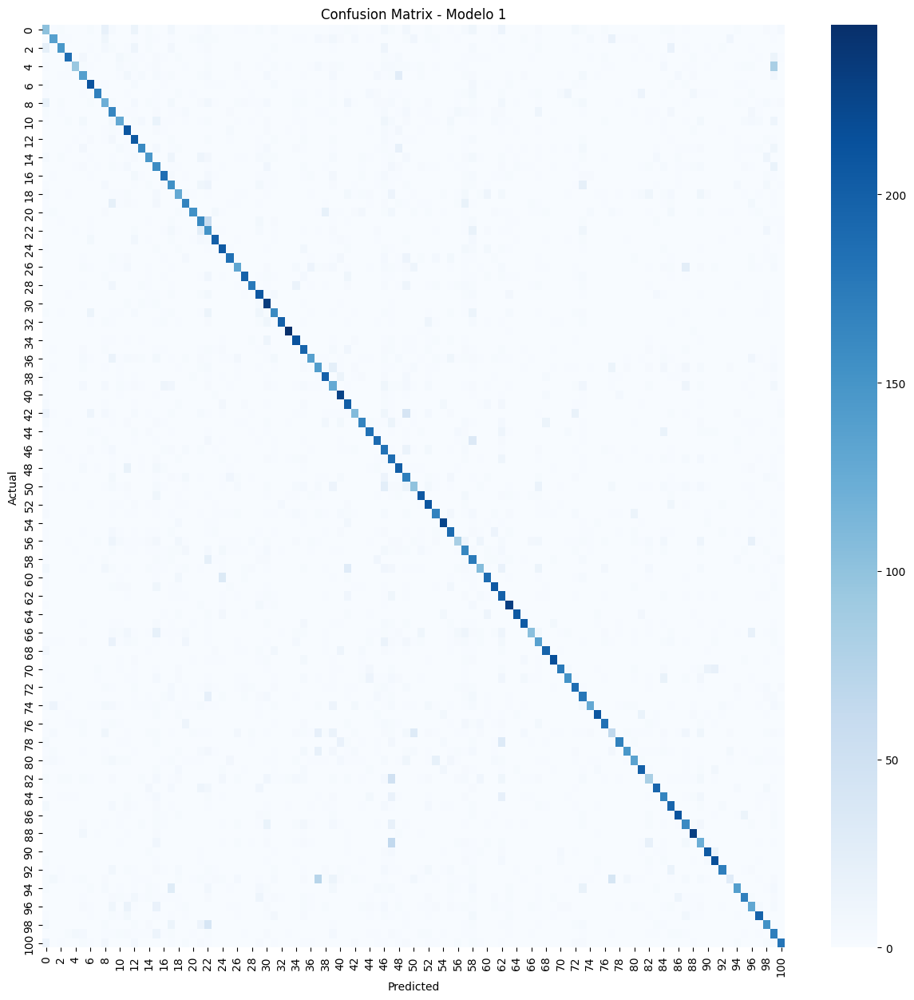

In [77]:
confusion1 = confusion_matrix(list_class, list_class_pred)

plt.figure(figsize=(15, 15)) 
sns.heatmap(confusion1, cmap="Blues", annot=False)# ,annot=True, fmt="d")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Modelo 1")
plt.show()

#### Matriz de Confusión - Modelo 2

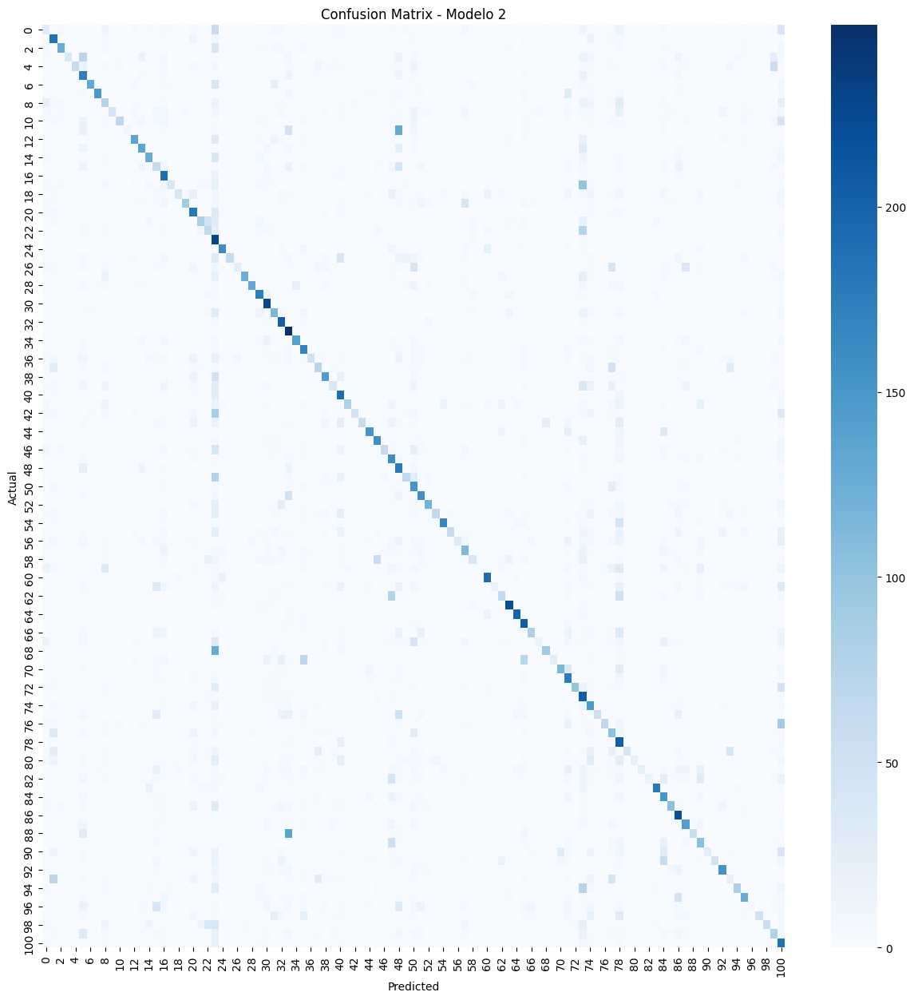

In [86]:
confusion2 = confusion_matrix(list_class2, list_class_pred2)

plt.figure(figsize=(15, 15)) 
sns.heatmap(confusion2, cmap="Blues", annot=False)# ,annot=True, fmt="d")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Modelo 2")
plt.show()

#### Métricas - Modelo 1

In [78]:
# Calcular el accuracy
accuracy = (np.trace(confusion1) / np.sum(confusion1))

# Calcular la precisión, el recall y el F1-Score para cada clase (101 clases)
precisions = np.zeros(101)
recalls = np.zeros(101)
f1_scores = np.zeros(101)

for i in range(101):
    TP = confusion1[i, i]
    FP = np.sum(confusion1[:, i]) - TP
    FN = np.sum(confusion1[i, :]) - TP

    # Calcular la precisión, el recall y el F1-Score para la clase i
    precisions[i] = TP / (TP + FP)
    recalls[i] = TP / (TP + FN)
    f1_scores[i] = 2 * (precisions[i] * recalls[i]) / (precisions[i] + recalls[i])

# Calcular el promedio de precisión, recall y F1-Score para todas las clases
average_precision = np.mean(precisions)
average_recall = np.mean(recalls)
average_f1_score = np.mean(f1_scores)

print("Accuracy:", accuracy)
print("Average Precision:", average_precision)
print("Average Recall:", average_recall)
print("Average F1-Score:", average_f1_score)

Accuracy: 0.6784554455445545
Average Precision: 0.707585155547408
Average Recall: 0.6784554455445543
Average F1-Score: 0.6794508174331417


#### Métricas - Modelo 2

In [87]:
# Calcular el accuracy
accuracy = (np.trace(confusion2) / np.sum(confusion2))

# Calcular la precisión, el recall y el F1-Score para cada clase (101 clases)
precisions = np.zeros(101)
recalls = np.zeros(101)
f1_scores = np.zeros(101)

for i in range(101):
    TP = confusion2[i, i]
    FP = np.sum(confusion2[:, i]) - TP
    FN = np.sum(confusion2[i, :]) - TP

    # Calcular la precisión, el recall y el F1-Score para la clase i
    precisions[i] = TP / (TP + FP)
    recalls[i] = TP / (TP + FN)
    f1_scores[i] = 2 * (precisions[i] * recalls[i]) / (precisions[i] + recalls[i])

# Calcular el promedio de precisión, recall y F1-Score para todas las clases
average_precision = np.mean(precisions)
average_recall = np.mean(recalls)
average_f1_score = np.mean(f1_scores)

print("Accuracy:", accuracy)
print("Average Precision:", average_precision)
print("Average Recall:", average_recall)
print("Average F1-Score:", average_f1_score)

Accuracy: 0.4278811881188119
Average Precision: 0.619711025945932
Average Recall: 0.4278811881188118
Average F1-Score: 0.4146452812883252


In [42]:
def plot_history(history): # Función para visualizar las métricas de entrenamiento y validación
    fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize=(20, 7))
    sns.lineplot

    #training
    sns.lineplot(history.history["loss"], ax = axes[0], label="Training Loss")
    sns.lineplot(history.history["accuracy"], ax = axes[1], label="Training Accuracy")

    # Validacion
    sns.lineplot(history.history["loss"], ax = axes[0], label="Validation Loss")
    sns.lineplot(history.history["accuracy"], ax = axes[1], label="Validation Accuracy")

    axes[0].set_title("Loss Comparison", fontdict = {'fontsize': 15})
    axes[0].set_xlabel("Epoch")
    axes[0].set_ylabel("Loss")

    axes[1].set_title("Accuracy Comparison", fontdict = {'fontsize': 15})
    axes[1].set_xlabel("Epoch")
    axes[1].set_ylabel("Accuracy")
    
    plt.tight_layout()
    plt.show()

In [45]:
model.history.history

{}

KeyError: 'loss'

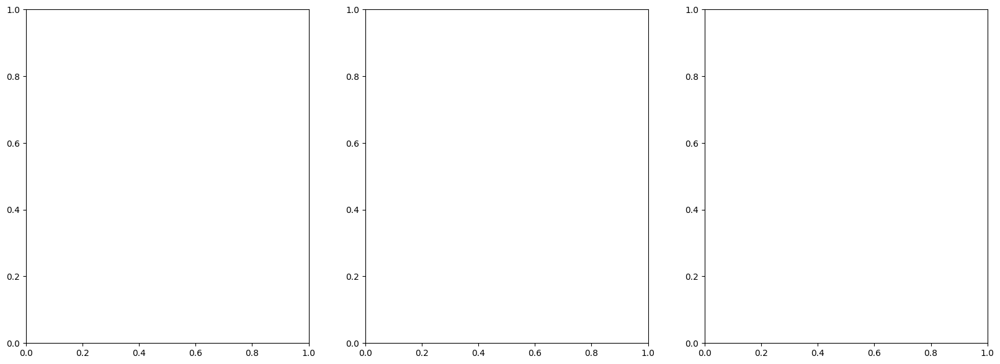

In [44]:
plot_history(model.history)

1/1 [==============================] - 0s 96ms/step


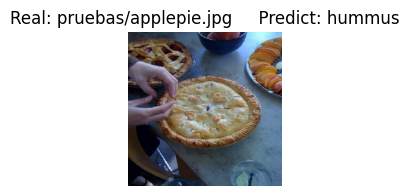

1/1 [==============================] - 0s 99ms/step


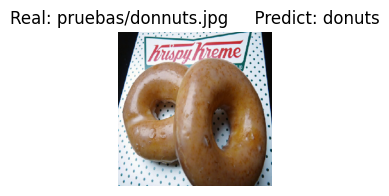

1/1 [==============================] - 0s 101ms/step


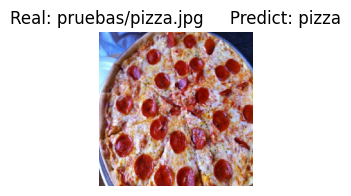

In [32]:
images = []
images.append('pruebas/applepie.jpg')
images.append('pruebas/donnuts.jpg')
images.append('pruebas/pizza.jpg')
predict_class(model, images, True)

1/1 [==============================] - 0s 94ms/step


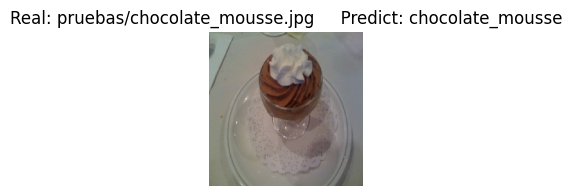

1/1 [==============================] - 0s 122ms/step


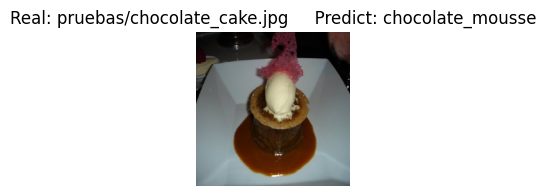

In [33]:
images = []
images.append('pruebas/chocolate_mousse.jpg')
images.append('pruebas/chocolate_cake.jpg')
predict_class(model, images, True)

1/1 [==============================] - 0s 98ms/step


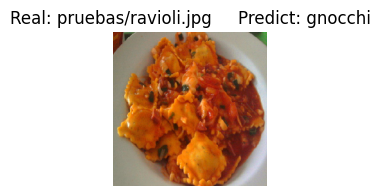

1/1 [==============================] - 0s 94ms/step


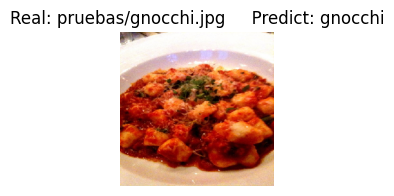

In [34]:
images = []
images.append('pruebas/ravioli.jpg')
images.append('pruebas/gnocchi.jpg')
predict_class(model, images, True)

1/1 [==============================] - 0s 99ms/step


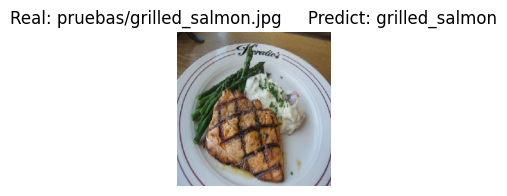

1/1 [==============================] - 0s 100ms/step


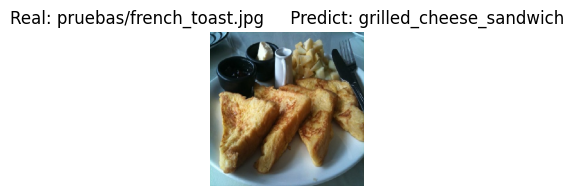

In [35]:
images = []
images.append('pruebas/grilled_salmon.jpg')
images.append('pruebas/french_toast.jpg')
predict_class(model, images, True)

1/1 [==============================] - 0s 103ms/step


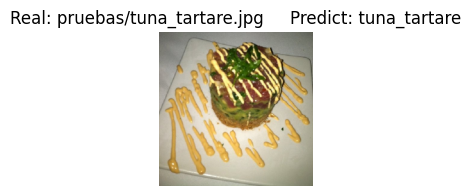

1/1 [==============================] - 0s 110ms/step


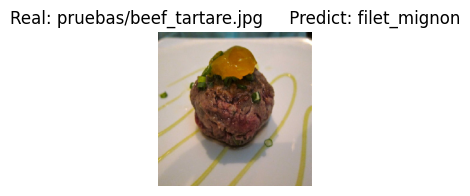

In [36]:
images = []
images.append('pruebas/tuna_tartare.jpg')
images.append('pruebas/beef_tartare.jpg')
predict_class(model, images, True)

1/1 [==============================] - 0s 102ms/step


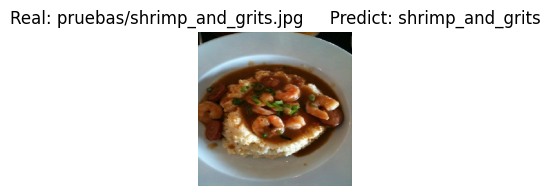

1/1 [==============================] - 0s 98ms/step


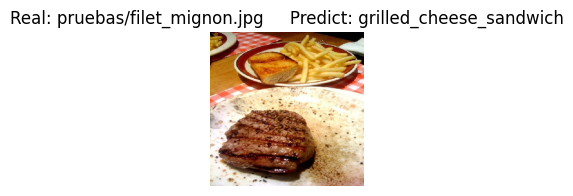

1/1 [==============================] - 0s 254ms/step


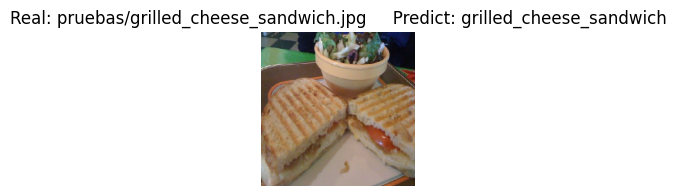

In [37]:
images = []
images.append('pruebas/shrimp_and_grits.jpg')
images.append('pruebas/filet_mignon.jpg')
images.append('pruebas/grilled_cheese_sandwich.jpg')
predict_class(model, images, True)

#### Resumen

<table>
    <thead>
        <tr>
            <th style="text-align: center">Clasificación</th>
            <th style="text-align: center">Clase correcta</th>
            <th style="text-align: center">Clase predecida</th>
        </tr>
    </thead>
    <tbody>
        <tr>
            <td style="text-align: center; background-color: #F9716A;">Incorrecto</td>
            <td style="text-align: center">applepie</td>
            <td style="text-align: center">hummus</td>
        </tr>
        <tr>
            <td style="text-align: center; background-color: #7CE871;">Correcto</td>
            <td style="text-align: center">donuts</td>
            <td style="text-align: center">donuts</td>
        </tr>
        <tr>
            <td style="text-align: center; background-color: #7CE871;">Correcto</td>
            <td style="text-align: center">pizza</td>
            <td style="text-align: center">pizza</td>
        </tr>
        <tr>
            <td style="text-align: center; background-color: #7CE871;">Correcto</td>
            <td style="text-align: center">chocolate_mousse</td>
            <td style="text-align: center">chocolate_mousse</td>
        </tr>
        <tr>
            <td style="text-align: center; background-color: #F9716A;">Incorrecto</td>
            <td style="text-align: center">chocolate_mousse</td>
            <td style="text-align: center">chocolate_cake</td>
        </tr>
        <tr>
            <td style="text-align: center; background-color: #F9716A;">Incorrecto</td>
            <td style="text-align: center">ravioli</td>
            <td style="text-align: center">gnocchi</td>
        </tr>
        <tr>
            <td style="text-align: center; background-color: #7CE871;">Correcto</td>
            <td style="text-align: center">gnocchi</td>
            <td style="text-align: center">gnocchi</td>
        </tr>
        <tr>
            <td style="text-align: center; background-color: #7CE871;">Correcto</td>
            <td style="text-align: center">grilled_salmon</td>
            <td style="text-align: center">grilled_salmon</td>
        </tr>
        <tr>
            <td style="text-align: center; background-color: #F9716A;">Incorrecto</td>
            <td style="text-align: center">french_toast</td>
            <td style="text-align: center">grilled_cheese_sandwich</td>
        </tr>
        <tr>
            <td style="text-align: center; background-color: #7CE871;">Correcto</td>
            <td style="text-align: center">tuna_tartare</td>
            <td style="text-align: center">tuna_tartare</td>
        </tr>
        <tr>
            <td style="text-align: center; background-color: #F9716A;">Incorrecto</td>
            <td style="text-align: center">beef_tartare</td>
            <td style="text-align: center">filet_mignon</td>
        </tr>
         <tr>
            <td style="text-align: center; background-color: #7CE871;">Correcto</td>
            <td style="text-align: center">shrimp_and_grits</td>
            <td style="text-align: center">shrimp_and_grits</td>
        </tr>
        <tr>
            <td style="text-align: center; background-color: #F9716A;">Incorrecto</td>
            <td style="text-align: center">filet_mignon</td>
            <td style="text-align: center">grilled_cheese_sandwich</td>
        </tr>
        <tr>
            <td style="text-align: center; background-color: #7CE871;">Correcto</td>
            <td style="text-align: center">grilled_cheese_sandwich</td>
            <td style="text-align: center">grilled_cheese_sandwich</td>
        </tr>
    </tbody>
</table>

# Exportar a formato Kaggle

Exportar datos en formato de subida Kaggle

In [38]:
list_class = []
list_class_pred = []
file_r = open("respaldo_3.txt","r")
lista_submission = []
cont = 0
for linea in file_r:
    linea = linea.split(',')
    #print(linea,lista[cont])
    list_class.append(linea[4])
    list_class_pred.append(linea[3])
    lista_submission.append([lista[cont],linea[0],linea[2]])
    cont += 1
lista_submission

[['images/caprese_salad/820512.jpg', '0', '3'],
 ['images/hamburger/2062556.jpg', '2', '35'],
 ['images/lasagna/2381454.jpg', '2', '43'],
 ['images/ceviche/1995.jpg', '2', '64'],
 ['images/poutine/892377.jpg', '2', '57'],
 ['images/beef_tartare/2231866.jpg', '2', '62'],
 ['images/caesar_salad/520203.jpg', '0', '2'],
 ['images/clam_chowder/3893405.jpg', '2', '11'],
 ['images/french_onion_soup/3433490.jpg', '2', '41'],
 ['images/caesar_salad/617389.jpg', '2', '29'],
 ['images/beet_salad/3633290.jpg', '0', '1'],
 ['images/ramen/1486860.jpg', '2', '60'],
 ['images/hot_and_sour_soup/1346061.jpg', '2', '25'],
 ['images/red_velvet_cake/765983.jpg', '1', '17'],
 ['images/hamburger/930645.jpg', '2', '35'],
 ['images/clam_chowder/1328819.jpg', '2', '11'],
 ['images/grilled_cheese_sandwich/654805.jpg', '2', '31'],
 ['images/macaroni_and_cheese/2208840.jpg', '2', '43'],
 ['images/nachos/1086832.jpg', '2', '46'],
 ['images/cup_cakes/1864824.jpg', '1', '11'],
 ['images/shrimp_and_grits/2278094.jpg',

In [39]:
print(dish_json_dict.keys())
print(food_categories_dict.keys())
print(hierarchy_dict.keys())

dict_keys(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71', '72', '73', '74', '75', '76', '77', '78', '79', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89', '90', '91', '92', '93', '94', '95', '96', '97', '98', '99', '100'])
dict_keys(['0', '1', '2'])
dict_keys(['salad', 'dessert', 'main_dish'])


In [40]:

l = []
for path,c,sc in lista_submission:
    clase = 'main_dish'
    if c == '0':
        clase = 'salad'
    elif c == '1':
        clase = 'dessert'
    sub = dish_json_dict[sc]
    clave = '0'
    for k in hierarchy_dict[clase].keys():
        if sub == hierarchy_dict[clase][k]:
                    
            print(hierarchy_dict[clase][k],' = ',sub)
            clave = k
    l.append([path,c,clave])
l

risotto  =  risotto
paella  =  paella
spaghetti_carbonara  =  spaghetti_carbonara
beef_carpaccio  =  beef_carpaccio
spring_rolls  =  spring_rolls
beef_tartare  =  beef_tartare
chicken_quesadilla  =  chicken_quesadilla
spaghetti_bolognese  =  spaghetti_bolognese
red_velvet_cake  =  red_velvet_cake
risotto  =  risotto
guacamole  =  guacamole
paella  =  paella
escargots  =  escargots
red_velvet_cake  =  red_velvet_cake
lobster_roll_sandwich  =  lobster_roll_sandwich
guacamole  =  guacamole
takoyaki  =  takoyaki
chicken_curry  =  chicken_curry
poutine  =  poutine
lobster_bisque  =  lobster_bisque
fish_and_chips  =  fish_and_chips
pad_thai  =  pad_thai
pad_thai  =  pad_thai
chicken_curry  =  chicken_curry
escargots  =  escargots
shrimp_and_grits  =  shrimp_and_grits
garlic_bread  =  garlic_bread
chicken_wings  =  chicken_wings
cheesecake  =  cheesecake
chicken_wings  =  chicken_wings
edamame  =  edamame
fish_and_chips  =  fish_and_chips
lobster_bisque  =  lobster_bisque
beef_carpaccio  =  b

[['images/caprese_salad/820512.jpg', '0', '0'],
 ['images/hamburger/2062556.jpg', '2', '62'],
 ['images/lasagna/2381454.jpg', '2', '51'],
 ['images/ceviche/1995.jpg', '2', '68'],
 ['images/poutine/892377.jpg', '2', '0'],
 ['images/beef_tartare/2231866.jpg', '2', '1'],
 ['images/caesar_salad/520203.jpg', '0', '0'],
 ['images/clam_chowder/3893405.jpg', '2', '0'],
 ['images/french_onion_soup/3433490.jpg', '2', '69'],
 ['images/caesar_salad/617389.jpg', '2', '2'],
 ['images/beet_salad/3633290.jpg', '0', '0'],
 ['images/ramen/1486860.jpg', '2', '9'],
 ['images/hot_and_sour_soup/1346061.jpg', '2', '67'],
 ['images/red_velvet_cake/765983.jpg', '1', '17'],
 ['images/hamburger/930645.jpg', '2', '62'],
 ['images/clam_chowder/1328819.jpg', '2', '0'],
 ['images/grilled_cheese_sandwich/654805.jpg', '2', '33'],
 ['images/macaroni_and_cheese/2208840.jpg', '2', '51'],
 ['images/nachos/1086832.jpg', '2', '19'],
 ['images/cup_cakes/1864824.jpg', '1', '0'],
 ['images/shrimp_and_grits/2278094.jpg', '2', '

In [34]:
hierarchy_dict['salad'].keys()

dict_keys(['0', '1', '2', '3', '4'])

In [41]:
file_send = open('data5.csv','w')
file_send.write('path,classes\n')
for linea in l:
    path,c,sb = linea
    text = path+','+c+' '+sb+'\n'
    file_send.write(text)
    #print(text)
file_send.close()